In [1]:
# Library Packages 
%run libraries.py 
from __future__ import division
#from tsfresh import extract_features

# Settings 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
seed = 7
np.random.seed(seed)

import warnings
warnings.filterwarnings('ignore')

def front(self, n):
    return self.iloc[:, :n]

def back(self, n):
    return self.iloc[:, -n:]

# Like normalization, standardization can be useful, and even required in some
# machine learning algorithms when your time series data has input values with differing scales.


from sklearn.preprocessing import StandardScaler

def Standardisation(df):
    listed = list(df)
    scaler = StandardScaler()
    scaled = scaler.fit_transform(df)
    df = pd.DataFrame(scaled)
    df.columns = listed
    return df



np.set_printoptions(threshold=np.nan)

!free -h

             total       used       free     shared    buffers     cached
Mem:          125G       122G       3.3G       4.4G        64M       4.7G
-/+ buffers/cache:       117G       8.0G
Swap:          15G        15G         0B


In [2]:
rat = pd.read_excel("ratio_tracker.xlsx")
act = pd.read_excel("acc_tracker.xlsx")

act = act[["Variable Name","Variable Description","Category"]]
rat = rat[["Variable Name","Financial Ratio","Category"]]
rat["Variable Description"] = rat["Financial Ratio"]
rat.drop("Financial Ratio",axis=1, inplace=True)

act["Type"] = "Fixed Value"
rat["Type"] = "Ratio"

ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
ract["Period"] = "Fixed Period"

#ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
#ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
#ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

ract_pct = pd.DataFrame()
ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
ract_pct["Category"] = ract["Category"]
ract_pct["Type"] = ract["Type"]
ract_pct["Period"] = "% Change"

blackt = pd.concat((ract,ract_pct),axis=0)

In [3]:
#  Reading in Bankrupt

fsmall = pd.read_csv("fixer_bankrupt.csv")

fbig = pd.read_csv("fixed_bankrupt.csv")

fcon = pd.merge(fsmall, fbig, on=["tic","datadate"], how="left")

frat = pd.read_csv("ratio_bankrupt.csv")

rat_fin = pd.merge(frat, fcon, left_on=["public_date","gvkey"], right_on=["datadate","gvkey_x"], how="left")

len(rat_fin["gvkey_x"].unique())

rat_fin_1 = rat_fin[~rat_fin["gvkey_x"].isnull()]

bank_dp = pd.read_excel("Merged_3.xlsx")

bank_dp = bank_dp.drop_duplicates("Ticker",keep="first")

bank_dp  = bank_dp[~bank_dp["Ticker"].isnull()]

bank_dp.shape



(873, 29)

In [4]:
# Editing Bankrupt

from datetime import datetime
from dateutil.parser import parse


mergy = pd.merge(rat_fin_1, bank_dp, left_on="tic", right_on="Ticker", how="left")

mergy['public_date'] = mergy['public_date'].apply(lambda x: parse(str(x)))

mergy['Date Filed']= pd.to_datetime(mergy['Date Filed'])

mergy = mergy[mergy['public_date']<mergy['Date Filed']]

mergy_2 = mergy.groupby(["tic"]).tail(3) # This is 4 in the old vers

len(mergy_2["gvkey"].unique())

def replace_first_x(group_df, x, value):
    group_df.iloc[:, :] = 1
    group_df.iloc[-x:, :] = value
    return group_df


mergy_2["Target"] = 1

mergy_2["Target"] = mergy_2[["Target","tic"]].groupby(["tic"]).apply(lambda mergy_2: replace_first_x(mergy_2, 2, 0))

In [5]:
dropsy = mergy_2["tic"].value_counts() >2

blom = np.where(dropsy==True)

dropsy = dropsy[:blom[0][-1]]

mergy_2 = mergy_2[mergy_2["tic"].isin(list(dropsy.index))]

print(len(mergy_2["tic"].unique()))

mergy_2 = mergy_2.reset_index(drop=True)

619


In [6]:
#Multiply by ratio, divide by year, divide by hoe many tickers in year

blok = {}

"""
blok[0] = mergy_2[mergy_2['public_date']<"1986-01-01"].shape[0]*10/4
blok[1] = (mergy_2[mergy_2['public_date']<"1996-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"1986-01-01"].shape[0])*10/4
blok[2] = (mergy_2[mergy_2['public_date']<"2006-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"1996-01-01"].shape[0])*10/4
blok[3] = (mergy_2[mergy_2['public_date']<"2016-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"2006-01-01"].shape[0])*10/4

"""

"""
blok[0] = 4500
blok[1] = 5700
blok[2] = 5700
blok[3] = 3700
"""

blok = {}

blok[0] = mergy_2[mergy_2['public_date']<"1986-01-01"].shape[0]*25/4
blok[1] = (mergy_2[mergy_2['public_date']<"1996-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"1986-01-01"].shape[0])*25/4
blok[2] = (mergy_2[mergy_2['public_date']<"2006-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"1996-01-01"].shape[0])*20/4
blok[3] = (mergy_2[mergy_2['public_date']<"2016-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"2006-01-01"].shape[0])*20/4


# Creating Artificial DataFrame

import random
random.seed(42)
conn = pd.DataFrame()
r = -1

for fixer, fixed, ratio in zip(["fixer_1976.csv","fixer_1986.csv","fixer_1996.csv","fixer_2006.csv"],
                               ["fixed_1976.csv","fixed_1986.csv","fixed_1996.csv","fixed_2006.csv"], 
                              ["ratio_1976.csv","ratio_1986.csv","ratio_1996.csv","ratio_2006.csv"]):

    r = r + 1
    
    fsmall = pd.read_csv(fixer)

    fbig = pd.read_csv(fixed)

    fcon = pd.merge(fsmall, fbig, on=["tic","datadate"], how="left")

    frat = pd.read_csv(ratio)
    

    rat_fin = pd.merge(frat, fcon, left_on=["public_date","gvkey"], right_on=["datadate","gvkey_x"], how="left")

    len(rat_fin["gvkey_x"].unique())

    rat_fin_1 = rat_fin[~rat_fin["gvkey_x"].isnull()]
    
    first = rat_fin_1

    first = first[~first["tic"].isin(list(mergy["tic"]))]
    
    first = first.sort_values(["tic","public_date"])

    first = first.groupby(["tic"]).tail(4)

    dropsy = first["tic"].value_counts() >3

    blom = np.where(dropsy==True)

    dropsy = dropsy[:blom[0][-1]]

    first = first[first["tic"].isin(list(dropsy.index))]

    first = first.reset_index(drop=True)
    first.shape

    name= list(first["tic"].unique())
    print(len(name))

    num_to_select = int(blok[r])       # set the number to select here.
    list_of = random.sample(name, num_to_select)

    first = first[first["tic"].isin(list_of)]
    print(first.shape)

    conn = conn.append(first)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/dsno800/anaconda3/envs/py35clean/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-6-9f3f002e83e7>", line 50, in <module>
    rat_fin = pd.merge(frat, fcon, left_on=["public_date","gvkey"], right_on=["datadate","gvkey_x"], how="left")
  File "/home/dsno800/anaconda3/envs/py35clean/lib/python3.5/site-packages/pandas/tools/merge.py", line 62, in merge
    return op.get_result()
  File "/home/dsno800/anaconda3/envs/py35clean/lib/python3.5/site-packages/pandas/tools/merge.py", line 564, in get_result
    concat_axis=0, copy=self.copy)
  File "/home/dsno800/anaconda3/envs/py35clean/lib/python3.5/site-packages/pandas/core/internals.py", line 4825, in concatenate_block_managers
    placement=placement) for placement, join_units in concat_plan]
  File "/home/dsno800/anaconda3/envs/py35clean/lib/python3.5/site-packages/pandas/core/inte

KeyboardInterrupt: 

In [ ]:
conn.head()

In [ ]:
# I think up and till here everything is good.

# Full Merge and Edit

print(conn.shape)

conn = conn.reset_index(drop=True)

conn_1 = pd.merge(conn,bank_dp, left_on=["tic"], right_on=["Ticker"], how="left")

conn_1["Target"] = 1

connect = pd.concat((conn_1, mergy_2), axis=0)

connect.shape

connect = connect.drop(bank_dp.columns,axis=1)

connect = connect.reset_index(drop=True)
print(connect.shape)

saved = connect[["adate","Target","conm_x","consol","conm_y","costat","curcd","cusip_x","cusip_y","gvkey","gvkey_x","gvkey_y","datadate","indfmt","datafmt","tic","state","public_date","qdate","divyield"]]

connect = connect.drop(["adate","popsrc","conm_x","consol","conm_y","costat","curcd","cusip_x","cusip_y","gvkey","gvkey_x","gvkey_y","tic","datadate","indfmt","datafmt","state","public_date","qdate","divyield"],axis=1)

In [8]:
# Imputation

from fancyimpute import KNN

# df is my data frame with the missings. I keep only floats
df_numeric = connect.select_dtypes(include=[np.float]).as_matrix()

# I now run fancyimpute KNN, 
# it returns a np.array which I store as a pandas dataframe
df_filled_1 = pd.DataFrame(KNN(6).complete(df_numeric))

df_filled_1.columns = connect.select_dtypes(include=[np.float]).columns
df_filled_1.index = connect.select_dtypes(include=[np.float]).index
connect = df_filled_1.copy()

connect_2 = df_filled_1.pct_change().copy()

cols = []

for i in df_filled_1.columns:
    cols.append(i+'_prtc')

connect_2 = connect_2.replace("-inf",np.nan)
connect_2 = connect_2.replace("inf",np.nan)
connect_2.columns = cols

# df is my data frame with the missings. I keep only floats

df_numeric = connect_2.select_dtypes(include=[np.float]).as_matrix()
df_filled = pd.DataFrame(KNN(3).complete(df_numeric))
df_filled.columns = connect_2.select_dtypes(include=[np.float]).columns
df_filled.index = connect_2.select_dtypes(include=[np.float]).index
connect_2 = df_filled.copy()

Imputing row 1/41409 with 95 missing, elapsed time: 2133.476
Imputing row 101/41409 with 32 missing, elapsed time: 2134.458
Imputing row 201/41409 with 94 missing, elapsed time: 2135.103
Imputing row 301/41409 with 31 missing, elapsed time: 2135.801
Imputing row 401/41409 with 32 missing, elapsed time: 2136.420
Imputing row 501/41409 with 30 missing, elapsed time: 2137.053
Imputing row 601/41409 with 24 missing, elapsed time: 2137.778
Imputing row 701/41409 with 32 missing, elapsed time: 2138.668
Imputing row 801/41409 with 43 missing, elapsed time: 2139.281
Imputing row 901/41409 with 49 missing, elapsed time: 2139.932
Imputing row 1001/41409 with 72 missing, elapsed time: 2140.670
Imputing row 1101/41409 with 36 missing, elapsed time: 2141.385
Imputing row 1201/41409 with 33 missing, elapsed time: 2142.025
Imputing row 1301/41409 with 149 missing, elapsed time: 2142.620
Imputing row 1401/41409 with 32 missing, elapsed time: 2143.367
Imputing row 1501/41409 with 23 missing, elapsed ti

In [9]:
# If those weird percentage shows up, rerun the top saved cells. 


connect_2 = connect_2.reset_index(drop=True)
connect = connect.reset_index(drop=True)

connect_3 = pd.concat((connect, connect_2),axis=1).copy()

connect_3 = pd.concat((saved[["tic","Target","public_date"]],connect_3),axis=1)

connect_3 = connect_3.groupby('tic').apply(lambda group: group.iloc[1:, 1:]).reset_index()

connect_3 = connect_3.drop(["level_1"],axis=1)

full_3 = pd.merge(connect_3,bank_dp,left_on="tic",right_on="Ticker",how="left")

connect_3 = connect_3.drop(['tic'],axis=1)

In [10]:
connect_3.to_csv("connect_correct.csv")

In [11]:
full_3.to_csv("full_3_correct.csv")

In [12]:
saved.to_csv("saved_1_correct.csv")

## Start Here

In [24]:
1+1

2

In [7]:
#full_3 = pd.read_csv("full_3_big.csv")
full_3 = pd.read_csv("full_3_correct.csv")
full_3 = full_3.ix[:,1:]
connect_3 = full_3.drop(bank_dp.columns,axis=1)

"""
connect_3 = pd.read_csv("connect_3_big.csv")
connect_3 = connect_3.ix[:,1:]
connect_3.shape
"""

#saved = pd.read_csv("saved_1_big.csv")
saved = pd.read_csv("saved_1_correct.csv")
saved = saved.ix[:,1:]

connect_3["Target"].value_counts()


bill = {}
bill["sw"] = full_3[full_3["Region"]=="Southwest"]
bill["ne"] = full_3[full_3["Region"]=='Northeast']
bill["w"] = full_3[full_3["Region"]=='West']
bill["mw"] = full_3[full_3["Region"]=='Midwest']
bill["se"] = full_3[full_3["Region"]=='Southeast']

"""

#final.to_csv("final_pct.csv")
saved.to_csv("saved_pct.csv")

#final = connect_3
#final.to_csv("final.csv")
#saved.to_csv("saved.csv")

"""

connect_3[connect_3["Target"]==1].shape

saved[saved["Target"]==1].shape

connect_3 = connect_3.reset_index(drop=True)
connect_3["Target"] = connect_3["Target"].apply(lambda x: 0 if (x==1) else 1)
saved["Target"] = saved["Target"].apply(lambda x: 0 if (x==1) else 1)


saved['public_date'] = saved['public_date'].apply(lambda x: parse(str(x)))

saved = saved.sort_values("public_date").reset_index()

connect_3['public_date'] = connect_3['public_date'].apply(lambda x: parse(str(x)))

connect_3 = connect_3.sort_values("public_date").reset_index(drop=True)



connect_3.shape

(33251, 311)

In [35]:
import pickle

tickers = bank_dp.drop_duplicates(subset="Headquarters City").reset_index(drop=True)
tickers = tickers[~tickers["Region"].isin(["Outside"])].reset_index(drop=True)
tickers = tickers[~tickers["Region"].isnull()].reset_index(drop=True)
saved_1 = pd.merge(saved, tickers, left_on=["state"], right_on=["Headquarters City"], how="left")    

full_sample = 1

if full_sample == 1:
    
    final = connect_3.copy()
    
    #final = final.drop(nice.values,axis=1)
    
    final = final[final["public_date"]>"2008-01-01"].reset_index(drop=True)
    
    final = final.drop(["public_date"],axis=1)
    
    """
        
    final = pd.DataFrame()
    
    blue = saved_1[saved_1["Target"]==1].reset_index(drop=True).drop(["Target","tic"],axis=1)  # This has to be zero because old
    
    connect_4 = connect_3.drop(['public_date'],axis=1)
    
    red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy()

    final_two = pd.concat((blue,red),axis=1)

    final_one = final_two.groupby('tic').tail(2).reset_index(drop=True)
    
    tmp = pd.DataFrame(columns=blue.columns)
    
    connect_5 = pd.concat([tmp,connect_4 ], axis=1).fillna('')
    
    
    #drop = connect_5[connect_5["Target"]==0].reset_index(drop=True).drop_duplicates(subset="tic",keep="last")

    #final_one = pd.concat((final_one, drop ),axis=0).reset_index(drop=True)
    

    final_one = pd.concat((final_one, connect_5[connect_5["Target"]==0].reset_index(drop=True)),axis=0).reset_index(drop=True)
    
    #final_one['public_date'] = final_one['public_date'].apply(lambda x: parse(x))
    
    #final_one = final_one.sort_values("public_date") 

    final = final_one.drop(blue.columns, axis=1)
    
    #final = final_one.drop(["tic","public_date","Region"],axis=1).copy()
    
    """
    
elif full_sample == 2:
    final = pd.DataFrame()
    
    blue = saved_1[saved_1["Target"]==1].reset_index(drop=True).drop(["Target","tic"],axis=1)  # This has to be zero because old
    
    connect_4 = connect_3.drop(['public_date'],axis=1)
    
    red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy()

    final_two = pd.concat((blue,red),axis=1)

    #final_one = final_two.groupby('tic').head(1).reset_index(drop=True)
    
    final_one = final_two.groupby('tic').tail(1).reset_index(drop=True)
    
    tmp = pd.DataFrame(columns=blue.columns)
    
    connect_5 = pd.concat([tmp,connect_4 ], axis=1).fillna('')

    final_one = pd.concat((final_one, connect_5[connect_5["Target"]==0].reset_index(drop=True)),axis=0).reset_index(drop=True)
    
    final = final_one.drop(blue.columns, axis=1)

    
    #final = final_one.drop(["tic","public_date","Region"],axis=1).copy()

    
final = final.rename(columns={'at_x': 'at', 'at_x_prtc': 'at_prtc'})

Y = final["Target"]

X = final.drop(["tic","Target","sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)

#X = final.drop(["tic","Target","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
#X = X.drop(["sic","naics","cik","emol"],axis=1)


print(Y.value_counts())

import xgboost as xgb
from xgboost.sklearn import XGBClassifier

"""

bit = 0
split = 25023
#int(.75*X.shape[0])
top = 33365
#X.shape[0] - 1

X_train, Y_train, X_test, Y_test = X[bit:split], Y[bit:split], X[split:top], Y[split:top]

"""


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=0)


y_train = list(Y_train.values)
y_test = list(Y_test.values)

0    9490
1     275
Name: Target, dtype: int64


In [36]:
# Should be colsample_bytree= 0.2 -> Done for another visualisation. 
clf = XGBClassifier(
                      max_depth=12,
                      objective= 'binary:logistic', 
                      silent=0, 
                      seed=29,
                      nthread= 1,
                      n_estimators= 5000,
                      min_child_weight= 0,
                      learning_rate= 0.1,
                      colsample_bytree= 0.2,
                      subsample= 0.8
)

# 5000, 200

    

clf.fit(X_train, y_train)

pickle.dump(clf, open("ganker_gfc.sav", 'wb'))

#pickle.dump(clf, open("ganker_sans_assets.sav", 'wb'))

#pickle.dump(clf, open("ganker_depth6.sav", 'wb'))
# pickle.dump(clf, open("ganker_sans_value.sav", 'wb'))
#pickle.dump(clf, open("ganker_sans_prct.sav", 'wb'))
#pickle.dump(clf, open("banker_2Y.sav", 'wb'))
#pickle.dump(clf, open("anker_1Y.sav", 'wb'))
#pickle.dump(clf, open("anker.sav", 'wb'))

#clf = pickle.load(open("banker.sav", 'rb'))

y_predict = clf.predict(X_test)
y_predict_prob = clf.predict_proba(X_test)
#print metrics.accuracy_score(y_test, y_predict)

In [37]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import log_loss
from sklearn.metrics import brier_score_loss

#clf = pickle.load(open("banker.sav", 'rb'))
#clf = pickle.load(open("banker_2Y.sav", 'rb'))

#clf = pickle.load(open("anker_time.sav", 'rb'))
#clf = pickle.load(open("ganker_small.sav", 'rb'))

#clf = pickle.load(open("ganker_sans_prct.sav", 'rb'))

#clf = pickle.load(open("ganker_sans_value.sav", 'rb'))

#clf = pickle.load(open("ganker_depth6.sav", 'rb'))


clf = pickle.load(open("ganker_gfc.sav", 'rb'))

#clf = pickle.load(open("banker_1Y.sav", 'rb'))

y_predict = clf.predict(X_test)
y_predict_prob = clf.predict_proba(X_test)
#print metrics.accuracy_score(y_test, y_predict)


"""
gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X_test.columns.values})

#bm, nopiq, intanq, niq,adjex, piq, oibdpq
gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)
"""

import eli5
gb = eli5.explain_weights_df(clf, importance_type="gain")

print(classification_report(y_test, y_predict))

# Connect These 

rat = pd.read_excel("ratio_tracker.xlsx")
act = pd.read_excel("acc_tracker.xlsx")

act = act[["Variable Name","Variable Description","Category"]]
rat = rat[["Variable Name","Financial Ratio","Category"]]
rat["Variable Description"] = rat["Financial Ratio"]
rat.drop("Financial Ratio",axis=1, inplace=True)

act["Type"] = "Fixed Value"
rat["Type"] = "Ratio"

ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
ract["Period"] = "Fixed Period"

#ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
#ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
#ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

ract_pct = pd.DataFrame()
ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
ract_pct["Category"] = ract["Category"]
ract_pct["Type"] = ract["Type"]
ract_pct["Period"] = "% Change"

blackt = pd.concat((ract,ract_pct),axis=0)


gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")

confusion_mat = confusion_matrix(y_test,y_predict)

TN = confusion_mat[0][0]
FP = confusion_mat[0][1]
TP = confusion_mat[1][1]
FN = confusion_mat[1][0]

TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Precision or positive predictive value
PPV = TP/(TP+FP)
# Negative predictive value
NPV = TN/(TN+FN)
# Fall out or false positive rate
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)
# False discovery rate
FDR = FP/(TP+FP)

ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
print(ll)
br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. 
print(br) # very similar to false discovery rate. So your fine. 
acc = accuracy_score(y_test, y_predict)
print(acc)
auc = roc_auc_score(y_test, y_predict_prob[:,1])
print(auc)
prc = average_precision_score(y_test, y_predict_prob[:,1]) 
print(prc) # This is a useless measure

print("Bankrupt")
print(PPV)
print(FPR)
print(FDR)

print("Healthy")
print(NPV)
print(FNR)


#9604 - Three
#9172 - One
#Accuracy AUC and Errors an Confusion matrix with Percentages. 


# Second Type


data = np.array([np.arange(1)]*1).T

df_exec = pd.DataFrame(data)

df_exec["Average Log Likelihood"] = ll
df_exec["Brier Score Loss"] = br
df_exec["Accuracy Score"] = acc
df_exec["ROC AUC Sore"] = auc
df_exec["Average Precision Score"] = prc
df_exec["Precision - Bankrupt Firms"] = PPV
df_exec["False Positive Rate (p-value)"] = FPR
df_exec["Precision - Healthy Firms"] = NPV
df_exec["False Negative Rate (recall error)"] = FNR
df_exec["False Discovery Rate "] = FDR
df_exec["All Observations"] = TN + TP + FN + FP

df_exec["Bankruptcy Sample"] = TP + FN
df_exec["Healthy Sample"] = TN + FP

df_exec["Recalled Bankruptcy"] = TP + FP
df_exec["Correct (True Positives)"] = TP
df_exec["Incorrect (False Positives)"] = FP

df_exec["Recalled Healthy"] = TN + FN
df_exec["Correct (True Negatives)"] = TP
df_exec["Incorrect (False Negatives)"] = FP


#df_exec = df_exec.T


#log = log.append(df_exec)


             precision    recall  f1-score   support

          0       0.99      1.00      0.99      2375
          1       0.94      0.46      0.62        67

avg / total       0.98      0.98      0.98      2442

0.0853670911114
0.0136291069164
0.984438984439
0.978218381775
0.786222940509
Bankrupt
0.939393939394
0.000842105263158
0.0606060606061
Healthy
0.985056039851
0.537313432836


In [31]:
df_exec.to_csv("metrics_sans_assets.csv")

In [38]:
gb.to_csv("gfc_features.csv")

In [76]:
#gt= ["ps","PEG_trailing","PEG_ltgforward","CAPEI","PEG_1yrforward","act","ao","GProf","accrual","dltr_prtc","adv_sale_prtc","seq_prtc","ivaeq"]

gt = ["pi","xint","ppent","ib","niadj","lt","ps","invt","oiadp","at" ]


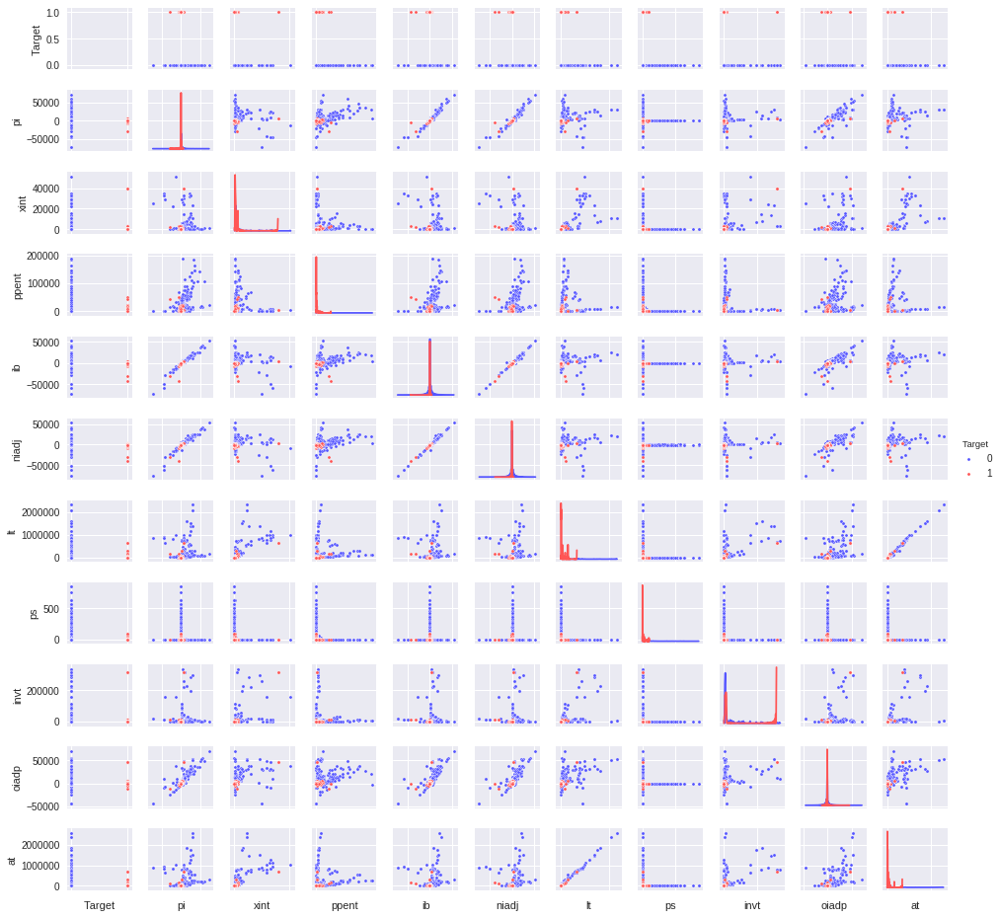

In [77]:
kt = ["Target","pi","xint","ppent","ib","niadj","lt","ps","invt","oiadp","at"]
g = sns.pairplot(final[kt], hue='Target', palette = 'seismic',size=1.2,diag_kind = 'kde',diag_kws=dict(shade=True),plot_kws=dict(s=10) )
g.set(xticklabels=[])

In [10]:
X.head()

,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,aqc,at_turn,at,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,aqc_prtc,at_turn_prtc,at_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc
0,9.300,0.110,0.338565,0.232077,0.213381,0.064,0.465,27.499,0.0,-0.052,-0.052,-0.044,1.716,0.247167,9.424,-0.769874,0.000,1.384,54.020,3.266,0.000,1.260,83.356,0.209,0.130,0.222,37.009,0.011,2.217,70.797,0.584,3.209,0.352,0.260,0.016,0.159,-0.675,0.000,1.000,0.218105,0.000,0.000,0.000,0.000,38.399,2.972,0.461000,0.296,0.418000,-1.07,-1.07,1.000,0.0,-14.283,0.714,0.000000,-1.038399,-1.393,0.080,-2.606,-2.606,0.21243,0.066,0.000,-37.204,-75.833,7.113,0.471591,7.465,0.367,0.765536,0.0,0.0,0.694,-1.535927,0.015945,1.063,11.487,0.000,17.011,0.000,0.515,0.0,-2.606,0.451,-0.028,3.198657,0.163,-6.222,-3.254,-0.056,-0.017,17.623882,9.744,10.445,-6.696000,-6.696000,-17.726033,-17.690328,-5.132,24.805,-0.078,-0.091,-0.152,0.0,0.187,0.0,0.313,-0.057,2.031,0.000,0.399531,17.352,0.526,5.386,-0.023,-0.102,-0.045,74.651,1.871,1.871,4.119,37.009,1.000,0.084,0.744,1.217,-0.379164,0.000,0.0,1.248181,0.021,-0.375125,0.000000,-0.309,5.524,0.000,-2.526,0.000,0.105,0.211252,7.108,-0.167860,-1.179153,-0.170069,-0.652191,-0.773721,0.361702,-0.275701,0.032090,-0.137109,-2.238095,-2.238095,-2.157895,3.457143,-3.539163,0.264118,-3.460764,-0.334578,0.037481,-0.001331,0.392157,0.660245,0.491124,0.167794,-2.559701,-0.462810,-0.488479,-0.072712,-0.884211,0.048227,0.075076,0.048474

In [78]:
data = [
    go.Heatmap(
        z= X[gt].astype(float).corr().values ,
        x=X[gt].columns.values,
        y= X[gt].columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')


In [79]:
data = [
    go.Heatmap(
        z= X[dt].astype(float).corr().values ,
        x=X[dt].columns.values,
        y= X[dt].columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')


In [724]:
df_exec.to_csv("metrics_6depth.csv")

In [37]:
import eli5
dra = eli5.explain_weights_df(clf, importance_type="gain")

In [17]:
eli5.explain_prediction()

IndexError: tuple index out of range

In [18]:
eli5.explain_weights()

IndexError: tuple index out of range

In [796]:
df_exec.to_csv("metric_6depth.csv")

In [39]:
gb["Category"] = gb["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
cat = gb.groupby(["Category"]).sum().reset_index()
cat = cat.sort_values("weight", ascending=False)

typ = gb.groupby(["Type"]).sum().reset_index()
typ = typ.sort_values("weight", ascending=False)

per = gb.groupby(["Period"]).sum().reset_index()
per = per.sort_values("Period", ascending=False)

In [40]:
cat

,Category,weight
0,Asset,0.173265
10,Solvency,0.171101
5,Income,0.139476
11,Valuation,0.138973
6,Liability,0.107938
9,Profitability,0.076968
4,Expense,0.058396
3,Equity,0.055571
2,Efficiency,0.036262
8,Other,0.018380


In [44]:
typ

,Type,weight
0,Fixed Value,0.567256
1,Ratio,0.432744


In [45]:
per

,Period,weight
1,Fixed Period,0.670449
0,% Change,0.329551


In [49]:
cons = gb.groupby(["Period","Type"]).sum().reset_index()
cons = cons.sort_values("weight", ascending=False)

In [50]:
cons

,Period,Type,weight
2,Fixed Period,Fixed Value,0.395129
3,Fixed Period,Ratio,0.275319
0,% Change,Fixed Value,0.172127
1,% Change,Ratio,0.157425


In [117]:
gb.to_csv("features_second.csv")

In [90]:
df_exec.to_csv("metrics_anker.csv")

In [12]:
connect_3.to_csv("r_frame.csv")

In [19]:
%matplotlib inline

from sklearn.datasets import make_friedman1
from sklearn.ensemble import GradientBoostingClassifier

import pickle

tickers = bank_dp.drop_duplicates(subset="Headquarters City").reset_index(drop=True)
tickers = tickers[~tickers["Region"].isin(["Outside"])].reset_index(drop=True)
tickers = tickers[~tickers["Region"].isnull()].reset_index(drop=True)
saved_1 = pd.merge(saved, tickers, left_on=["state"], right_on=["Headquarters City"], how="left")    

full_sample = 1


final = connect_3.copy()

#final = final.drop(nice.values,axis=1)

final = final.drop(["public_date"],axis=1)
    


    
final = final.rename(columns={'at_x': 'at', 'at_x_prtc': 'at_prtc'})

Y = final["Target"]

X = final.drop(["tic","Target","sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)

#X = final.drop(["tic","Target","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
#X = X.drop(["sic","naics","cik","emol"],axis=1)


print(Y.value_counts())

import xgboost as xgb
from xgboost.sklearn import XGBClassifier

"""

bit = 0
split = 25023
#int(.75*X.shape[0])
top = 33365
#X.shape[0] - 1

X_train, Y_train, X_test, Y_test = X[bit:split], Y[bit:split], X[split:top], Y[split:top]

"""

names=["ibc","totdebt_invcap","pi","ps","epspx",
       "lt","xint","dltt","debt_assets","ppent"]

X = X[names]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=0)


y_train = list(Y_train.values)
y_test = list(Y_test.values)



clf = GradientBoostingClassifier(n_estimators=100).fit(X_train, y_train)


pickle.dump(clf, open("gb.sav", 'wb'))

0    32013
1     1238
Name: Target, dtype: int64


In [21]:
clf = pickle.load(open("gb.sav", 'rb'))

from pdpbox import pdp
# for binary feature
pdp_sex = pdp.pdp_isolate(clf, X_train, 'ibc')

ImportError: No module named 'pdpbox'

Custom 3d plot via ``partial_dependence``
Custom 3d plot via ``partial_dependence``
Custom 3d plot via ``partial_dependence``
Custom 3d plot via ``partial_dependence``


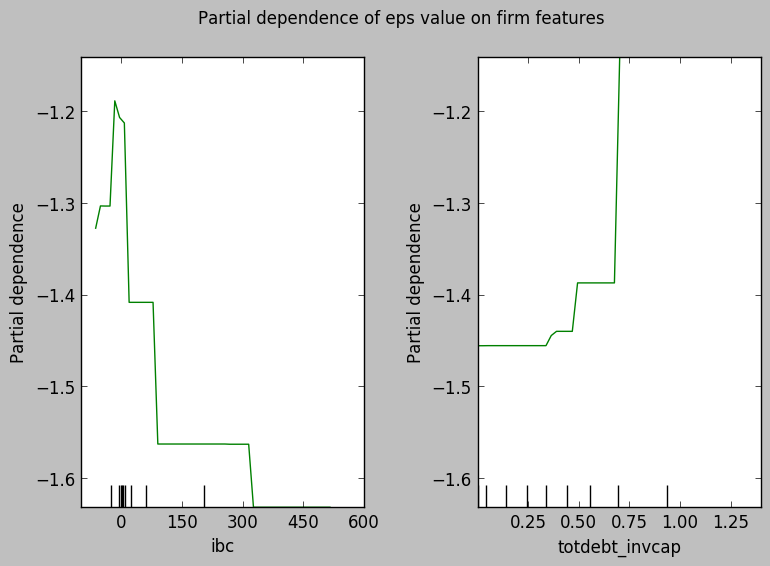

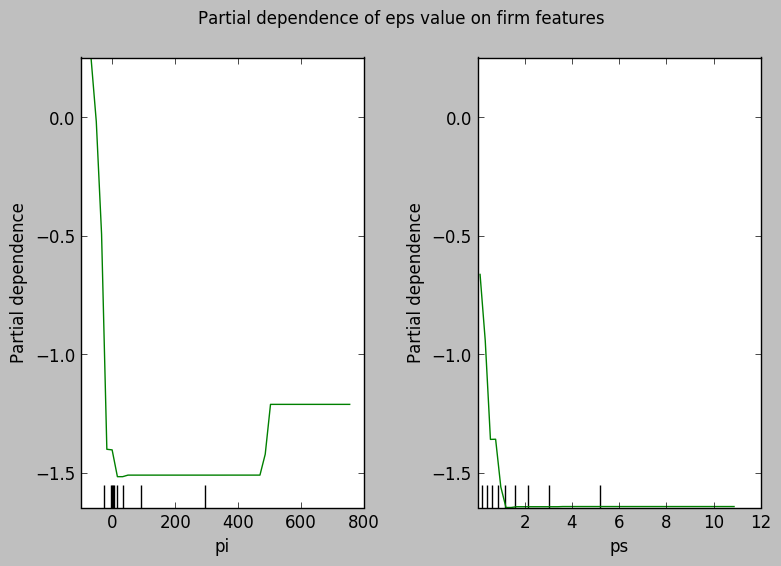

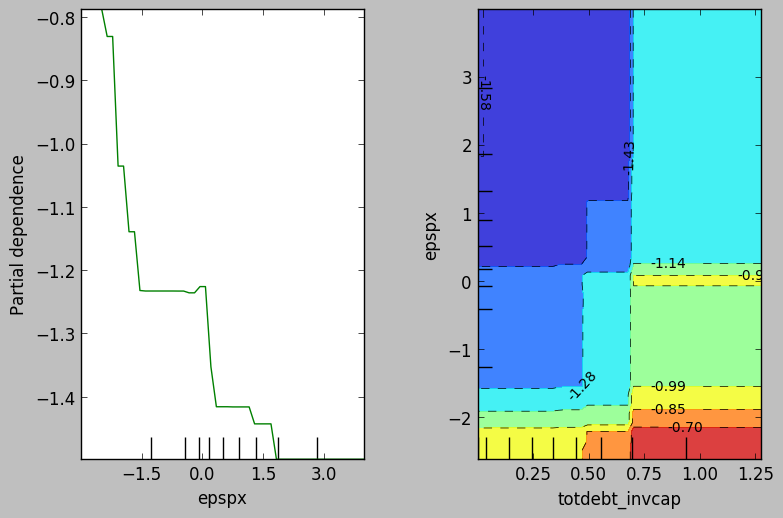

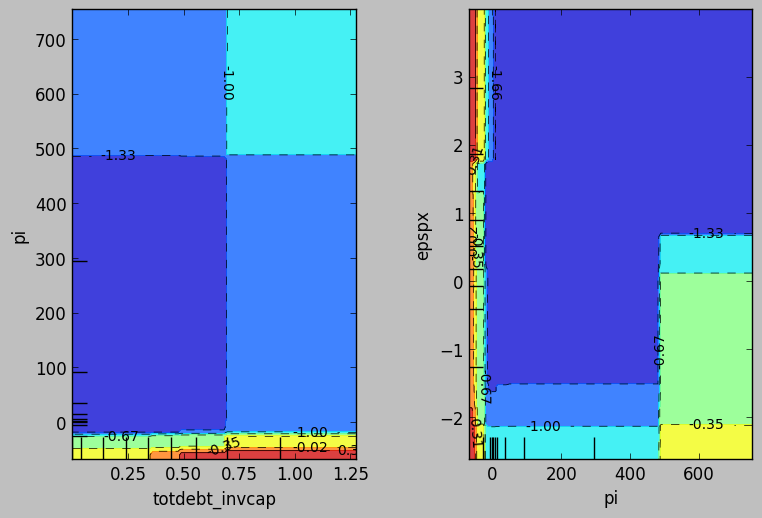

In [16]:
from sklearn.ensemble.partial_dependence import plot_partial_dependence
from sklearn.ensemble.partial_dependence import partial_dependence

clf = pickle.load(open("gb.sav", 'rb'))

fig, axs = plot_partial_dependence(clf, X_train, [0,1], names, grid_resolution=50) 

# I think this below will work and then give me some interesting information to diy chart. 
#pdp, axes = partial_dependence(clf,[0,1,2,3,4], X=X_train,  grid_resolution=400)


# (0, 1)

#plt.style.use('classic')


fig.suptitle('Partial dependence of eps value on firm features')
plt.subplots_adjust(top=0.9)  # tight_layout causes overlap with suptitle

print('Custom 3d plot via ``partial_dependence``')
fig = plt.figure()

fig, axs = plot_partial_dependence(clf, X_train, [2,3], names, grid_resolution=50) 

# I think this below will work and then give me some interesting information to diy chart. 
#pdp, axes = partial_dependence(clf,[0,1,2,3,4], X=X_train,  grid_resolution=400)


# (0, 1)

#plt.style.use('classic')

fig.suptitle('Partial dependence of eps value on firm features')
plt.subplots_adjust(top=0.9)  # tight_layout causes overlap with suptitle

print('Custom 3d plot via ``partial_dependence``')
fig = plt.figure()

fig, axs = plot_partial_dependence(clf, X_train, [4,(1,4)], names, grid_resolution=50) 

# I think this below will work and then give me some interesting information to diy chart. 
#pdp, axes = partial_dependence(clf,[0,1,2,3,4], X=X_train,  grid_resolution=400)


# (0, 1)

#plt.style.use('classic')

fig.suptitle('')
plt.subplots_adjust(top=0.9)  # tight_layout causes overlap with suptitle

print('Custom 3d plot via ``partial_dependence``')
fig = plt.figure()


fig, axs = plot_partial_dependence(clf,  X_train,   [(1,2), (2,4)], names) 

# I think this below will work and then give me some interesting information to diy chart. 
#pdp, axes = partial_dependence(clf,[0,1,2,3,4], X=X_train,  grid_resolution=400)


# (0, 1)

fig.suptitle('')
plt.subplots_adjust(top=0.9)  # tight_layout causes overlap with suptitle

print('Custom 3d plot via ``partial_dependence``')
plt.style.use('classic')
fig = plt.figure()

In [89]:
%load_ext rpy2.ipython

In [100]:
%R require(ggplot2)

array([1], dtype=int32)

In [102]:
%R -i final

In [ ]:
!%R
1+1

In [ ]:
%%R
library(pdp)
library(ggplot2)


In [ ]:
1+1

In [ ]:
1+1

In [ ]:
library(pdp)
library(ggplot2)



In [277]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import roc_auc_score
from sklearn.cross_validation import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold


full_sample = True

if full_sample == True:
    final = connect_3.copy()
    
    #final = final.drop("public_date",axis=1)
    
else:
    # Delete if all ********
    print("One")
    final = pd.DataFrame()
    blue = saved[saved["Target"]==1].reset_index(drop=True).copy()
    connect_4 = connect_3.drop(['public_date'],axis=1)
    red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy().reset_index(drop=True)

    final_das = pd.concat((blue[["tic","public_date"]],red),axis=1)

    final_one = final_das.groupby(['tic']).tail(1).reset_index(drop=True)

    blue = saved[saved["Target"]==0].reset_index(drop=True).copy()
    red = connect_4[connect_4["Target"]==0].reset_index(drop=True).copy()

    final_two = pd.concat((blue[["tic","public_date"]],red),axis=1).reset_index(drop=True)

    final = pd.concat((final_one, final_two ),axis=0).reset_index(drop=True)

    final = final.reset_index(drop=True)

    final = final.sort_values("public_date").reset_index(drop=True)

    #final = final[np.isfinite(final['Target'])]
    
    final = final[~final["Target"].isnull()].reset_index(drop=True)
    
    final = final.drop("tic",axis=1)
    
    final = final.reset_index(drop=True)
    

    
    
final = final.rename(columns={'at_x': 'at', 'at_x_prtc': 'at_prtc'})

final["public_date"] = final["public_date"].apply(lambda x: parse(str(x)))

tscv = TimeSeriesSplit(n_splits=10)

#kf = KFold(n_splits=10,random_state=1000) 

#print(tscv) 
aDict = {}
dit= -2
dit = dit +1


log = pd.DataFrame()

# This X up here is just for show, the real X is down there
X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)



i = 0
for train_index, test_index in tscv.split(X):
#for train_index, test_index in kf.split(X):
    
    dit = dit +1




    import xgboost as xgb
    from xgboost.sklearn import XGBClassifier
    

    y = final["Target"]
    
    print(y.value_counts())


    X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)


    X_train, X_test = X.ix[train_index,:], X.ix[test_index,:]
    y_train, y_test = y[train_index], y[test_index]
          
    print(X_train["public_date"].max())
    print(X_train["public_date"].min())
    high_tr = X_train["public_date"].max()
    low_tr =  X_train["public_date"].min()
    train_per =  str(low_tr)  + "-" + str(high_tr)
    
    print(X_test["public_date"].max())
    print(X_test["public_date"].min())
    high_te = X_test["public_date"].max()
    low_te =  X_test["public_date"].min()
    test_per = str(low_te) + "-" + str(high_te) 
          
          
    X_train = X_train.drop(["public_date"],axis=1)
    X_test = X_test.drop(["public_date"],axis=1)
    X = X.drop(["public_date"],axis=1)      
          

    print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

    #X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)


    y_train = list(y_train.values)
    y_test = list(y_test.values)


    clf = XGBClassifier(
                          max_depth=12,
                          objective= 'binary:logistic', 
                          silent=0, 
                          seed=29,
                          nthread= 1,
                          n_estimators= 200,
                          min_child_weight= 0,
                          learning_rate= 0.1,
                          colsample_bytree= 0.2,
                          subsample= 0.8
    )

    # 5000, 200

    """
        clf = XGBClassifier(
                          max_depth=7,
                          objective= 'binary:logistic', 
                          silent=1, 
                          seed=29)
    """

    i = i +1
    framed = np.array
    
    dit = dit +1

    clf.fit(X_train, y_train)



    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import average_precision_score
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import log_loss
    from sklearn.metrics import brier_score_loss

    #clf = pickle.load(open("banker.sav", 'rb'))
    #clf = pickle.load(open("banker_2Y.sav", 'rb'))

    #clf = pickle.load(open("banker_time.sav", 'rb'))


    #clf = pickle.load(open("banker_1Y.sav", 'rb'))

    y_predict = clf.predict(X_test)
    y_predict_prob = clf.predict_proba(X_test)
    #print metrics.accuracy_score(y_test, y_predict)


    gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X.columns.values})

    #bm, nopiq, intanq, niq,adjex, piq, oibdpq
    gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)

    print(classification_report(y_test, y_predict))

    # Connect These 

    rat = pd.read_excel("ratio_tracker.xlsx")
    act = pd.read_excel("acc_tracker.xlsx")

    act = act[["Variable Name","Variable Description","Category"]]
    rat = rat[["Variable Name","Financial Ratio","Category"]]
    rat["Variable Description"] = rat["Financial Ratio"]
    rat.drop("Financial Ratio",axis=1, inplace=True)

    act["Type"] = "Fixed Value"
    rat["Type"] = "Ratio"

    ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
    ract["Period"] = "Fixed Period"

    #ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
    #ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
    #ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

    ract_pct = pd.DataFrame()
    ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
    ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
    ract_pct["Category"] = ract["Category"]
    ract_pct["Type"] = ract["Type"]
    ract_pct["Period"] = "% Change"

    blackt = pd.concat((ract,ract_pct),axis=0)


    gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")

    confusion_mat = confusion_matrix(y_test,y_predict)

    TN = confusion_mat[0][0]
    FP = confusion_mat[0][1]
    TP = confusion_mat[1][1]
    FN = confusion_mat[1][0]

    TPR = TP/(TP+FN)
    # Specificity or true negative rate
    TNR = TN/(TN+FP) 
    # Precision or positive predictive value
    PPV = TP/(TP+FP)
    # Negative predictive value
    NPV = TN/(TN+FN)
    # Fall out or false positive rate
    FPR = FP/(FP+TN)
    # False negative rate
    FNR = FN/(TP+FN)
    # False discovery rate
    FDR = FP/(TP+FP)

    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
    print(ll)
    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. 
    print(br) # very similar to false discovery rate. So your fine. 
    acc = accuracy_score(y_test, y_predict)
    print(acc)
    auc = roc_auc_score(y_test, y_predict_prob[:,1])
    print(auc)
    prc = average_precision_score(y_test, y_predict_prob[:,1]) 
    print(prc) # This is a useless measure

    print("Bankrupt")
    print(PPV)
    print(FPR)
    print(FDR)

    print("Healthy")
    print(NPV)
    print(FNR)


    #9604 - Three
    #9172 - One
    #Accuracy AUC and Errors an Confusion matrix with Percentages. 


    # Second Type
    
    data = np.array([np.arange(1)]*1).T

    df_exec = pd.DataFrame(data)

    df_exec["Average Log Likelihood"] = ll
    df_exec["Brier Score Loss"] = br
    df_exec["Accuracy Score"] = acc
    df_exec["ROC AUC Sore"] = auc
    df_exec["Average Precision Score"] = prc
    df_exec["Precision - Bankrupt Firms"] = PPV
    df_exec["False Positive Rate (p-value)"] = FPR
    df_exec["Precision - Healthy Firms"] = NPV
    df_exec["False Negative Rate (recall error)"] = FNR
    df_exec["False Discovery Rate "] = FDR
    df_exec["All Observations"] = TN + TP + FN + FP

    df_exec["Bankruptcy Sample"] = TP + FN
    df_exec["Healthy Sample"] = TN + FP

    df_exec["Recalled Bankruptcy"] = TP + FP
    df_exec["Correct (True Positives)"] = TP
    df_exec["Incorrect (False Positives)"] = FP

    df_exec["Recalled Healthy"] = TN + FN
    df_exec["Correct (True Negatives)"] = TN
    df_exec["Incorrect (False Negatives)"] = FN
    df_exec["Train Period"] = train_per
    df_exec["Test Period"] = test_per


    #df_exec = df_exec.T


    log = log.append(df_exec)
    
    
    
    

0    32013
1     1238
Name: Target, dtype: int64
1989-12-31 00:00:00
1977-06-30 00:00:00
1994-06-30 00:00:00
1989-12-31 00:00:00
(3031, 284) (3022, 284) (3031,) (3022,)
             precision    recall  f1-score   support

          0       0.97      0.99      0.98      2916
          1       0.56      0.25      0.35       106

avg / total       0.96      0.97      0.96      3022

0.0983961595212
0.0256583464719
0.966909331568
0.943768279111
0.464757239434
Bankrupt
0.5625
0.00720164609053
0.4375
Healthy
0.973436449227
0.745283018868
0    32013
1     1238
Name: Target, dtype: int64
1994-06-30 00:00:00
1977-06-30 00:00:00
1995-12-31 00:00:00
1994-06-30 00:00:00
(6053, 284) (3022, 284) (6053,) (3022,)
             precision    recall  f1-score   support

          0       0.99      1.00      1.00      2996
          1       0.80      0.31      0.44        26

avg / total       0.99      0.99      0.99      3022

0.0229952702308
0.00556410692468
0.993381866314
0.982669199959
0.528667279907

In [278]:
log.to_csv("metrics_cv_time_split_2.csv")

In [42]:
features = {}
classification = {}
accuracy = {}
auc_n = {}

region = bank_dp[["Headquarters City","Region"]].drop_duplicates(subset="Headquarters City")
region = region[~region["Region"].isin(["Outside"])]
region = region[~region["Region"].isnull()]
saved_1 = pd.merge(saved, region, left_on=["state"], right_on=["Headquarters City"], how="left")    

drum = pd.DataFrame()

In [45]:
for reg in region["Region"].unique():
    

    full_sample = 1
    
    if full_sample == 1:

        final = pd.DataFrame()
        blue = saved_1[saved_1["Target"]==1].reset_index(drop=True)  # This has to be zero because old

        connect_4 = connect_3

        red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy()

        final_two = pd.concat((blue[["Region"]],red),axis=1)

        final_two = final_two[final_two["Region"]==reg].reset_index(drop=True)

        final_two = final_two.drop("Region",axis=1)

        final_one = final_two.groupby('tic').tail(2).reset_index(drop=True)

        final_one = pd.concat((final_one, connect_4[connect_4["Target"]==0].reset_index(drop=True)),axis=0).reset_index(drop=True)

        final = final_one

        final = final[~final["Target"].isnull()].reset_index(drop=True)


        final = final.reset_index(drop=True)

    

    final = final.rename(columns={'at_x': 'at', 'at_x_prtc': 'at_prtc'})

    final["public_date"] = final["public_date"].apply(lambda x: parse(str(x)))




    final = final.rename(columns={'at_x': 'at', 'at_x_prtc': 'at_prtc'})

    y = final["Target"]

    X = final.drop(["tic","public_date","Target","sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["sic","ib","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)


    print(y.value_counts())

    import xgboost as xgb
    from xgboost.sklearn import XGBClassifier


    #X_train, y_train, X_test, y_test = X[bit:split], y[bit:split], X[split:top], y[split:top]


    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)


    y_train = list(y_train.values)
    y_test = list(y_test.values)
    
    """

    # Should be colsample_bytree= 0.2 -> Done for another visualisation. 
    clf = XGBClassifier(
                          max_depth=12,
                          objective= 'binary:logistic', 
                          silent=0, 
                          seed=29,
                          nthread= 1,
                          n_estimators= 1000,
                          min_child_weight= 0,
                          learning_rate= 0.1,
                          colsample_bytree= 0.2,
                          subsample= 0.8
    )

    # 5000



    clf.fit(X_train, y_train)
    
    
    pickle.dump(clf, open("regions_" + reg +".sav", 'wb'))
    
    """
    
    
    

0    32013
1      256
Name: Target, dtype: int64


'\n\n    # Should be colsample_bytree= 0.2 -> Done for another visualisation. \n    clf = XGBClassifier(\n                          max_depth=12,\n                          objective= \'binary:logistic\', \n                          silent=0, \n                          seed=29,\n                          nthread= 1,\n                          n_estimators= 1000,\n                          min_child_weight= 0,\n                          learning_rate= 0.1,\n                          colsample_bytree= 0.2,\n                          subsample= 0.8\n    )\n\n    # 5000\n\n\n\n    clf.fit(X_train, y_train)\n    \n    \n    pickle.dump(clf, open("regions_" + reg +".sav", \'wb\'))\n    \n    '

0    32013
1      242
Name: Target, dtype: int64


'\n\n    # Should be colsample_bytree= 0.2 -> Done for another visualisation. \n    clf = XGBClassifier(\n                          max_depth=12,\n                          objective= \'binary:logistic\', \n                          silent=0, \n                          seed=29,\n                          nthread= 1,\n                          n_estimators= 1000,\n                          min_child_weight= 0,\n                          learning_rate= 0.1,\n                          colsample_bytree= 0.2,\n                          subsample= 0.8\n    )\n\n    # 5000\n\n\n\n    clf.fit(X_train, y_train)\n    \n    \n    pickle.dump(clf, open("regions_" + reg +".sav", \'wb\'))\n    \n    '

0    32013
1      202
Name: Target, dtype: int64


'\n\n    # Should be colsample_bytree= 0.2 -> Done for another visualisation. \n    clf = XGBClassifier(\n                          max_depth=12,\n                          objective= \'binary:logistic\', \n                          silent=0, \n                          seed=29,\n                          nthread= 1,\n                          n_estimators= 1000,\n                          min_child_weight= 0,\n                          learning_rate= 0.1,\n                          colsample_bytree= 0.2,\n                          subsample= 0.8\n    )\n\n    # 5000\n\n\n\n    clf.fit(X_train, y_train)\n    \n    \n    pickle.dump(clf, open("regions_" + reg +".sav", \'wb\'))\n    \n    '

0    32013
1      264
Name: Target, dtype: int64


'\n\n    # Should be colsample_bytree= 0.2 -> Done for another visualisation. \n    clf = XGBClassifier(\n                          max_depth=12,\n                          objective= \'binary:logistic\', \n                          silent=0, \n                          seed=29,\n                          nthread= 1,\n                          n_estimators= 1000,\n                          min_child_weight= 0,\n                          learning_rate= 0.1,\n                          colsample_bytree= 0.2,\n                          subsample= 0.8\n    )\n\n    # 5000\n\n\n\n    clf.fit(X_train, y_train)\n    \n    \n    pickle.dump(clf, open("regions_" + reg +".sav", \'wb\'))\n    \n    '

0    32013
1      262
Name: Target, dtype: int64


'\n\n    # Should be colsample_bytree= 0.2 -> Done for another visualisation. \n    clf = XGBClassifier(\n                          max_depth=12,\n                          objective= \'binary:logistic\', \n                          silent=0, \n                          seed=29,\n                          nthread= 1,\n                          n_estimators= 1000,\n                          min_child_weight= 0,\n                          learning_rate= 0.1,\n                          colsample_bytree= 0.2,\n                          subsample= 0.8\n    )\n\n    # 5000\n\n\n\n    clf.fit(X_train, y_train)\n    \n    \n    pickle.dump(clf, open("regions_" + reg +".sav", \'wb\'))\n    \n    '

In [50]:
import eli5
for reg in region["Region"].unique():

    clf = pickle.load(open("regions_" + reg +".sav", 'rb'))
    

    y_predict = clf.predict(X_test)
    y_predict_prob = clf.predict_proba(X_test)

    #print metrics.accuracy_score(y_test, y_predict)



    print(classification_report(y_test, y_predict))
    
    gb = eli5.explain_weights_df(clf, importance_type="gain")

    # Connect These 

    rat = pd.read_excel("ratio_tracker.xlsx")
    act = pd.read_excel("acc_tracker.xlsx")

    act = act[["Variable Name","Variable Description","Category"]]
    rat = rat[["Variable Name","Financial Ratio","Category"]]
    rat["Variable Description"] = rat["Financial Ratio"]
    rat.drop("Financial Ratio",axis=1, inplace=True)

    act["Type"] = "Fixed Value"
    rat["Type"] = "Ratio"

    ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
    ract["Period"] = "Fixed Period"

    #ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
    #ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
    #ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

    ract_pct = pd.DataFrame()
    ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
    ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
    ract_pct["Category"] = ract["Category"]
    ract_pct["Type"] = ract["Type"]
    ract_pct["Period"] = "% Change"

    blackt = pd.concat((ract,ract_pct),axis=0)


    gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")

    features[reg] = gb
    classification[reg] = classification_report(y_test, y_predict)
    
    """
    acc = accuracy_score(y_test, y_predict)
    print(acc)
    auc = roc_auc_score(y_test, y_predict_prob[:,1])
    print(auc)
    accuracy[reg] = acc
    auc_n[reg] = auc


    confusion_mat = confusion_matrix(y_test,y_predict)

    TN = confusion_mat[0][0]
    FP = confusion_mat[0][1]
    TP = confusion_mat[1][1]
    FN = confusion_mat[1][0]

    TPR = TP/(TP+FN)
    # Specificity or true negative rate
    TNR = TN/(TN+FP) 
    # Precision or positive predictive value
    PPV = TP/(TP+FP)
    # Negative predictive value
    NPV = TN/(TN+FN)
    # Fall out or false positive rate
    FPR = FP/(FP+TN)
    # False negative rate
    FNR = FN/(TP+FN)
    # False discovery rate
    FDR = FP/(TP+FP)

    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
    print(ll)
    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. 
    print(br) # very similar to false discovery rate. So your fine. 
    acc = accuracy_score(y_test, y_predict)
    print(acc)
    auc = roc_auc_score(y_test, y_predict_prob[:,1])
    print(auc)
    prc = average_precision_score(y_test, y_predict_prob[:,1]) 
    print(prc) # This is a useless measure

    print("Bankrupt")
    print(PPV)
    print(FPR)
    print(FDR)

    print("Healthy")
    print(NPV)
    print(FNR)


    #9604 - Three
    #9172 - One
    #Accuracy AUC and Errors an Confusion matrix with Percentages. 


    # Second Type

    data = np.array([np.arange(1)]*1).T

    df_exec = pd.DataFrame(data)

    df_exec["Region"] = reg
    df_exec["Average Log Likelihood"] = ll
    df_exec["Brier Score Loss"] = br
    df_exec["Accuracy Score"] = acc
    df_exec["ROC AUC Sore"] = auc
    df_exec["Average Precision Score"] = prc
    df_exec["Precision - Bankrupt Firms"] = PPV
    df_exec["False Positive Rate (p-value)"] = FPR
    df_exec["Precision - Healthy Firms"] = NPV
    df_exec["False Negative Rate (recall error)"] = FNR
    df_exec["False Discovery Rate "] = FDR
    df_exec["All Observations"] = TN + TP + FN + FP

    df_exec["Bankruptcy Sample"] = TP + FN
    df_exec["Healthy Sample"] = TN + FP

    df_exec["Recalled Bankruptcy"] = TP + FP
    df_exec["Correct (True Positives)"] = TP
    df_exec["Incorrect (False Positives)"] = FP

    df_exec["Recalled Healthy"] = TN + FN
    df_exec["Correct (True Negatives)"] = TP
    df_exec["Incorrect (False Negatives)"] = FP
    #df_exec["Train Period"] = train_per
    #df_exec["Test Period"] = test_per

    drum = drum.append(df_exec)
    """

             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8007
          1       0.00      0.00      0.00        62

avg / total       0.98      0.99      0.99      8069



'\n    acc = accuracy_score(y_test, y_predict)\n    print(acc)\n    auc = roc_auc_score(y_test, y_predict_prob[:,1])\n    print(auc)\n    accuracy[reg] = acc\n    auc_n[reg] = auc\n\n\n    confusion_mat = confusion_matrix(y_test,y_predict)\n\n    TN = confusion_mat[0][0]\n    FP = confusion_mat[0][1]\n    TP = confusion_mat[1][1]\n    FN = confusion_mat[1][0]\n\n    TPR = TP/(TP+FN)\n    # Specificity or true negative rate\n    TNR = TN/(TN+FP) \n    # Precision or positive predictive value\n    PPV = TP/(TP+FP)\n    # Negative predictive value\n    NPV = TN/(TN+FN)\n    # Fall out or false positive rate\n    FPR = FP/(FP+TN)\n    # False negative rate\n    FNR = FN/(TP+FN)\n    # False discovery rate\n    FDR = FP/(TP+FP)\n\n    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. \n    print(ll)\n    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. \n    print(br) # very similar to false discovery rate. So your fine. \n    acc 

             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8007
          1       1.00      0.02      0.03        62

avg / total       0.99      0.99      0.99      8069



'\n    acc = accuracy_score(y_test, y_predict)\n    print(acc)\n    auc = roc_auc_score(y_test, y_predict_prob[:,1])\n    print(auc)\n    accuracy[reg] = acc\n    auc_n[reg] = auc\n\n\n    confusion_mat = confusion_matrix(y_test,y_predict)\n\n    TN = confusion_mat[0][0]\n    FP = confusion_mat[0][1]\n    TP = confusion_mat[1][1]\n    FN = confusion_mat[1][0]\n\n    TPR = TP/(TP+FN)\n    # Specificity or true negative rate\n    TNR = TN/(TN+FP) \n    # Precision or positive predictive value\n    PPV = TP/(TP+FP)\n    # Negative predictive value\n    NPV = TN/(TN+FN)\n    # Fall out or false positive rate\n    FPR = FP/(FP+TN)\n    # False negative rate\n    FNR = FN/(TP+FN)\n    # False discovery rate\n    FDR = FP/(TP+FP)\n\n    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. \n    print(ll)\n    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. \n    print(br) # very similar to false discovery rate. So your fine. \n    acc 

             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8007
          1       0.00      0.00      0.00        62

avg / total       0.98      0.99      0.99      8069



'\n    acc = accuracy_score(y_test, y_predict)\n    print(acc)\n    auc = roc_auc_score(y_test, y_predict_prob[:,1])\n    print(auc)\n    accuracy[reg] = acc\n    auc_n[reg] = auc\n\n\n    confusion_mat = confusion_matrix(y_test,y_predict)\n\n    TN = confusion_mat[0][0]\n    FP = confusion_mat[0][1]\n    TP = confusion_mat[1][1]\n    FN = confusion_mat[1][0]\n\n    TPR = TP/(TP+FN)\n    # Specificity or true negative rate\n    TNR = TN/(TN+FP) \n    # Precision or positive predictive value\n    PPV = TP/(TP+FP)\n    # Negative predictive value\n    NPV = TN/(TN+FN)\n    # Fall out or false positive rate\n    FPR = FP/(FP+TN)\n    # False negative rate\n    FNR = FN/(TP+FN)\n    # False discovery rate\n    FDR = FP/(TP+FP)\n\n    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. \n    print(ll)\n    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. \n    print(br) # very similar to false discovery rate. So your fine. \n    acc 

             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8007
          1       1.00      0.02      0.03        62

avg / total       0.99      0.99      0.99      8069



'\n    acc = accuracy_score(y_test, y_predict)\n    print(acc)\n    auc = roc_auc_score(y_test, y_predict_prob[:,1])\n    print(auc)\n    accuracy[reg] = acc\n    auc_n[reg] = auc\n\n\n    confusion_mat = confusion_matrix(y_test,y_predict)\n\n    TN = confusion_mat[0][0]\n    FP = confusion_mat[0][1]\n    TP = confusion_mat[1][1]\n    FN = confusion_mat[1][0]\n\n    TPR = TP/(TP+FN)\n    # Specificity or true negative rate\n    TNR = TN/(TN+FP) \n    # Precision or positive predictive value\n    PPV = TP/(TP+FP)\n    # Negative predictive value\n    NPV = TN/(TN+FN)\n    # Fall out or false positive rate\n    FPR = FP/(FP+TN)\n    # False negative rate\n    FNR = FN/(TP+FN)\n    # False discovery rate\n    FDR = FP/(TP+FP)\n\n    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. \n    print(ll)\n    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. \n    print(br) # very similar to false discovery rate. So your fine. \n    acc 

             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8007
          1       0.00      0.00      0.00        62

avg / total       0.98      0.99      0.99      8069



'\n    acc = accuracy_score(y_test, y_predict)\n    print(acc)\n    auc = roc_auc_score(y_test, y_predict_prob[:,1])\n    print(auc)\n    accuracy[reg] = acc\n    auc_n[reg] = auc\n\n\n    confusion_mat = confusion_matrix(y_test,y_predict)\n\n    TN = confusion_mat[0][0]\n    FP = confusion_mat[0][1]\n    TP = confusion_mat[1][1]\n    FN = confusion_mat[1][0]\n\n    TPR = TP/(TP+FN)\n    # Specificity or true negative rate\n    TNR = TN/(TN+FP) \n    # Precision or positive predictive value\n    PPV = TP/(TP+FP)\n    # Negative predictive value\n    NPV = TN/(TN+FN)\n    # Fall out or false positive rate\n    FPR = FP/(FP+TN)\n    # False negative rate\n    FNR = FN/(TP+FN)\n    # False discovery rate\n    FDR = FP/(TP+FP)\n\n    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. \n    print(ll)\n    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. \n    print(br) # very similar to false discovery rate. So your fine. \n    acc 

In [55]:
drum.to_csv("metrics_regions.csv")

In [55]:
for i in region["Region"].unique():
    features[i].to_csv("reg_feat_" + i +'_.csv')
    print("Done with:")
    print(i)

Done with:
Midwest
Done with:
Northeast
Done with:
Southwest
Done with:
Southeast
Done with:
West


In [126]:
for i in region["Region"].unique():
    print("")
    print(i)
    print(classification[i])
    print(accuracy[i])
    print(auc_n[i])
    print("***************************************************")
    print(features[i][:10])
    print("")
    print("___________________________________________________")


Midwest
             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8007
          1       1.00      0.02      0.03        61

avg / total       0.99      0.99      0.99      8068

0.992563212692
0.921947394391
***************************************************
          feature     score       Category        Period         Type  \
0              ps  0.007374      Valuation  Fixed Period        Ratio   
1    PEG_trailing  0.007006      Valuation  Fixed Period        Ratio   
2  PEG_ltgforward  0.006887      Valuation  Fixed Period        Ratio   
3           CAPEI  0.006728      Valuation  Fixed Period        Ratio   
4  PEG_1yrforward  0.006563      Valuation  Fixed Period        Ratio   
5          efftax  0.006485  Profitability  Fixed Period        Ratio   
6         fcf_ocf  0.005917       Solvency  Fixed Period        Ratio   
7        optprcey  0.005816      Liability  Fixed Period  Fixed Value   
8       pe_op_dil  0.005812      Valu

KeyError: 'Northeast'

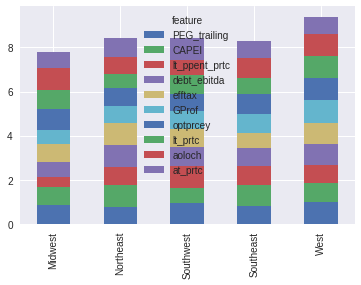

In [957]:
oes.T.plot.bar(stacked=True);

In [73]:
kes

NameError: name 'kes' is not defined

In [1014]:
kes["Midwest"].sort_values()

feature
lt_ppent_prtc      0.004507
optprcey_prtc      0.004750
cash_conversion    0.005447
xsga_prtc          0.006290
int_debt           0.007198
ps                 0.007733
PEG_trailing       0.007928
dpact_prtc         0.008106
PEG_1yrforward     0.008301
CAPEI              0.008771
Name: Midwest, dtype: float32

In [358]:
import tensorflow as tf

from keras.layers import Dense
from keras.models import Sequential
from keras.callbacks import EarlyStopping
from sklearn.utils import class_weight


Using TensorFlow backend.


In [364]:
non_default = len(final[final["Target"]==0])
default = len(final[final["Target"]==1])
ratio = float(default/(non_default+default))
print('Default Ratio :',ratio)

Default Ratio : 0.03723196294848275


In [690]:
from sklearn.preprocessing import StandardScaler
from keras.utils import to_categorical


Y = final["Target"]


X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)


predictors = X.as_matrix()
predictors = StandardScaler().fit_transform(predictors)

target = to_categorical(Y) 

#target =  Y

In [602]:
from keras.models import save_model, load_model

In [610]:
model = load_model('model_cnn.h5')

In [604]:
fnn = KerasClassifier(build_fn=load_model('model_fnn.h5'), nb_epoch=10, batch_size=5, verbose=1)


In [649]:
cnn = load_model('model_cnn.h5')
cnn_pred = cnn.predict(PRED)

In [692]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=0)


rf =  RandomForestClassifier()
rf.fit(X_train, Y_train)
rf_pred = rf.predict_proba(X)
rf_pred = rf_pred[:,1]

In [693]:
ada =  AdaBoostClassifier()
ada.fit(X_train, y_train)
ada_pred = ada.predict_proba(X)
ada_pred = ada_pred[:,1]

In [650]:
xgb =  pickle.load(open("ganker.sav", 'rb'))
xgb_pred = xgb.predict_proba(X)
xgb_pred = xgb_pred[:,1]

In [648]:
ffn = load_model('model_fnn.h5')
ffn_pred = ffn.predict(predictors)
ffn_pred = ffn_pred[:,1]

In [700]:
base_predictions_train = pd.DataFrame( {'CNN': cnn_pred.ravel(),
     'FFN': ffn_pred.ravel(),
     'ADA': ada_pred.ravel(),
     'RF': rf_pred.ravel()
    })
base_predictions_train.head()

,ADA,CNN,FFN,RF
0,0.466384,0.167682,4.810093e-03,0.0
1,0.449993,0.083738,2.352655e-03,0.0
2,0.416731,0.019081,4.680124e-05,0.0
3,0.478643,0.088995,1.936165e-08,0.0
4,0.464933,0.210018,1.368095e-08,0.0


In [676]:
base_predictions_train.shape

(33251, 5)

In [701]:
import xgboost as xgb

X_train, X_test, Y_train, Y_test = train_test_split(base_predictions_train, Y, random_state=0)


gbm = xgb.XGBClassifier(
 learning_rate = 0.05,
 n_estimators= 5000,
 max_depth= 6,
 min_child_weight= 2,
 #gamma=1,
 gamma=0.9,                        
 subsample=0.8,
 colsample_bytree=0.4,
 objective= 'binary:logistic',
 nthread= -1,
 scale_pos_weight=1).fit(X_train, y_train)




In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

n_cols = predictors.shape[1]
early_stopping_monitor = EarlyStopping(patience=2)
class_weight = {0:ratio, 1:1-ratio}
seed = 7

def create_model():
    model = Sequential()
    model.add(Dense(500, activation='relu', input_shape = (n_cols,)))
    model.add(Dense(500, activation='relu'))
    #model.add(Dense(20, activation='relu'))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
    return model
    
model = KerasClassifier(build_fn=create_model, epochs=20,class_weight=class_weight, batch_size=10, verbose=1)

#model.fit(predictors, target, epochs=20, validation_split=0.3, callbacks = [early_stopping_monitor],class_weight=class_weight)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)


X_train, X_test, Y_train, Y_test = train_test_split(predictors, Y.as_matrix(), random_state=0)

model.fit(X_train, Y_train)


In [582]:
model.model.save("model_fnn.h5")

In [593]:
 """

loaded_model.load_weights("model_fnn.h5")
print("Loaded model from disk")

"""
 

'\n\nloaded_model.load_weights("model_fnn.h5")\nprint("Loaded model from disk")\n\n'

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
#  Not Sure What Happened Have to Change 

n_cols = predictors.shape[1]
early_stopping_monitor = EarlyStopping(patience=2)
class_weight = {0:ratio, 1:1-ratio}
seed = 7

PRED = predictors.reshape(predictors.shape[0], predictors.shape[1], 1)

def create_model():
    conv = Sequential()
    conv.add(Conv1D(20, 4, input_shape = PRED.shape[1:3], activation = 'relu'))
    conv.add(MaxPooling1D(2))
    #conv.add(Dense(50, activation='relu'))
    conv.add(Flatten())
    conv.add(Dense(1, activation = 'sigmoid'))
    sgd = SGD(lr = 0.1, momentum = 0.9, decay = 0, nesterov = False)
    conv.compile(loss = 'binary_crossentropy', optimizer = sgd, metrics = ['accuracy'])
    return conv
    
model = KerasClassifier(build_fn=create_model,  batch_size = 500, epochs = 100, verbose = 1,class_weight=class_weight)

#model.fit(predictors, target, epochs=20, validation_split=0.3, callbacks = [early_stopping_monitor],class_weight=class_weight)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)


X_train, X_test, Y_train, Y_test = train_test_split(PRED, Y.as_matrix(), random_state=0)


model.fit(X_train, Y_train)

In [594]:
model.model.save("model_cnn.h5")

In [706]:
data = [
    go.Heatmap(
        z= base_predictions_train.astype(float).corr().values ,
        x=base_predictions_train.columns.values,
        y= base_predictions_train.columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')

In [702]:
model = gbm

In [703]:
y_predict = model.predict(X_test)
y_predict_prob = model.predict_proba(X_test)
#print metrics.accuracy_score(y_test, y_predict)

y_train = Y_train

y_test = Y_test



confusion_mat = confusion_matrix(y_test,y_predict)

TN = confusion_mat[0][0]
FP = confusion_mat[0][1]
TP = confusion_mat[1][1]
FN = confusion_mat[1][0]

gb = pd.DataFrame({'score':model.feature_importances_, 'feature':X_test.columns.values})

#bm, nopiq, intanq, niq,adjex, piq, oibdpq
gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)

TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Precision or positive predictive value
PPV = TP/(TP+FP)
# Negative predictive value
NPV = TN/(TN+FN)
# Fall out or false positive rate
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)
# False discovery rate
FDR = FP/(TP+FP)

ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
print(ll)

acc = accuracy_score(y_test, y_predict)
print(acc)
auc = roc_auc_score(y_test, y_predict_prob[:,1])
print(auc)
prc = average_precision_score(y_test, y_predict_prob[:,1]) 
print(prc) # This is a useless measure

print("Bankrupt")
print(PPV)
print(FPR)
print(FDR)

print("Healthy")
print(NPV)
print(FNR)


#9604 - Three
#9172 - One
#Accuracy AUC and Errors an Confusion matrix with Percentages. 


# Second Type


data = np.array([np.arange(1)]*1).T

df_exec = pd.DataFrame(data)

df_exec["Average Log Likelihood"] = ll
df_exec["Brier Score Loss"] = br
df_exec["Accuracy Score"] = acc
df_exec["ROC AUC Sore"] = auc
df_exec["Average Precision Score"] = prc
df_exec["Precision - Bankrupt Firms"] = PPV
df_exec["False Positive Rate (p-value)"] = FPR
df_exec["Precision - Healthy Firms"] = NPV
df_exec["False Negative Rate (recall error)"] = FNR
df_exec["False Discovery Rate "] = FDR
df_exec["All Observations"] = TN + TP + FN + FP

df_exec["Bankruptcy Sample"] = TP + FN
df_exec["Healthy Sample"] = TN + FP

df_exec["Recalled Bankruptcy"] = TP + FP
df_exec["Correct (True Positives)"] = TP
df_exec["Incorrect (False Positives)"] = FP

df_exec["Recalled Healthy"] = TN + FN
df_exec["Correct (True Negatives)"] = TP
df_exec["Incorrect (False Negatives)"] = FP


0.1949028864
0.969926620955
0.919943771181
0.432159692498
Bankrupt
0.576086956522
0.00970752955818
0.423913043478
Healthy
0.978841185878
0.618705035971


In [698]:
df_exec.to_csv("metrics_stacked")

In [704]:
df_exec

,0,Average Log Likelihood,Brier Score Loss,Accuracy Score,ROC AUC Sore,Average Precision Score,Precision - Bankrupt Firms,False Positive Rate (p-value),Precision - Healthy Firms,False Negative Rate (recall error),False Discovery Rate,All Observations,Bankruptcy Sample,Healthy Sample,Recalled Bankruptcy,Correct (True Positives),Incorrect (False Positives),Recalled Healthy,Correct (True Negatives),Incorrect (False Negatives)
0,0,0.194903,0.103967,0.969927,0.919944,0.43216,0.576087,0.009708,0.978841,0.618705,0.423913,8313,278,8035,184,106,78,8129,106,78


In [705]:
gb

,feature,score
0,ADA,0.353831
1,FFN,0.289378
2,CNN,0.244328
3,RF,0.112463


In [584]:
df_exec.to_csv("metrics_FFN.csv")

In [87]:
import pygal
%matplotlib inline
from IPython.display import SVG, HTML
from pygal.style import Style

custom_style = Style(
  background='transparent',
  plot_background='transparent',
    label_font_size=14)

html_pygal = """
<!DOCTYPE html>
<html>
  <head>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/svg.jquery.js"></script>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/pygal-tooltips.js"></script>
    <!-- ... -->
  </head>
  <body>
    <figure>
      {pygal_render}
    </figure>
  </body>
</html>
"""

dot_chart = pygal.Dot(x_label_rotation=90, style=custom_style)
#dot_chart.title = 'V8 benchmark results'
dot_chart.x_labels = kes.index
dot_chart.add('Midwest', kes["Midwest"].values)
dot_chart.add('Northeast', kes["Northeast"].values)
dot_chart.add('Southwest', kes["Southwest"].values)
dot_chart.add('Southeast', kes["Southeast"].values)
dot_chart.add('West', kes["West"].values)


dot_chart.render()

dot_chart.render_to_file('chart.svg')
dot_chart.render_in_browser()
HTML(html_pygal.format(pygal_render=dot_chart.render()))

file:///tmp/tmp1_3smkwz.html


In [70]:
kes

,Midwest,Northeast,Southwest,Southeast,West
Category,,,,,
Asset,0.333144,0.333159,0.305641,0.310830,0.295140
Solvency,0.171321,0.178066,0.189800,0.190991,0.179337
Income,0.074736,0.083800,0.100032,0.091009,0.101178
Profitability,0.201357,0.189507,0.194899,0.199278,0.195210
Equity,0.060567,0.058703,0.062356,0.065577,0.070508
Expense,0.045936,0.045866,0.055366,0.038985,0.054532
Efficiency,0.049606,0.048571,0.033022,0.041887,0.049641
Other,0.027302,0.020596,0.021133,0.019592,0.021924
Liquidity,0.022051,0.022756,0.022948,0.023254,0.022439


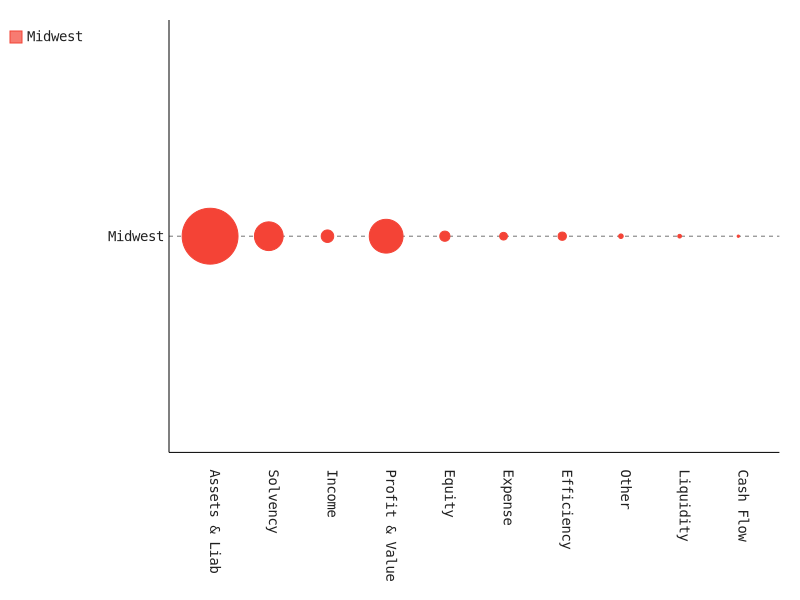

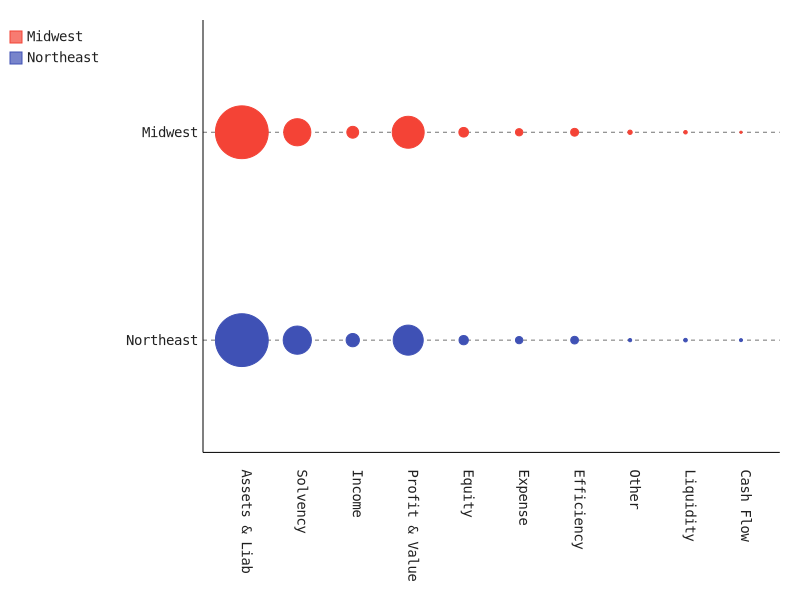

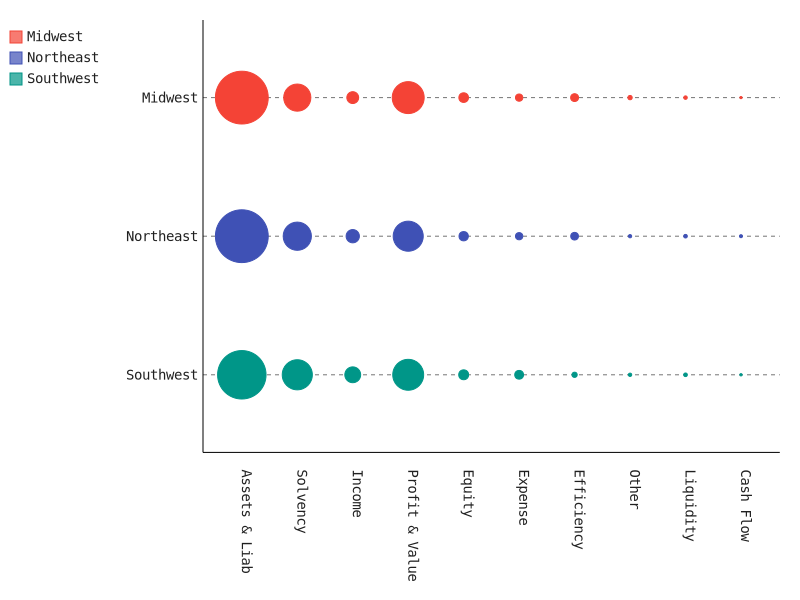

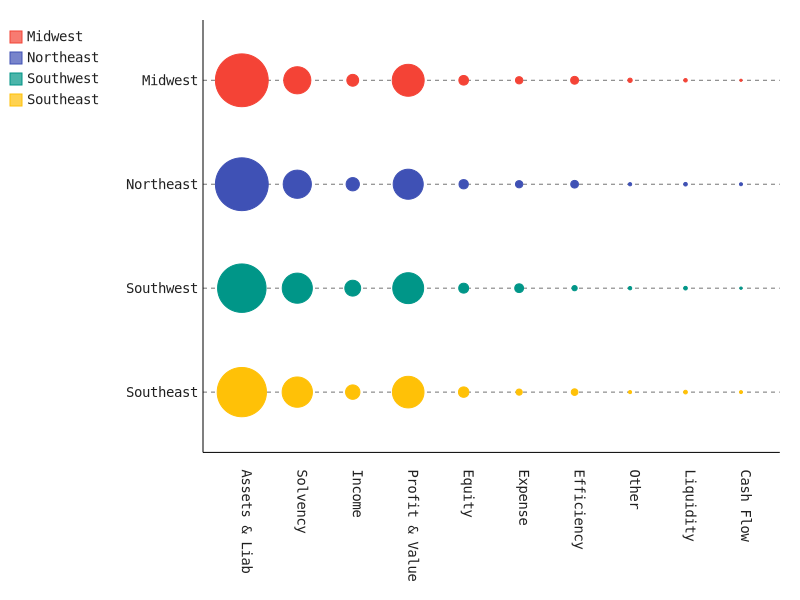

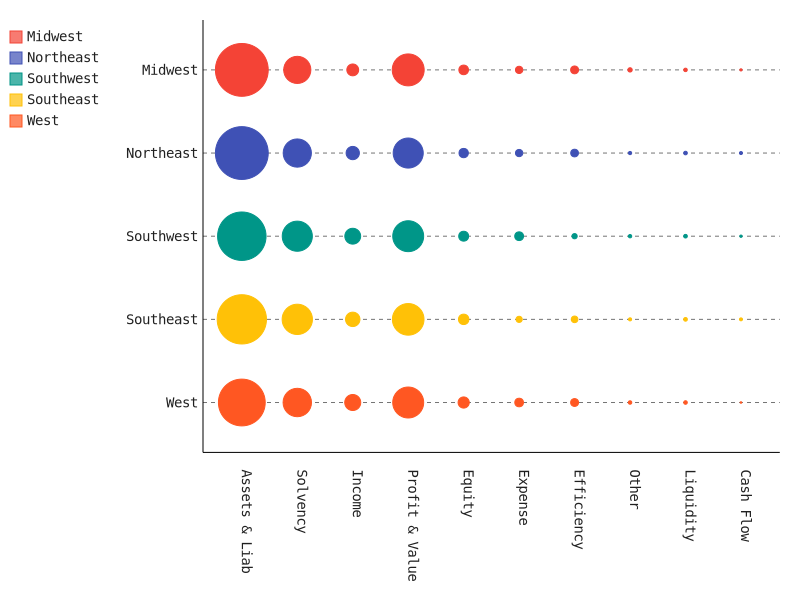

b'<?xml version=\'1.0\' encoding=\'utf-8\'?>\n<svg xmlns:xlink="http://www.w3.org/1999/xlink" xmlns="http://www.w3.org/2000/svg" id="chart-e42ce7bc-9bf8-4955-85e7-36c254662443" class="pygal-chart" viewBox="0 0 800 600"><!--Generated with pygal 2.1.1 (lxml) \xc2\xa9Kozea 2011-2015 on 2017-10-21--><!--http://pygal.org--><!--http://github.com/Kozea/pygal--><defs><style type="text/css">#chart-e42ce7bc-9bf8-4955-85e7-36c254662443{-webkit-user-select:none;-webkit-font-smoothing:antialiased;font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace}#chart-e42ce7bc-9bf8-4955-85e7-36c254662443 .title{font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace;font-size:16px}#chart-e42ce7bc-9bf8-4955-85e7-36c254662443 .legends .legend text{font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace;font-size:14px}#chart-e42ce7bc-9bf8-4955-85e7-36c254662443 .axis text{font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace;font-size:14px}#chart-e42ce7bc-9bf8-4955-85e7-36c25466244

file:///tmp/tmp67hw0cq3.html


In [69]:
top = pd.DataFrame()
top["Category"] = ["Asset","Solvency","Income",
                   "Profitability","Equity","Expense","Efficiency","Other","Liquidity","Cash Flow"]


for i in region["Region"].unique():
    gb = features[i]
    gb["Category"] = gb["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Asset" if x=="Liability" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Profitability" if x=="Valuation" else x)
    cat = gb.groupby(["Category"]).sum().reset_index()
    cat = cat.sort_values("weight", ascending=False)
    cat[i] = cat["weight"]
    cat = cat.drop("weight",axis=1)
    top = pd.merge(top, cat, on="Category", how="left")
    
des = top.set_index(top["Category"], drop=True).drop("Category",axis=1).T

kes = des.copy()


kes =kes.T


import pygal
%matplotlib inline
from IPython.display import SVG, HTML
from pygal.style import Style

custom_style = Style(
  background='transparent',
  plot_background='transparent',
    label_font_size=14)

html_pygal = """
<!DOCTYPE html>
<html>
  <head>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/svg.jquery.js"></script>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/pygal-tooltips.js"></script>
    <!-- ... -->
  </head>
  <body>
    <figure>
      {pygal_render}
    </figure>
  </body>
</html>
"""

dot_chart = pygal.Dot(x_label_rotation=90, style=custom_style)
#dot_chart.title = 'V8 benchmark results'
#dot_chart.x_labels = kes.index

dot_chart.x_labels = ["Assets & Liab","Solvency","Income",
                   "Profit & Value","Equity","Expense","Efficiency","Other","Liquidity","Cash Flow"]
dot_chart.add('Midwest', kes["Midwest"].values)
dot_chart.add('Northeast', kes["Northeast"].values)
dot_chart.add('Southwest', kes["Southwest"].values)
dot_chart.add('Southeast', kes["Southeast"].values)
dot_chart.add('West', kes["West"].values)


dot_chart.render()

dot_chart.render_to_file('chart.svg')
dot_chart.render_in_browser()
HTML(html_pygal.format(pygal_render=dot_chart.render()))

In [86]:
# FOR THE DOT PLOT
dt = ["pi","ibc","epspx","ps","lt","xint","dltt","seq","debt_at","niadj"]


#"PEG_ltgforward","fcf_ocf","stkco_prtc","debt_ebitda","ppent_prtc","accrual","efftax","optprcey","epsfx"]

top = pd.DataFrame()
top["feature"] = dt

for i in region["Region"].unique():
    gb = features[i]
    gb = gb[gb["feature"].isin(dt)]
    gb[i] = gb["weight"]
    top = pd.merge(top, gb[["feature",i]], on="feature",how="left" )
    
des = top.set_index(top["feature"], drop=True).drop("feature",axis=1).T

kes = des.copy()


kes =kes.T


In [74]:
# Process to get teh top 2 features.
da = gb[gb["Category"].isin(["Asset","Solvency","Income","Profitability","Equity"])]

da = da.groupby(["Category"]).head(2)

da = da.sort_values("Category")

ft = da["feature"].values

In [75]:
ft
#'invt', 'ppent', 'pi', 'ibc', 'lt', 'dltt', 'debt_at','totdebt_invcap', 'ps', 'ptb'

array(['txt', 'lt', 'seq', 'epsfx_prtc', 'pi', 'ibc', 'ps', 'ps_prtc',
       'equity_invcap', 'intcov'], dtype=object)

In [78]:
ft = ['txt', 'lt', 'seq', 'ceq_prtc', 'pi', 'ibc', 'ps', 'ps_prtc',
       'equity_invcap', 'intcov'] 

In [79]:
top = pd.DataFrame()
top["feature"] = ft

for i in region["Region"].unique():
    gb = features[i]
    gb = gb[gb["feature"].isin(ft)]
    gb[i] = gb["weight"]
    top = pd.merge(top, gb[["feature",i]], on="feature",how="left" )
    
des = top.set_index(top["feature"], drop=True).drop("feature",axis=1).T

for col in des.columns:
    des[col] = des[col]/des[col].max()

oes =des.T
oes = oes.iloc[::-1]


In [80]:
import plotly.plotly as py
import plotly.graph_objs as go

trace = go.Heatmap(z=oes.values,
                   x=oes.columns,
                   y=oes.index)
data=[trace]
py.iplot(data, filename='labelled-heatmap')

In [52]:
# Here you get the information for the map. 

fes = pd.DataFrame()
fes["Category"] =  ["Asset","Solvency","Income","Equity",
                   "Profitability","Expense","Efficiency","Other","Liquidity","Cash Flow"]

for i in region["Region"].unique():
    gb = features[i]
    gb["Category"] = gb["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Asset" if x=="Liability" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Profitability" if x=="Valuation" else x)
    
    cat = gb.groupby(["Category"]).sum().reset_index()
    cat = cat.sort_values("weight", ascending=False)
    cat[i] = cat["weight"]
    cat = cat.drop("weight",axis=1)
    fes = pd.merge(fes, cat, on="Category", how="left")


res = fes.set_index(fes["Category"], drop=True).drop("Category",axis=1).T

for col in res.columns:
    res[col] = res[col]/res[col].max()


koes =res.T
koes = koes.iloc[::-1]

import plotly.plotly as py
import plotly.graph_objs as go

trace = go.Heatmap(z=koes.values,
                   x=koes.columns,
                   y=koes.index)
data=[trace]
py.iplot(data, filename='labelled-heatmap')

In [ ]:
cat = gb.groupby(["Category"]).sum().reset_index()
cat = cat.sort_values("score", ascending=False)

per = gb.groupby(["Period"]).sum().reset_index()
per = per.sort_values("Period", ascending=False)




### What follow is cross validation accross regions

In [23]:
import pickle

tickers = bank_dp.drop_duplicates(subset="Headquarters City").reset_index(drop=True)
tickers = tickers[~tickers["Region"].isin(["Outside"])].reset_index(drop=True)
tickers = tickers[~tickers["Region"].isnull()].reset_index(drop=True)
saved_1 = pd.merge(saved, tickers, left_on=["state"], right_on=["Headquarters City"], how="left")  

In [26]:
full_sample = 1

if full_sample == 1:
    
    final = connect_3.copy()
    
    final = final.drop(["public_date"],axis=1)
    
    """
        
    final = pd.DataFrame()
    
    blue = saved_1[saved_1["Target"]==1].reset_index(drop=True).drop(["Target","tic"],axis=1)  # This has to be zero because old
    
    connect_4 = connect_3.drop(['public_date'],axis=1)
    
    red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy()

    final_two = pd.concat((blue,red),axis=1)

    final_one = final_two.groupby('tic').tail(2).reset_index(drop=True)
    
    tmp = pd.DataFrame(columns=blue.columns)
    
    connect_5 = pd.concat([tmp,connect_4 ], axis=1).fillna('')

    final_one = pd.concat((final_one, connect_5[connect_5["Target"]==0].reset_index(drop=True)),axis=0).reset_index(drop=True)
    
    #final_one['public_date'] = final_one['public_date'].apply(lambda x: parse(x))
    
    #final_one = final_one.sort_values("public_date") 

    final = final_one.drop(blue.columns, axis=1)
    
    #final = final_one.drop(["tic","public_date","Region"],axis=1).copy()
    
    """
    
elif full_sample == 2:
    final = pd.DataFrame()
    
    blue = saved_1[saved_1["Target"]==1].reset_index(drop=True).drop(["Target","tic"],axis=1)  # This has to be zero because old
    
    connect_4 = connect_3.drop(['public_date'],axis=1)
    
    red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy()

    final_two = pd.concat((blue,red),axis=1)

    #final_one = final_two.groupby('tic').head(1).reset_index(drop=True)
    
    final_one = final_two.groupby('tic').tail(1).reset_index(drop=True)
    
    tmp = pd.DataFrame(columns=blue.columns)
    
    connect_5 = pd.concat([tmp,connect_4 ], axis=1).fillna('')

    final_one = pd.concat((final_one, connect_5[connect_5["Target"]==0].reset_index(drop=True)),axis=0).reset_index(drop=True)
    
    final = final_one.drop(blue.columns, axis=1)

    
    #final = final_one.drop(["tic","public_date","Region"],axis=1).copy()

    
final = final.rename(columns={'at_x': 'at', 'at_x_prtc': 'at_prtc'})

'\n        \n    final = pd.DataFrame()\n    \n    blue = saved_1[saved_1["Target"]==1].reset_index(drop=True).drop(["Target","tic"],axis=1)  # This has to be zero because old\n    \n    connect_4 = connect_3.drop([\'public_date\'],axis=1)\n    \n    red = connect_4[connect_4["Target"]==1].reset_index(drop=True).copy()\n\n    final_two = pd.concat((blue,red),axis=1)\n\n    final_one = final_two.groupby(\'tic\').tail(2).reset_index(drop=True)\n    \n    tmp = pd.DataFrame(columns=blue.columns)\n    \n    connect_5 = pd.concat([tmp,connect_4 ], axis=1).fillna(\'\')\n\n    final_one = pd.concat((final_one, connect_5[connect_5["Target"]==0].reset_index(drop=True)),axis=0).reset_index(drop=True)\n    \n    #final_one[\'public_date\'] = final_one[\'public_date\'].apply(lambda x: parse(x))\n    \n    #final_one = final_one.sort_values("public_date") \n\n    final = final_one.drop(blue.columns, axis=1)\n    \n    #final = final_one.drop(["tic","public_date","Region"],axis=1).copy()\n    \n    

In [308]:
Y = final["Target"]

kf = KFold(n_splits=10,random_state=1000) 

print(tscv) 
aDict = {}
dit= -2
dit = dit +1


droep = pd.DataFrame()

# This X up here is just for show, the real X is down there
X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)


i = 0
#for train_index, test_index in tscv.split(X):
for train_index, test_index in kf.split(X):
    
    dit = dit +1


    import xgboost as xgb
    from xgboost.sklearn import XGBClassifier
    

    y = final["Target"]
    
    print(y.value_counts())


    X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)


    X_train, X_test = X.ix[train_index,:], X.ix[test_index,:]
    Y_train, Y_test = y[train_index], y[test_index]

    print(y.value_counts())

    import xgboost as xgb
    from xgboost.sklearn import XGBClassifier

    """
    bit = 0
    split = 25023
    #int(.75*X.shape[0])
    top = 33365
    #X.shape[0] - 1

    X_train, Y_train, X_test, Y_test = X[bit:split], Y[bit:split], X[split:top], Y[split:top]
    """

    #X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=0, test_size=0.5)



    y_train = list(Y_train.values)
    y_test = list(Y_test.values)


    #clp = pickle.load(open("ganker.sav", 'rb'))
    
    
    clf = XGBClassifier(
                          max_depth=12,
                          objective= 'binary:logistic', 
                          silent=0, 
                          seed=29,
                          nthread= 1,
                          n_estimators= 200,
                          min_child_weight= 0,
                          learning_rate= 0.1,
                          colsample_bytree= 0.2,
                          subsample= 0.8
    )

    # 5000, 200

    """
        clf = XGBClassifier(
                          max_depth=7,
                          objective= 'binary:logistic', 
                          silent=1, 
                          seed=29)
    """

    i = i +1
    framed = np.array
    
    dit = dit +1

    clf.fit(X_train, y_train)

    y_predict = clf.predict(X_test)
    y_predict_prob = clf.predict_proba(X_test)

    saved_2 = saved_1[["state","tic"]]

    tickers["Region_all"] = tickers["Region"]

    saved_2 = saved_2.drop_duplicates(subset="tic").reset_index(drop=True)

    saved_3 = pd.merge(saved_2, tickers[["Region_all","Headquarters City"]], left_on="state", right_on="Headquarters City", how="left")

    post_a = final_one[final_one.index.isin(test_index)].copy()

    post =  pd.merge(post_a, saved_3, left_on=["tic"], right_on=["tic"], how="left")

    post["predict_2"] = pd.DataFrame({"predict":y_predict})["predict"]
    
    #post = post[post["predict_2"].isnull()]

    poo = pd.DataFrame({"test":Y_test.values, "predict":y_predict, "predict_prob":y_predict_prob[:,1] },index=Y_test.index )

    poo.sort_index(inplace=True)
    
    poo = poo.reset_index(drop=True)

    fata = pd.concat((poo, post),axis=1)

    fata["Region"] = fata["Region_all"].apply(lambda x: np.nan if x == "" else x)

    fata["bank_c"] =np.where((fata["predict"]==1) & (fata["test"]==1), 1,0)
    fata["bank_error1"] =np.where((fata["predict"]==1) & (fata["test"]==0), 1,0)
    fata["bank_error2"] =np.where((fata["predict"]==0) & (fata["test"]==1), 1,0)
    fata["health_c"] =np.where((fata["predict"]==0) & (fata["test"]==0), 1,0)
    fata["acc"] = np.where(fata["predict"]==fata["test"], 1,0)

    ploep = pd.DataFrame()

    for reg in ['Northeast', 'West', 'Southeast', 'Midwest', 'Southwest']:

        northeast = fata[fata["Region"]==reg].reset_index(drop=True).copy()
        #northeast = northeast[~northeast["predict"].isnull()].reset_index(drop=True)

        y_test = northeast["test"].reset_index(drop=True)
        y_predict = northeast["predict"].reset_index(drop=True)
        y_predict_prob = northeast["predict_prob"]

        confusion_mat = confusion_matrix(y_test,y_predict)

        TN = confusion_mat[0][0]
        FP = confusion_mat[0][1]
        TP = confusion_mat[1][1]
        FN = confusion_mat[1][0]

        TPR = TP/(TP+FN)
        # Specificity or true negative rate
        TNR = TN/(TN+FP) 
        # Precision or positive predictive value
        PPV = TP/(TP+FP)
        # Negative predictive value
        NPV = TN/(TN+FN)
        # Fall out or false positive rate
        FPR = FP/(FP+TN)
        # False negative rate
        FNR = FN/(TP+FN)
        # False discovery rate
        FDR = FP/(TP+FP)

        #ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
        #print(ll)

        br = brier_score_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
        print(br) # very similar to false discovery rate. So your fine. 
        acc = accuracy_score(y_test, y_predict)
        print(acc)
        auc = roc_auc_score(y_test, y_predict_prob)
        print(auc)
        prc = average_precision_score(y_test, y_predict_prob) 
        print(prc) # This is a useless measure

        print("Bankrupt")
        print(PPV)
        print(FPR)
        print(FDR)

        print("Healthy")
        print(NPV)
        print(FNR)


        #9604 - Three
        #9172 - One
        #Accuracy AUC and Errors an Confusion matrix with Percentages. 


        # Second Type

        data = np.array([np.arange(1)]*1).T

        df_exec = pd.DataFrame(data)

        df_exec["Region"] = reg
        df_exec["Cross-Val"] = dit
        df_exec["Average Log Likelihood"] = ll
        df_exec["Brier Score Loss"] = br
        df_exec["Accuracy Score"] = acc
        df_exec["ROC AUC Sore"] = auc
        df_exec["Average Precision Score"] = prc
        df_exec["Precision - Bankrupt Firms"] = PPV
        df_exec["False Positive Rate (p-value)"] = FPR
        df_exec["Precision - Healthy Firms"] = NPV
        df_exec["False Negative Rate (recall error)"] = FNR
        df_exec["False Discovery Rate "] = FDR
        df_exec["All Observations"] = TN + TP + FN + FP

        df_exec["Bankruptcy Sample"] = TP + FN
        df_exec["Healthy Sample"] = TN + FP

        df_exec["Recalled Bankruptcy"] = TP + FP
        df_exec["Correct (True Positives)"] = TP
        df_exec["Incorrect (False Positives)"] = FP

        df_exec["Recalled Healthy"] = TN + FN
        df_exec["Correct (True Negatives)"] = TN
        df_exec["Incorrect (False Negatives)"] = FN
        df_exec["Train Period"] = train_per
        df_exec["Test Period"] = test_per

        ploep = ploep.append(df_exec)
    droep = droep.append(ploep)

TimeSeriesSplit(n_splits=10)
0    32013
1     1238
Name: Target, dtype: int64
0    32013
1     1238
Name: Target, dtype: int64
0.0500845045926
0.94277673546
0.904889964591
0.537697582787
Bankrupt
0.8
0.002002002002
0.2
Healthy
0.944128787879
0.880597014925
0.0455325253431
0.948136142626
0.909818360334
0.51951984116
Bankrupt
0.666666666667
0.00515463917526
0.333333333333
Healthy
0.952302631579
0.828571428571
0.049425210874
0.949290060852
0.92812911726
0.639548732659
Bankrupt
1.0
0.0
0.0
Healthy
0.948453608247
0.757575757576
0.047521052015
0.944805194805
0.922676976403
0.58950605301
Bankrupt
1.0
0.0
0.0
Healthy
0.944353518822
0.871794871795
0.0524348850547
0.944320712695
0.914574143196
0.612082163054
Bankrupt
1.0
0.0
0.0
Healthy
0.943946188341
0.892857142857
0    32013
1     1238
Name: Target, dtype: int64
0    32013
1     1238
Name: Target, dtype: int64
0.0174913482737
0.977687626775
0.968910516356
0.606063765246
Bankrupt
0.777777777778
0.00208550573514
0.222222222222
Healthy
0.97952917

In [305]:
poo.head()

,predict,predict_prob,test
0,0,2.155865e-08,0
1,0,1.486379e-08,0
2,0,7.049708e-07,0
3,0,5.056492e-07,0
4,0,1.308025e-05,0


In [309]:
poo["cant"] = np.where(poo["predict"]==poo["test"],1,0)
poo["cant"].sum()/len(poo)

0.9885714285714285

In [310]:
droep

,0,Region,Cross-Val,Average Log Likelihood,Brier Score Loss,Accuracy Score,ROC AUC Sore,Average Precision Score,Precision - Bankrupt Firms,False Positive Rate (p-value),Precision - Healthy Firms,False Negative Rate (recall error),False Discovery Rate,All Observations,Bankruptcy Sample,Healthy Sample,Recalled Bankruptcy,Correct (True Positives),Incorrect (False Positives),Recalled Healthy,Correct (True Negatives),Incorrect (False Negatives),Train Period,Test Period
0,0,Northeast,1,0.031189,0.050085,0.942777,0.904890,0.537698,0.800000,0.002002,0.944129,0.880597,0.200000,1066,67,999,10,8,2,1056,997,59,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,West,1,0.031189,0.045533,0.948136,0.909818,0.519520,0.666667,0.005155,0.952303,0.828571,0.333333,617,35,582,9,6,3,608,579,29,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southeast,1,0.031189,0.049425,0.949290,0.928129,0.639549,1.000000,0.000000,0.948454,0.757576,0.000000,493,33,460,8,8,0,485,460,25,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Midwest,1,0.031189,0.047521,0.944805,0.922677,0.589506,1.000000,0.000000,0.944354,0.871795,0.000000,616,39,577,5,5,0,611,577,34,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southwest,1,0.031189,0.052435,0.944321,0.914574,0.612082,1.000000,0.000000,0.943946,0.892857,0.000000,449,28,421,3,3,0,446,421,25,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Northeast,3,0.031189,0.017491,0.977688,0.968911,0.606064,0.777778,0.002086,0.979529,0.740741,0.222222,986,27,959,9,7,2,977,957,20,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,West,3,0.031189,0.011847,0.984743,0.907173,0.337687,0.333333,0.002813,0.987465,0.900000,0.666667,721,10,711,3,1,2,718,709,9,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southeast,3,0.031189,0.014750,0.981785,0.964403,0.365269,0.333333,0.003704,0.985348,0.888889,0.666667,549,9,540,3,1,2,546,538,8,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Midwest,3,0.031189,0.018735,0.975721,0.977379,0.542991,0.625000,0.004680,0.980031,0.722222,0.375000,659,18,641,8,5,3,651,638,13,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southwest,3,0.031189,0.017741,0.977143,0.962059,0.636607,0.750000,0.002941,0.979769,0.700000,0.250000,350,10,340,4,3,1,346,339,7,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00


In [311]:
droep.to_csv("metrics_regions_cv.csv")

In [111]:
confusion_mat

array([[214,   3],
       [  1,   3]])

In [286]:
northeast[northeast["predict"]==1]

,predict,predict_prob,test,tic,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,state,Region_all,Headquarters City,predict_2,Region,bank_c,bank_error1,bank_error2,health_c,acc
58,1,0.999967,1,HHS,0.0,2015-12-31,8.515,0.130,-0.037000,-0.105000,1.802041,0.345,17.975,151.706,0.000,-0.520,-0.520,-0.366,5.907,-9.169000,38.287,1.524694,20151231.0,29.862000,0.804,414.621,414.621,0.750,0.140,11.574000,54.111000,0.080,0.116,0.273,140.316,-0.314,17.613,45919.0,404.163,0.425,1.302,1.144,0.534,0.132,0.295,2.479,0.140,3.132,0.270199,1.987647e+07,1.000000,13.00000,18.375000,74.517,0.137,171.415,14.245000,0.896,21.241,0.357,0.282833,-2.77,-2.77,0.860,0.0,14.813,0.666,0.00000,-31.93800,218.070000,2015.0,2015.0,12.0,12.0,0.161,-170.928,-170.928000,0.090,0.052,223.095,-41.014,4.509,330.755000,0.272000,0.963000,0.007000,4.974000,0.0,0.000000,0.000000,-36.165000,0.000000,54.775,97.44,81.676,274.305,0.143,8.810,0.0,541860.0,-170.928,-1.007,-0.359,30.943000,0.275,22.363,36.608,0.038,0.066,8.740000,10.594000,5.387,-1.178,-1.223,19.059,19.059,-202.842,33.913,0.083,0.181,0.234,4.619000,0.419,0.0,1.

In [291]:
post["Region_all"].value_counts()

Northeast    636
West         507
Midwest      459
Southeast    435
Southwest    221
Name: Region_all, dtype: int64

In [290]:
saved_3["Region_all"].value_counts()

Northeast    2284
West         1848
Midwest      1460
Southeast    1448
Southwest     902
Name: Region_all, dtype: int64

In [282]:
droep

,0,Region,Cross-Val,Average Log Likelihood,Brier Score Loss,Accuracy Score,ROC AUC Sore,Average Precision Score,Precision - Bankrupt Firms,False Positive Rate (p-value),Precision - Healthy Firms,False Negative Rate (recall error),False Discovery Rate,All Observations,Bankruptcy Sample,Healthy Sample,Recalled Bankruptcy,Correct (True Positives),Incorrect (False Positives),Recalled Healthy,Correct (True Negatives),Incorrect (False Negatives),Train Period,Test Period
0,0,Northeast,0,0.031189,1.214435e-02,0.986867,0.995249,0.968200,0.981818,0.001001,0.987141,0.194030,0.018182,1066,67,999,55,54,1,1011,998,13,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,West,0,0.031189,1.424464e-02,0.983793,0.986451,0.915204,0.962963,0.001718,0.984746,0.257143,0.037037,617,35,582,27,26,1,590,581,9,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southeast,0,0.031189,7.071232e-03,0.989858,0.983004,0.965204,1.000000,0.000000,0.989247,0.151515,0.000000,493,33,460,28,28,0,465,460,5,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Midwest,0,0.031189,1.284559e-02,0.987013,0.996712,0.961484,1.000000,0.000000,0.986325,0.205128,0.000000,616,39,577,31,31,0,585,577,8,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southwest,0,0.031189,2.229074e-03,0.997773,0.986427,0.969524,1.000000,0.000000,0.997630,0.035714,0.000000,449,28,421,27,27,0,422,421,1,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Northeast,1,0.031189,1.247302e-03,0.998986,0.999923,0.997400,1.000000,0.000000,0.998958,0.037037,0.000000,986,27,959,26,26,0,960,959,1,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,West,1,0.031189,4.129342e-03,0.995839,0.990577,0.893657,0.818182,0.002813,0.998592,0.100000,0.181818,721,10,711,11,9,2,710,709,1,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southeast,1,0.031189,6.221736e-05,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,549,9,540,9,9,0,540,540,0,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Midwest,1,0.031189,3.073042e-03,0.996965,0.999307,0.980943,0.944444,0.001560,0.998440,0.055556,0.055556,659,18,641,18,17,1,641,640,1,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00
0,0,Southwest,1,0.031189,5.767809e-03,0.994286,0.999118,0.972020,1.000000,0.000000,0.994152,0.200000,0.000000,350,10,340,8,8,0,342,340,2,1977-06-30 00:00:00-2014-12-31 00:00:00,2014-12-31 00:00:00-2015-12-31 00:00:00


In [ ]:
clf

In [27]:
saved_2 = saved_1[["state","tic"]]

tickers["Region_all"] = tickers["Region"]

saved_2 = saved_2.drop_duplicates(subset="tic").reset_index(drop=True)

saved_3 = pd.merge(saved_2, tickers[["Region_all","Headquarters City"]], left_on="state", right_on="Headquarters City", how="left")

#post_a = final_one

post_a = final

post =  pd.merge(post_a, saved_3, left_on=["tic"], right_on=["tic"], how="left")

In [28]:
post.head()

,tic,Target,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,state,Region_all,Headquarters City
0,2829B,0,9.300,0.110,0.338565,0.232077,0.213381,0.064,0.465,27.499,0.0,-0.052,-0.052,-0.044,1.716,0.247167,9.424,-0.769874,2.007964e+07,0.000,1.384,54.020,144.781135,3.266,0.000,1.260,83.356,0.209,0.130,0.222,37.009,0.011,2.217,524896.731609,70.797,0.584,3.209,0.352,0.260,0.016,0.159,-0.675,0.000,1.000,0.218105,1.988363e+07,2.424864,0.000,0.000,0.000,0.000,38.399,2.972,0.461000,0.296,0.418000,0.252261,-1.07,-1.07,1.000,0.0,-14.283,0.714,0.000000,-1.038399,-1.393,1977.0,1983.809360,6.0,7.746048,0.080,-2.606,-2.606,0.21243,0.066,0.000,-37.204,-75.833,7.113,0.471591,7.465,0.367,0.765536,0.0,0.0,0.694,-1.535927,0.015945,1.063,11.487,0.000,17.011,0.000,0.515,0.0,322130.000000,-2.606,0.451,-0.028,3.198657,0.163,-6.222,-3.254,-0.056,-0.017,17.623882,9.744,10.445,-6.696000,-6.696000,-17.726033,-17.690328,-5.132,24.805,-0.078,-0.091,-0.152,0.0,0.187,0.0,0.313,-0.057,2.031,0.000,0.399531,17.352,0.526,5.386,-0.023,-0.102,-0.045,74.651,1.871,1.871,4.119,37.009,1.000,2631.0,0.084,0.744,1.217,-0.379164,0.000,0.0,1.

In [165]:
ft

array(['act', 'aco', 'ap', 'dlcch', 'GProf', 'aftret_eq', 'cash_lt',
       'capital_ratio', 'CAPEI', 'PEG_1yrforward'], dtype=object)

In [31]:
ja = post[["pi","ibc","epspx","ps","lt",
"xint","dltt","seq","ib","debt_at","Region_all","Target"]]

In [32]:
ja = ja.groupby(["Target","Region_all"]).mean()

In [33]:
ja

pi         ibc     epspx        ps           lt  \
Target Region_all                                                            
0      Midwest     228.511355  155.383853  3.875007  2.298446  4083.827081   
       Northeast   223.721844  158.763972  0.703266  6.756443  7753.577422   
       Southeast   171.272439  102.809438  1.075903  3.058616  4812.323799   
       Southwest   167.849441   96.915806  0.585254  4.056990  2415.133159   
       West        178.995658  123.105072  0.301244  9.103510  1855.295624   
1      Midwest    -252.918309 -411.577284 -4.162540  0.397751  3289.876563   
       Northeast   -60.891551  -97.479044 -3.276366  1.090614  8246.335743   
       Southeast  -159.952127 -158.149542 -3.627965  0.942634  1585.019882   
       Southwest  -125.060813 -101.278534 -5.515296  0.717660  2533.846672   
       West       -171.632255 -166.490012 -2.740024  2.388354  3761.709808   

                         xint         dltt          seq          ib   debt_at  
Target Region_all                                                              
0      Midwest      58.796646   864.783497  1206.566001  154.784868  0.210116  
       Northeast   101.354695  1195.600746  1292.158649  151.407271  0.204178  
       Southeast   111.732154  1405.811405   908.322680  102.518860  0.220465  
       Southwest    54.960822   786.727501  1130.422965   94.719910  0.245493  
       West         28.353715   445.371068   908.441741  120.569480  0.180210  
1      Midwest      89.654592   910.562840  -270.518246 -411.102598  0.409563  
       Northeast   436.965098  2168.691235   409.900803  -98.607287  0.475987  
       Southeast    68.485120   668.789525   216.374388 -162.176034  0.446362  
       Southwest   104.561556   968.992736   310.102795 -131.676356  0.518644  
       West         65.343200  1031.249361   404.431685 -168.827306  0.376207

In [34]:
ja.to_csv("reg_char_2.csv")

In [767]:
pata = fata[fata["test"]==1].groupby("Region_all").agg(["mean","sum","median"]).reset_index()
pata

Region_all   predict              test              Target              \
                  mean   sum median mean   sum median   mean  sum median   
0    Midwest  0.928571  13.0    1.0  1.0  14.0    1.0    0.0  0.0    0.0   
1  Northeast  0.947368  18.0    1.0  1.0  19.0    1.0    0.0  0.0    0.0   
2  Southeast  0.923077  12.0    1.0  1.0  13.0    1.0    0.0  0.0    0.0   
3  Southwest  1.000000   4.0    1.0  1.0   4.0    1.0    0.0  0.0    0.0   
4       West  1.000000  13.0    1.0  1.0  13.0    1.0    0.0  0.0    0.0   

        CAPEI                       GProf                PEG_1yrforward  \
         mean       sum  median      mean    sum  median           mean   
0    8.067500   112.945  10.417  0.271071  3.795  0.3255      -0.760525   
1 -287.205000 -5456.895  13.285  0.372105  7.070  0.3560      -1.311546   
2   15.636154   203.270  11.456  0.325846  4.236  0.2710      -0.326461   
3  -96.741500  -386.966  -7.199  0.505250  2.021  0.4765       0.373250   
4   22.600385   293.805  13.930  0.389231  5.060  0.2590      -0.567349   

                     PEG_ltgforward                      PEG_trailing  \
         sum  median           mean        sum    median         mean   
0 -10.647354 -0.0605       1.295895  18.142530  1.261233     3.146819   
1 -24.919368 -0.2980      -0.193689  -3.680090  0.735000     0.273783   
2  -4.243990 -0.1920       0.560482   7.286263  0.972635     1.286268   
3   1.493000  0.0325      -1.668710  -6.674841  0.498000     0.317250   
4  -7.375539 -0.0820       0.355929   4.627079  0.589499     2.752328   

                         accrual                       aco              \
         sum    median      mean    sum  median       mean         sum   
0  44.055461  0.612479  0.136571  1.912  0.0845  37.886742  530.414389   
1   5.201885  0.368705  0.049421  0.939  0.0430   4.082672   77.570760   
2  16.721490  0.495887  0.061923  0.805  0.0720   8.046231  104.601000   
3   1.269000  0.004500  0.080250  0.321  0.0790   2.360500    9.442000   
4  35.780263  0.304401  0.153154  1.991  0.0650  19.116051  248.508664   

                      act                            adv_sale                 \
      median         mean           sum      median      mean    sum  median   
0   6.822613   718.223161  10055.124259  102.824860  0.021143  0.296  0.0055   
1   0.905000    57.705785   1096.409907   33.068861  0.004526  0.086  0.0000   
2   3.246000  1160.121603  15081.580842  102.476000  0.004154  0.054  0.0000   
3   2.410000    56.987000    227.948000   49.408500  0.016250  0.065  0.0110   
4  10.365000   488.854046   6355.102603   85.620000  0.102000  1.326  0.0000   

  aftret_eq                aftret_equity                aftret_invcapx         \
       mean    sum  median          mean    sum  median           mean    sum   
0 -0.187214 -2.621  0.0925     -0.176143 -2.466  0.0925      -0.072500 -1.015   
1 -0.120053 -2.281  0.0340     -0.107737 -2.047  0.0470      -0.018737 -0.356   
2 -0.059000 -0.767  0.0020     -0.011308 -0.147  0.0030       0.028538  0.371   
3  0.092750  0.371  0.0690      0.092750  0.371  0.0690       0.080250  0.321   
4  0.154308  2.006  0.0320     -0.066308 -0.862 -0.0360      -0.022308 -0.290   

                   ao                         aoloch                       \
   median        mean          sum  median      mean        sum    median   
0  0.0855   75.579013  1058.106183  16.608 -3.607245 -50.501431  0.327885   
1  0.0860   10.709106   203.473018   1.816 -2.796862 -53.140384 -0.085000   
2  0.0250  306.213077  3980.770000  10.975 -1.753481 -22.795249 -0.465547   
3  0.1205    3.935250    15.741000   3.024  1.888680   7.554720 -0.120640   
4  0.0000   35.451846   460.874000   2.524 -0.850555 -11.057212  0.414000   

            ap                              apalch                        \
          mean           sum     median       mean         sum    median   
0   177.996636   2491.952905  60.791952   0.638679    8.941508 -1.019067   
1    66.086282 

In [414]:
pata = fata[fata["test"]==1].groupby("Region_all").agg(["mean","sum","median"]).reset_index()
pata

Region_all   predict              test                 Target               \
                  mean   sum median mean   sum median      mean   sum median   
0    Midwest  0.867925  46.0    1.0  1.0  53.0    1.0  0.301887  16.0    0.0   
1  Northeast  0.816092  71.0    1.0  1.0  87.0    1.0  0.149425  13.0    0.0   
2  Southeast  0.829268  34.0    1.0  1.0  41.0    1.0  0.365854  15.0    0.0   
3  Southwest  0.800000  32.0    1.0  1.0  40.0    1.0  0.250000  10.0    0.0   
4       West  0.859375  55.0    1.0  1.0  64.0    1.0  0.203125  13.0    0.0   

       CAPEI                            GProf                     \
        mean         sum     median      mean        sum  median   
0   8.413999  445.941959  10.190000  0.387828  20.554890  0.3010   
1  -3.511910 -305.536185   9.837000  0.314759  27.384024  0.2940   
2  21.440697  879.068558  10.274178  0.305858  12.540191  0.2350   
3  19.604427  784.177082   3.537500  0.179575   7.183000  0.1525   
4  12.072872  772.663825   8.620000  0.268830  17.205151  0.2070   

  PEG_1yrforward                      PEG_ltgforward                       \
            mean        sum    median           mean        sum    median   
0      -0.733844 -38.893726 -0.047000       0.843466  44.703720  0.940000   
1      -0.291347 -25.347150 -0.056000       0.652374  56.756541  0.673000   
2      -0.745062 -30.547561 -0.011006       0.601336  24.654776  0.646938   
3      -0.962625 -38.504983 -0.056343       0.918717  36.748696  0.690239   
4      -0.551232 -35.278871 -0.181039       0.737508  47.200497  0.701398   

  PEG_trailing                        accrual                          aco  \
          mean        sum    median      mean       sum median        mean   
0     1.116338  59.165898  0.603265  0.049415  2.619000  0.030  144.713478   
1     0.884007  76.908615  0.293000  0.033111  2.880631  0.036    8.487854   
2     1.281103  52.525242  0.565342  0.030140  1.235735  0.026   23.193797   
3     0.377614  15.104580  0.225777  0.090325  3.613000  0.069   87.714054   
4     0.873984  55.934992  0.242821  0.018569  1.188437  0.017    8.419694   

                               act                           adv_sale  \
           sum  median        mean           sum     median      mean   
0  7669.814354  3.6000  478.969080  25385.361262  64.574000  0.020681   
1   738.443332  0.4560  428.317729  37263.642420  23.724000  0.009971   
2   950.945685  2.4370  386.449160  15844.415563  75.852000  0.010232   
3  3508.562162  1.9475  347.395654  13895.826176  40.775418  0.009611   
4   538.860411  0.3040  135.347628   8662.248199  18.402134  0.037688   

                   aftret_eq                    aftret_equity            \
        sum median      mean        sum  median          mean       sum   
0  1.096095    0.0 -0.024736  -1.310982  0.1000     -0.020094 -1.064983   
1  0.867510    0.0 -0.139207 -12.111000  0.0710     -0.101759 -8.853000   
2  0.419496    0.0 -0.116318  -4.769039  0.0600     -0.106650 -4.372631   
3  0.384444    0.0  0.186925   7.477000 -0.0060      0.162000  6.480000   
4  2.412063    0.0 -0.173946 -11.132567  0.0465     -0.145894 -9.337234   

          aftret_invcapx                            ao                        \
   median           mean       sum  median        mean           sum  median   
0  0.1000       0.059450  3.150847  0.1020  188.787711  10005.748691  4.3680   
1  0.0710       0.040051  3.484427  0.0730  218.128317  18977.163581  1.7010   
2  0.0600       0.019275  0.790276  0.0680  115.675981   4742.715217  4.7990   
3 -0.0060       0.002600  0.104000  0.0090  118.901800   4756.072000  2.7950   
4  0.0465      -0.011131 -0.712361  0.0755   55.589711   3557.741516  2.6475   

      aoloch                                  ap                          \
        mean          sum    median         mean           sum    median   
0 -33.883544 -1795.827826 -0.460750  1007.187638  53380.944801  32.43600   
1 -52.554733 -4572.261747 -0.178560   953.180550  

In [415]:
lata = fata[fata["test"]==0].groupby("Region_all").agg(["mean","sum","median"]).reset_index()
lata

Region_all predict             test             Target              \
                mean  sum median mean  sum median   mean  sum median   
0    Midwest     0.0  0.0    0.0  0.0  0.0    0.0    0.0  0.0    0.0   
1  Northeast     0.0  0.0    0.0  0.0  0.0    0.0    0.0  0.0    0.0   
2  Southeast     0.0  0.0    0.0  0.0  0.0    0.0    0.0  0.0    0.0   
3  Southwest     0.0  0.0    0.0  0.0  0.0    0.0    0.0  0.0    0.0   
4       West     0.0  0.0    0.0  0.0  0.0    0.0    0.0  0.0    0.0   

        CAPEI                             GProf                      \
         mean            sum   median      mean         sum  median   
0   20.474234    6715.548599  17.0985  0.298070   97.766981  0.2530   
1  230.374461  117721.349723  14.6410  0.301756  154.197384  0.2500   
2    0.643151     209.667257  15.7115  0.272854   88.950349  0.2235   
3  -22.956994   -4453.656790  13.6255  0.297663   57.746613  0.2340   
4   11.464441    4425.274070   6.1810  0.316778  122.276316  0.3155   

  PEG_1yrforward                       PEG_ltgforward                        \
            mean         sum    median           mean         sum    median   
0       0.266589   87.441330  0.068574       1.436185  471.068657  1.039337   
1      -0.127418  -65.110397 -0.034000       0.915951  468.050787  0.956857   
2      -0.369238 -120.371529  0.043056       0.516736  168.456035  0.949315   
3      -0.327078  -63.453070 -0.035500       0.236639   45.908004  0.787447   
4      -0.373140 -144.031964 -0.036263       0.771090  297.640781  0.903500   

  PEG_trailing                         accrual                            aco  \
          mean         sum    median      mean        sum  median        mean   
0     2.137689  701.161982  0.704841  0.041762  13.698092  0.0305   79.499822   
1     1.928709  985.570432  0.486000  0.083177  42.503540  0.0350  123.432200   
2     1.196761  390.144165  0.530957  0.052818  17.218587  0.0360  209.664222   
3     1.396638  270.947741  0.371528  0.069945  13.569350  0.0660   99.583816   
4     0.553927  213.815658  0.321794  0.079412  30.652974  0.0585   74.048337   

                                 act                            adv_sale  \
            sum  median         mean            sum     median      mean   
0  26075.941484  4.2300   851.410352  279262.595315  97.184500  0.009443   
1  63073.854389  2.5420  1334.627255  681994.527392  58.269000  0.015602   
2  68350.536424  4.2025  1390.744840  453382.817731  82.594426  0.012027   
3  19319.260388  4.2465   964.609736  187134.288866  82.132000  0.010886   
4  28582.658117  3.5245  1055.019190  407237.407177  75.588500  0.009433   

                   aftret_eq                    aftret_equity             \
        sum median      mean        sum  median          mean        sum   
0  3.097207    0.0  0.021888   7.179373  0.0940      0.025452   8.348383   
1  7.972513    0.0 -0.023242 -11.876854  0.0750     -0.047381 -24.211443   
2  3.920822    0.0 -0.005406  -1.762366  0.0905      0.006366   2.075310   
3  2.111841    0.0 -0.115935 -22.491323  0.0525     -0.027115  -5.260256   
4  3.641011    0.0 -0.012970  -5.006455  0.0500     -0.023836  -9.200840   

            aftret_invcapx                                ao                 \
     median           mean        sum    median         mean            sum   
0  0.094000       0.019489   6.392485  0.049000   630.191888  206702.939183   
1  0.073000      -0.057299 -29.279866  0.000000  1665.613480  851128.488316   
2  0.090894       0.033500  10.921112  0.032178   400.461233  130550.362000   
3  0.058500       0.003699   0.717556  0.049500   367.676443   71329.230000   
4  0.050000      -0.091849 -35.453746  0.000000   110.722141   42738.746248   

               aoloch                                   ap                \
    median       mean           sum    median         mean           sum   
0  12.0520  13.547389   4443.543705 -0.011156  1595.509219  5.233270e+05   
1   9.0050  61.681813  31519.

In [264]:
fata.head()

,predict,test,CAPEI,CAPEI_prtc,GProf,GProf_prtc,PEG_1yrforward,PEG_1yrforward_prtc,PEG_ltgforward,PEG_ltgforward_prtc,PEG_trailing,PEG_trailing_prtc,Region,Target,accrual,accrual_prtc,aco,aco_prtc,act,act_prtc,adv_sale,adv_sale_prtc,aftret_eq,aftret_eq_prtc,aftret_equity,aftret_equity_prtc,aftret_invcapx,aftret_invcapx_prtc,ao,ao_prtc,aoloch,aoloch_prtc,ap,ap_prtc,apalch,apalch_prtc,apdedate,apdedate_prtc,aqc,aqc_prtc,at_turn,at_turn_prtc,at_x,at_x_prtc,at_y,at_y_prtc,bm,bm_prtc,capital_ratio,capital_ratio_prtc,capx,capx_prtc,cash_conversion,cash_conversion_prtc,cash_debt,cash_debt_prtc,cash_lt,cash_lt_prtc,cash_ratio,cash_ratio_prtc,ceq,ceq_prtc,cfm,cfm_prtc,che,che_prtc,cik,cik_prtc,cogs,cogs_prtc,curr_debt,curr_debt_prtc,curr_ratio,curr_ratio_prtc,de_ratio,de_ratio_prtc,debt_assets,debt_assets_prtc,debt_at,debt_at_prtc,debt_capital,debt_capital_prtc,debt_ebitda,debt_ebitda_prtc,debt_invcap,debt_invcap_prtc,dlc,dlc_prtc,dlcch,dlcch_prtc,dldte,dldte_prtc,dlrsn,dlrsn_prtc,dltis,dltis_prtc,dltr,dltr_prtc,dltt,dltt_be,dltt_be_prtc,dltt_prtc,dpact,dpact_prtc,dpc,dpc_prtc,dpr,dpr_prtc,dv,dv_prtc,efftax,efftax_prtc,emol,emol_prtc,epsfx,epsfx_prtc,epspx,epspx_prtc,equity_invcap,equity_invcap_prtc,esub,esub_prtc,evm,evm_prtc,fcf_ocf,fcf_ocf_prtc,fiao,fiao_prtc,fincf,fincf_prtc,fopo,fopo_prtc,fyear_x,fyear_x_prtc,fyear_y,fyear_y_prtc,fyr_x,fyr_x_prtc,fyr_y,fyr_y_prtc,gpm,gpm_prtc,ib,ib_prtc,ibc,ibc_prtc,int_debt,int_debt_prtc,int_totdebt,int_totdebt_prtc,intan,intan_prtc,intcov,intcov_prtc,intcov_ratio,intcov_ratio_prtc,inv_turn,inv_turn_prtc,invch,invch_prtc,invt,invt_act,invt_act_prtc,invt_prtc,ivaco,ivaco_prtc,ivaeq,ivaeq_prtc,ivao,ivao_prtc,ivch,ivch_prtc,ivncf,ivncf_prtc,ivstch,ivstch_prtc,lco,lco_prtc,lct,lct_prtc,lo,lo_prtc,lt,lt_debt,lt_debt_prtc,lt_ppent,lt_ppent_prtc,lt_prtc,mib,mib_prtc,naics,naics_prtc,niadj,niadj_prtc,nopi,nopi_prtc,npm,npm_prtc,oancf,oancf_prtc,ocf_lct,ocf_lct_prtc,oiadp,oiadp_prtc,oibdp,oibdp_prtc,opmad,opmad_prtc,opmbd,opmbd_prtc,optprcey,optprcey_prtc,pay_turn,pay_turn_prtc,pcf,pcf_prtc,pe_exi,pe_exi_prtc,pe_inc,pe_inc_prtc,pe_op_basic,pe_op_basic_prtc,pe_op_dil,pe_op_dil_prtc,pi,pi_prtc,ppent,ppent_prtc,pretret_earnat,pretret_earnat_prtc,pretret_noa,pretret_noa_prtc,profit_lct,profit_lct_prtc,prstkc,prstkc_prtc,ps,ps_prtc,pstk,pstk_prtc,ptb,ptb_prtc,ptpm,ptpm_prtc,public_date,quick_ratio,quick_ratio_prtc,rd_sale,rd_sale_prtc,recch,recch_prtc,rect,rect_act,rect_act_prtc,rect_prtc,rect_turn,rect_turn_prtc,roa,roa_prtc,roce,roce_prtc,roe,roe_prtc,sale,sale_equity,sale_equity_prtc,sale_invcap,sale_invcap_prtc,sale_nwc,sale_nwc_prtc,sale_prtc,seq,seq_prtc,short_debt,short_debt_prtc,sic,sic_prtc,siv,siv_prtc,spi,spi_prtc,sppe,sppe_prtc,sppiv,sppiv_prtc,sstk,sstk_prtc,staff_sale,staff_sale_prtc,stkco,stkco_prtc,tic,totdebt_invcap,totdebt_invcap_prtc,txach,txach_prtc,txbcof,txbcof_prtc,txdc,txdc_prtc,txditc,txditc_prtc,txp,txp_prtc,txt,txt_prtc,xidoc,xidoc_prtc,xint,xint_prtc,xintopt,xintopt_prtc,xsga,xsga_prtc,predict_2,bank_c,bank_error1,bank_error2,health_c,acc
4,1,1,11.913000,-0.384214,0.201,-0.122271,-0.263000,-3.390909,1.451601,-0.014715,0.410000,3.408602,Midwest,1,0.067,0.135593,1.975,0.462963,217.614,-0.124515,0.000,-0.357610,0.128,-0.315508,0.127,-0.317204,0.099,-0.131579,8.431,0.896311,0.498591,-0.000681,25.960,0.048974,0.365739,0.064364,2.013604e+07,-5.281863e-07,0.000,2.784821,1.676,0.042289,432.810,-0.054399,432.810,-0.054399,1.808,0.067927,0.513,-0.152066,14.217,0.044293,96.261000,-0.064155,0.157,2.270833,0.038,-0.224490,0.110,-0.308176,180.976,0.137155,0.041,-0.211538,15.478,0.105019,83510.0,0.0,649.934,-0.050279,0.349,0.140523,2.479,-0.046538,1.717,-0.254774,0.632,-0.093257,0.411,-0.145530,0.582,-0.114155,3.506,0.082099,0.513,-0.152066,12.573,0.099231,-2.806839,-0.034750,19861231.0,0.0,9.0,0.0,11.045,-0.028071,61.541,0.309327,141.902,0.995,-0.310464,-0.262456,157.410,0.051047,12.733000,0.041980,0.004000,0.333333,0.088,-0.022222,0.346,-0.229399,0.156989,-0.000287,3.240000,-0.138298,3.82,-0.151

In [258]:
fata[["bank_c","bank_error2","health_c","predict","test","Region","Target","tic","public_date"]]

,bank_c,bank_error2,health_c,predict,test,Region,Target,tic,public_date
0,1,0,0,1,1,Midwest,1,MLXQC,1980-12-31
1,1,0,0,1,1,Southwest,1,7424A,1981-12-31
2,1,0,0,1,1,Northeast,1,RVB,1981-12-31
3,1,0,0,1,1,Midwest,1,CHCP.1,1983-12-31
4,1,0,0,1,1,West,1,TBBU,1984-12-31
5,1,0,0,1,1,Southeast,1,QCTA1,1985-12-31
6,1,0,0,1,1,Southwest,1,ZLC,1986-03-31
7,0,1,0,0,1,Midwest,1,GHB,1986-12-31
8,0,1,0,0,1,Midwest,1,MAYF,1986-12-31
9,1,0,0,1,1,Northeast,1,HVE,1987-12-31


In [261]:
fata.reset_index(drop=True,inplace=True)
for reg in fata["Region"].unique():
    fata_2 = fata[fata["Region"]==reg].reset_index(drop=True)
    accuracy = fata_2["acc"].sum()/len(fata_2["test"])
    type_2 = fata_2["bank_error2"].sum()/len(fata_2["test"])
    
    print(reg)
    print(accuracy)
    print(type_2)

Midwest
0.7037037037037037
0.2962962962962963
Southwest
0.8
0.2
Northeast
0.6896551724137931
0.3103448275862069
West
0.5517241379310345
0.4482758620689655
Southeast
0.5769230769230769
0.4230769230769231


ZeroDivisionError: division by zero

In [248]:
accuracy = (fata["acc"].sum())/len(fata)
precision_bank = fata["bank_c"].sum()/fata["predict"].sum() # Almost everytime you predict one
precision_health = fata["health_c"].sum()/((len(fata)-fata["predict"].sum()))

print(accuracy)
print(precision_bank)
print(precision_health)

# I can't see the real precision just recall.

0.9940149016733847
0.9666666666666667
0.9943188835371125


0.9942459841764565
0.9959183673469387
0.9941953810053106


0.9942459841764565

In [149]:
poo.shape

(8342, 2)

In [138]:
post["Region"]

0       Northeast
1       Northeast
2         Midwest
3       Southwest
4       Northeast
5       Southwest
6         Midwest
7       Southwest
8            West
9            West
10      Northeast
11           West
12           West
13        Midwest
14      Southeast
15      Northeast
16        Midwest
17           West
18      Southwest
19           West
20      Southeast
21      Northeast
22      Southwest
23        Midwest
24      Northeast
25      Northeast
26        Midwest
27      Southeast
28        Midwest
29        Midwest
30      Southwest
31           West
32           West
33           West
34        Midwest
35      Northeast
36        Midwest
37           West
38        Midwest
39      Southeast
40      Northeast
41      Southwest
42      Southwest
43        Midwest
44           West
45           West
46      Southeast
47      Southwest
48           West
49      Northeast
50      Southwest
51      Southwest
52      Northeast
53           West
54      Northeast
55      So

In [9]:
import xgboost as xgb
import xgbfir

xgb_rmodel = pickle.load(open("ganker.sav", 'rb'))

# saving to file with proper feature names
xgbfir.saveXgbFI(xgb_rmodel, feature_names=X.columns, OutputXlsxFile = 'inters.xlsx')

# This looks good will run as soon as has chance

In [719]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import log_loss
from sklearn.metrics import brier_score_loss

#clf = pickle.load(open("banker.sav", 'rb'))
#clf = pickle.load(open("banker_2Y.sav", 'rb'))

clf = pickle.load(open("banker_time.sav", 'rb'))


#clf = pickle.load(open("banker_1Y.sav", 'rb'))

y_predict = clf.predict(X_test)
y_predict_prob = clf.predict_proba(X_test)
#print metrics.accuracy_score(y_test, y_predict)


gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X.columns.values})

#bm, nopiq, intanq, niq,adjex, piq, oibdpq
gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)

print(classification_report(y_test, y_predict))

# Connect These 

rat = pd.read_excel("ratio_tracker.xlsx")
act = pd.read_excel("acc_tracker.xlsx")

act = act[["Variable Name","Variable Description","Category"]]
rat = rat[["Variable Name","Financial Ratio","Category"]]
rat["Variable Description"] = rat["Financial Ratio"]
rat.drop("Financial Ratio",axis=1, inplace=True)

act["Type"] = "Fixed Value"
rat["Type"] = "Ratio"

ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
ract["Period"] = "Fixed Period"

#ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
#ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
#ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

ract_pct = pd.DataFrame()
ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
ract_pct["Category"] = ract["Category"]
ract_pct["Type"] = ract["Type"]
ract_pct["Period"] = "% Change"

blackt = pd.concat((ract,ract_pct),axis=0)


gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")

confusion_mat = confusion_matrix(y_test,y_predict)

TN = confusion_mat[0][0]
FP = confusion_mat[0][1]
TP = confusion_mat[1][1]
FN = confusion_mat[1][0]

TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Precision or positive predictive value
PPV = TP/(TP+FP)
# Negative predictive value
NPV = TN/(TN+FN)
# Fall out or false positive rate
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)
# False discovery rate
FDR = FP/(TP+FP)

ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
print(ll)
br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. 
print(br) # very similar to false discovery rate. So your fine. 
acc = accuracy_score(y_test, y_predict)
print(acc)
auc = roc_auc_score(y_test, y_predict_prob[:,1])
print(auc)
prc = average_precision_score(y_test, y_predict_prob[:,1]) 
print(prc) # This is a useless measure

print("Bankrupt")
print(PPV)
print(FPR)
print(FDR)

print("Healthy")
print(NPV)
print(FNR)


#9604 - Three
#9172 - One
#Accuracy AUC and Errors an Confusion matrix with Percentages. 


# Second Type



             precision    recall  f1-score   support

          0       1.00      1.00      1.00      8205
          1       0.94      0.91      0.93       137

avg / total       1.00      1.00      1.00      8342

0.00925766500854
0.00185951722348
0.997602493407
0.998742977622
0.969185188155
Bankrupt
0.93984962406
0.000975015234613
0.0601503759398
Healthy
0.998538189792
0.0875912408759


Exception ignored in: <bound method DMatrix.__del__ of <xgboost.core.DMatrix object at 0x7f211e7f2f98>>
Traceback (most recent call last):
  File "/home/dsno800/anaconda3/envs/py35clean/lib/python3.5/site-packages/xgboost/core.py", line 324, in __del__
    _check_call(_LIB.XGDMatrixFree(self.handle))
AttributeError: 'DMatrix' object has no attribute 'handle'


array([8050,    1])

In [641]:
confusion_mat

array([[8050,    1],
       [  37,  254]])

In [621]:
data = np.array([np.arange(1)]*1).T

df_exec = pd.DataFrame(data)

df_exec["Average Log Likelihood"] = ll
df_exec["Brier Score Loss"] = br
df_exec["Accuracy Score"] = acc
df_exec["ROC AUC Sore"] = auc
df_exec["Average Precision Score"] = prc
df_exec["Precision - Bankrupt Firms"] = PPV
df_exec["False Positive Rate (p-value)"] = FPR
df_exec["Precision - Healthy Firms"] = NPV
df_exec["False Negative Rate (recall error)"] = FNR
df_exec["False Discovery Rate "] = FDR
df_exec["All Observations"] = TN + TP + FN + FP

df_exec["Bankruptcy Sample"] = TP + FN
df_exec["Healthy Sample"] = TN + FP

df_exec["Recalled Bankruptcy"] = TP + FP
df_exec["Correct (True Positives)"] = TP
df_exec["Incorrect (False Positives)"] = FP

df_exec["Recalled Healthy"] = TN + FN
df_exec["Correct (True Negatives)"] = TP
df_exec["Incorrect (False Negatives)"] = FP



#df_exec = df_exec.T

In [721]:
boss = pd.DataFrame()


In [722]:
boss.append(df_exec)

,0,Average Log Likelihood,Brier Score Loss,Accuracy Score,ROC AUC Sore,Average Precision Score,Precision - Bankrupt Firms,False Positive Rate (p-value),Precision - Healthy Firms,False Negative Rate (recall error),False Discovery Rate,All Observations,Bankruptcy Sample,Healthy Sample,Recalled Bankruptcy,Correct (True Positives),Incorrect (False Positives),Recalled Healthy,Correct (True Negatives),Incorrect (False Negatives)
0,0,0.009258,0.00186,0.997602,0.998743,0.969185,0.93985,0.000975,0.998538,0.087591,0.06015,8342,137,8205,133,125,8,8209,125,8


In [723]:
#df_exec.to_csv("metrics_2.csv")
df_exec.to_csv("metrics_banker_time.csv")

In [624]:
log

,Accuracy,Benchmark Accuracy,Improvement,AUC,Log Loss,Time-Split Iteration,Train Period,Test Period,precision-beat,Bench,Improvement,precision-below,Bench,Improvement,All Instances,Bankruptcies,Recalled,Correct,Incorrect,Recall Bench,Correct Bench,Incorrect Bench,Below Suprises,Recalled,Correct,Incorrect,Recall Bench,Correct Bench,Incorrect Bench,support-bankrupts,support-healthy,f1-score-healthy,f1-score-bankrupt
0,0.995445,0.965116,0.030328,0.998556,0.501021,Tort_Target,1976-06-30 00:00:00-2005-01-31 00:00:00,2005-01-31 00:00:00-2015-12-31 00:00:00,1.0,0.034884,0.965116,1.0,0.965116,0.034884,8342.0,253.0,253,253,0.0,253,8,245,8051.0,8051,8051,0,8051,7770,281,291.0,8051.0,1.0,0.93


Confusion matrix, without normalization
[[6343    1]
 [  94  111]]


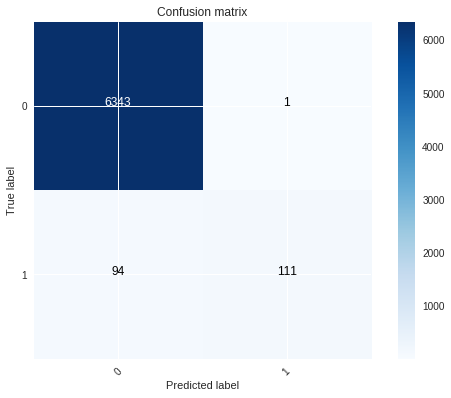

In [508]:
# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [225]:
print(classification_report(y_test, y_predict))

             precision    recall  f1-score   support

          0       0.99      1.00      1.00      8054
          1       0.97      0.65      0.78       133

avg / total       0.99      0.99      0.99      8187



In [512]:
gb.to_csv("first_features.csv")

In [511]:
#0.993099249036
#0.961773323086
# I am going to report this one an it look s more appealing. 

# I am actually very happy these results look very similar. 
# This is the results that I got after running something below.
gb

,feature,score,Category,Period,Type,Variable Description,Variable Name
0,CAPEI,0.008943,Valuation,Fixed Period,Ratio,Shillers Cyclically Adjusted P/E Ratio,CAPEI
1,PEG_1yrforward,0.007481,Valuation,Fixed Period,Ratio,Forward P/E to 1-year Growth (PEG) ratio,PEG_1yrforward
2,optprcey_prtc,0.007317,Liability,% Change,Fixed Value,% Change in Options Outstanding End of Year - ...,optprcey_prtc
3,PEG_trailing,0.007139,Valuation,Fixed Period,Ratio,Trailing P/E to Growth (PEG) ratio,PEG_trailing
4,lt_ppent_prtc,0.007073,Solvency,% Change,Ratio,% Change in Total Liabilities/Total Tangible A...,lt_ppent_prtc
5,dpact_prtc,0.006922,Expense,% Change,Fixed Value,"% Change in Depr., Depl. and Amort. (Accum.) (...",dpact_prtc
6,ps,0.006779,Valuation,Fixed Period,Ratio,Price/Sales,ps
7,cash_conversion,0.006740,Liquidity,Fixed Period,Ratio,Cash Conversion Cycle (Days),cash_conversion
8,int_debt,0.006693,Solvency,Fixed Period,Ratio,Interest/Average Long-term Debt,int_debt
9,xsga_prtc,0.006618,Expense,% Change,Fixed Value,"% Change in Selling, General & Admin. Expenses...",xsga_prtc


In [471]:
gb["Category"] = gb["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
cat = gb.groupby(["Category"]).sum().reset_index()
cat = cat.sort_values("score", ascending=False)

typ = gb.groupby(["Type"]).sum().reset_index()
typ = typ.sort_values("score", ascending=False)

per = gb.groupby(["Period"]).sum().reset_index()
per = per.sort_values("Period", ascending=False)


per

Populating the interactive namespace from numpy and matplotlib
(24938, 284)


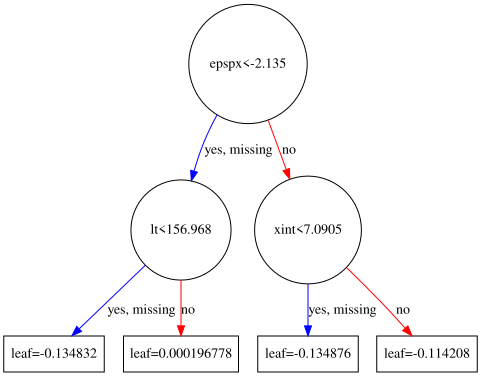

In [249]:
from numpy import loadtxt
from xgboost import plot_tree
import matplotlib.pyplot as plt
#%matplotlib inline
#%matplotlib qt
%pylab inline

final = connect_3.copy()

y = final["Target"]

X = final.drop(["tic","public_date","Target","sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)


print(X_train.shape)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)




param = {}
param['max_depth'] = 2
param['silent'] = 0
param['objective'] = "binary:logistic"
param['subsample'] = 0.8
param['colsample_bytree'] = 0.6
param['learning_rate'] = 0.1
param['min_child_weight'] = 2
param['n_estimators'] = 200
param['nthread'] = 1

num_round = 10
bst = xgb.train(param, dtrain, num_round)
# make prediction
preds = bst.predict(dtest)

    
pickle.dump(bst, open("put.sav", 'wb'))

#xgb.plot_tree(bst, num_trees=2)

#plot_tree(bst, num_trees=2)

#plt.show()


xgb.to_graphviz(bst, num_trees=6, format ='png', filename= "door.png")

#plt.show()

# Do this once you have restarted the algo.
# plot_tree(model, num_trees=0, rankdir='LR')


In [98]:
xgb.plot_tree(bst, num_trees=2)
plt.show()

IndexError: list index out of range

Average precision-recall score: 0.96


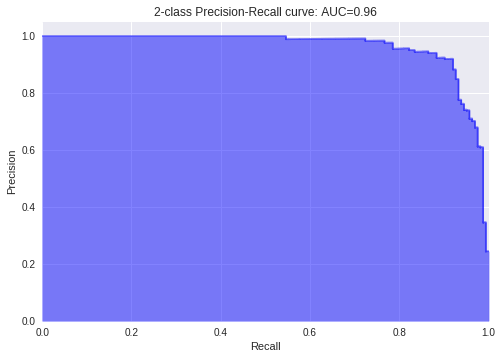

In [53]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.metrics import average_precision_score

average_precision = average_precision_score(y_test, y_pred)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))


precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AUC={0:0.2f}'.format(
          average_precision))
plt.show()

In [73]:
dtest["test"]

TypeError: 'DMatrix' object is not subscriptable

In [73]:
dtest["test"]

TypeError: 'DMatrix' object is not subscriptable


    clf = XGBClassifier(
                      max_depth=7,
                      objective= 'binary:logistic', 
                      silent=1, 
                      seed=29)

n_digits: 2, 	 n_samples 15104, 	 n_features 284
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	1.48s	2134	0.059	0.015	0.024	0.026	0.015	0.331
random   	1.27s	2134	0.059	0.015	0.024	0.026	0.015	0.333
PCA-based	0.17s	2134	0.058	0.015	0.024	0.026	0.015	0.331
__________________________________________________________________________________


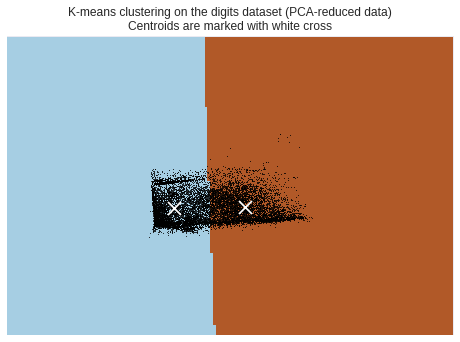

In [36]:
print(__doc__)

from time import time
import numpy as np
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

np.random.seed(42)


X_norm = (X - X.mean()) / (X.max() - X.min())

data = X_norm


n_samples, n_features = data.shape
n_digits = 2
labels = final["Target"]

sample_size = 10000

print("n_digits: %d, \t n_samples %d, \t n_features %d"
      % (n_digits, n_samples, n_features))


print(82 * '_')
print('init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette')


def bench_k_means(estimator, name, data):
    t0 = time()
    estimator.fit(data)
    print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.inertia_,
             metrics.homogeneity_score(labels, estimator.labels_),
             metrics.completeness_score(labels, estimator.labels_),
             metrics.v_measure_score(labels, estimator.labels_),
             metrics.adjusted_rand_score(labels, estimator.labels_),
             metrics.adjusted_mutual_info_score(labels,  estimator.labels_),
             metrics.silhouette_score(data, estimator.labels_,
                                      metric='euclidean',
                                      sample_size=sample_size)))

bench_k_means(KMeans(init='k-means++', n_clusters=n_digits, n_init=10),
              name="k-means++", data=data)

bench_k_means(KMeans(init='random', n_clusters=n_digits, n_init=10),
              name="random", data=data)

# in this case the seeding of the centers is deterministic, hence we run the
# kmeans algorithm only once with n_init=1
pca = PCA(n_components=n_digits).fit(data)
bench_k_means(KMeans(init=pca.components_, n_clusters=n_digits, n_init=1),
              name="PCA-based",
              data=data)
print(82 * '_')

# #############################################################################
# Visualize the results on PCA-reduced data

reduced_data = PCA(n_components=2).fit_transform(data)
kmeans = KMeans(init='k-means++', n_clusters=n_digits, n_init=10)
kmeans.fit(reduced_data)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max,h),
                     np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
plt.title('K-means clustering on the digits dataset (PCA-reduced data)\n'
          'Centroids are marked with white cross')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

In [220]:
print(__doc__)

from itertools import product

import numpy as np
import matplotlib.pyplot as plt

from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier

# Loading some example data

# Training classifiers
clf1 = pickle.load(open("anker.sav", 'rb'))

X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)

y = final["Target"]


X = X.ix[:,["CAPEI","GProf"]].as_matrix()

clf1.fit(X, y)


# Plotting decision regions
x_min, x_max = X[:,0].min() - 1, X[:,0].max() + 1
y_min, y_max = X[:,1].min() - 1, X[:,1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

# plt.figure() 

f, axarr = plt.subplots(2,2,sharex='col', sharey='row', figsize=(10, 8))


Z = clf1.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

mAKE SURE THAT you mix the X and Y values to get the right X and Y , OR JUST sort by date


XGBoostError: b'[17:04:04] src/tree/updater_colmaker.cc:161: Check failed: (n) > (0) colsample_bytree=0.2 is too small that no feature can be included'

In [218]:
for idx in product([0, 1], [0, 1]):
    axarr[idx[0], idx[1]].contourf(xx, yy, Z, alpha=0.4)
    axarr[idx[0], idx[1]].scatter(X[:, 0], X[:, 1], c=y,
                                  s=20, edgecolor='k')
    axarr[idx[0], idx[1]].set_title("XGBoost")

plt.show()

NameError: name 'axarr' is not defined

This is the format of your plot grid:
[ (1,1) x1,y1 ]

[learning_curve] Training set sizes: [ 2660  8645 14630 20615 26600]
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV] ................................. , score=0.963614, total= 1.9min


[Parallel(n_jobs=10)]: Done   1 out of  10 | elapsed:  1.9min remaining: 17.3min


[CV] ................................. , score=0.972034, total= 2.0min
[CV] ................................. , score=0.967373, total= 6.9min


[Parallel(n_jobs=10)]: Done   3 out of  10 | elapsed:  7.1min remaining: 16.5min


[CV] ................................. , score=0.973688, total= 7.1min
[CV] ................................. , score=0.968877, total=11.9min


[Parallel(n_jobs=10)]: Done   5 out of  10 | elapsed: 12.2min remaining: 12.2min


[CV] ................................. , score=0.975192, total=12.6min
[CV] ................................. , score=0.970831, total=17.5min


[Parallel(n_jobs=10)]: Done   7 out of  10 | elapsed: 18.0min remaining:  7.7min


[CV] ................................. , score=0.975793, total=18.6min
[CV] ................................. , score=0.970831, total=23.8min
[CV] ................................. , score=0.977146, total=24.8min


[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed: 25.4min finished


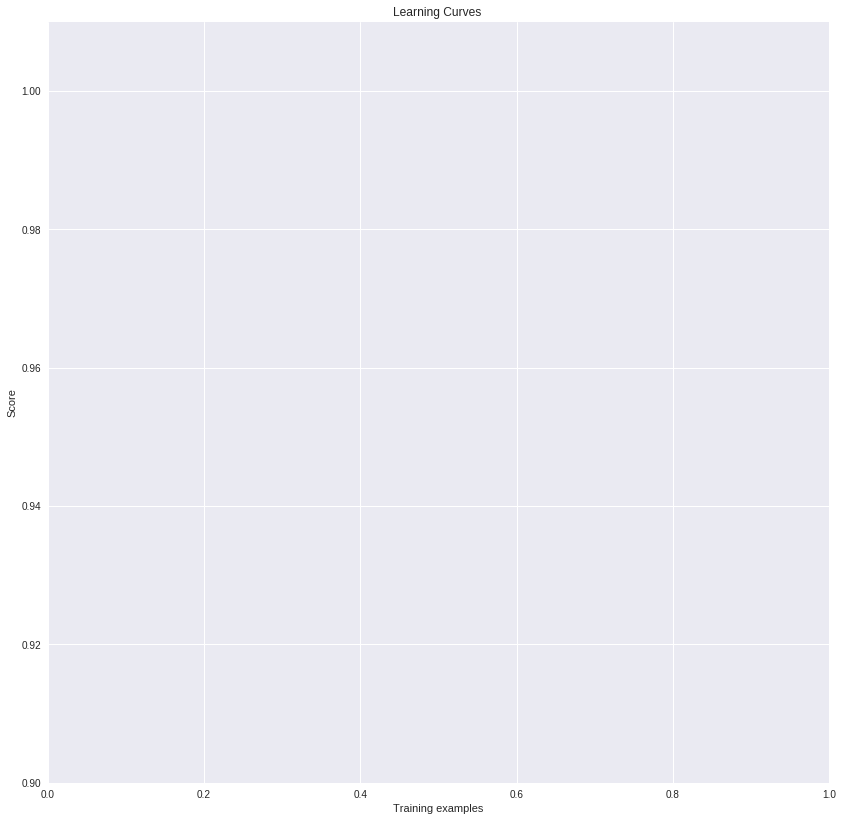

In [447]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

from plotly import tools

fig = tools.make_subplots(rows=1, cols=1)

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - An object to be used as a cross-validation generator.
          - An iterable yielding train/test splits.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : integer, optional
        Number of jobs to run in parallel (default 1).
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, verbose=10)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
        
    p1 = go.Scatter(x=train_sizes, y=test_scores_mean + test_scores_std,
                    mode='lines',
                    line=dict(color="green", width=1),
                    showlegend=False,  )
    fig.append_trace(p1,1,1)
    
    p2 = go.Scatter(x=train_sizes, y=test_scores_mean - test_scores_std,
                    mode='lines',
                    line=dict(color="green", width=1),
                    showlegend=False, fill='tonexty')
    fig.append_trace(p2,1,1)
    
    p3 = go.Scatter(x=train_sizes, y=train_scores_mean + train_scores_std,
                    mode='lines',
                    line=dict(color="red", width=1),
                    showlegend=False)
    fig.append_trace(p3,1,1)
    
    p4 = go.Scatter(x=train_sizes, y=train_scores_mean - train_scores_std,
                    mode='lines',
                    line=dict(color="red", width=1),
                    showlegend=False, fill='tonexty')
    fig.append_trace(p4,1,1)
    
    p5 = go.Scatter(x=train_sizes, y=train_scores_mean, 
                    marker=dict(color='red'),
                    name="Training score")
    fig.append_trace(p5,1,1)
    
    p6 = go.Scatter(x=train_sizes, y=test_scores_mean, 
                    marker=dict(color='green'),
                    name="Cross-validation score")
    fig.append_trace(p6,1,1)

    
title = "Learning Curves "
# Cross validation with 100 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=2, test_size=0.2, random_state=0)



estimator = pickle.load(open("ganker.sav", 'rb'))
plot_learning_curve(estimator, title, X, Y, ylim=(0.9, 1.01), cv=cv, n_jobs=10)



"""
If the training score is much greater than the validation score for the
maximum number of training samples, adding more training samples will 
most likely increase generalization.
"""
fig['layout'].update(hovermode='closest')
py.iplot(fig)

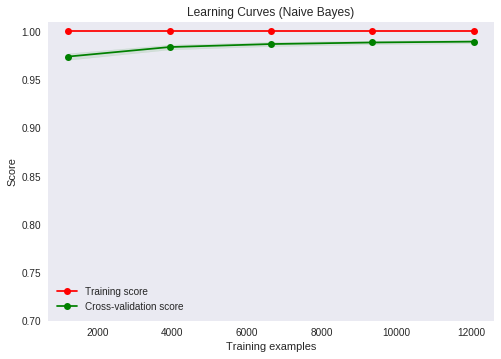

In [500]:
savefig('lc.png')

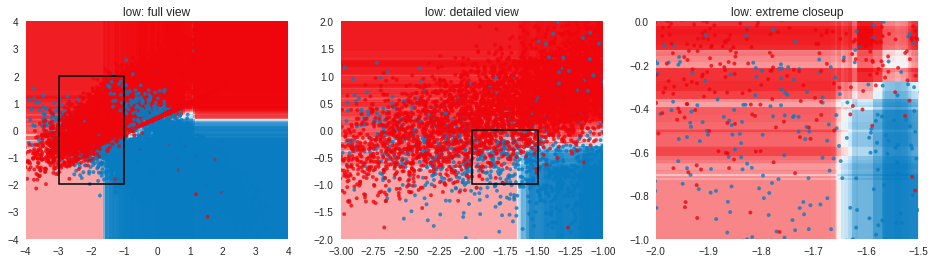

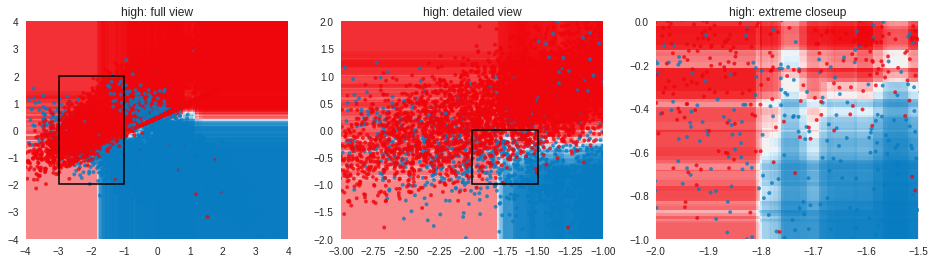

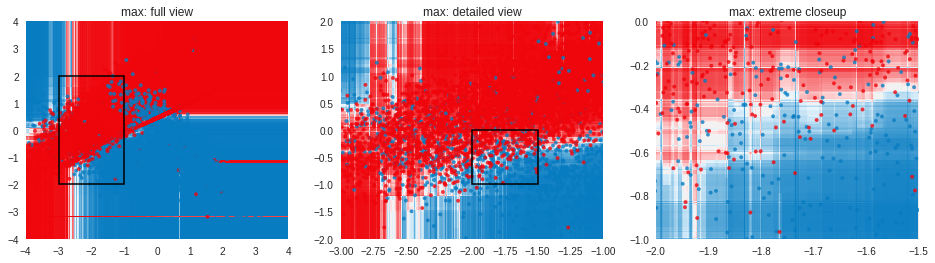

In [348]:
from sklearn.datasets import make_classification


my_cm = sns.diverging_palette(h_neg=245, h_pos=12, s=99, l=50, sep=15, n=16, center='light', as_cmap=True)

raw_data, raw_target = make_classification(n_samples=20000, n_features=2, n_informative=2, n_redundant=0, 
                                           n_repeated=0, n_classes=2, n_clusters_per_class=2, weights=[0.20, 0.80], 
                                           flip_y=0.01, class_sep=1.0, hypercube=True, shift=0.0, scale=1, 
                                           shuffle=False, random_state=222)
train, test, train_t, test_t = train_test_split(raw_data, raw_target, test_size=0.2, random_state=2)
pd.DataFrame(np.hstack([raw_data, raw_target[:,None]]), columns=['x', 'y', 'target']).head(3)


common_args = {'max_depth': 4, 'n_estimators': 500, 'subsample': 0.9, 'random_state': 2}

models = [
          
         
    ('low', GradientBoostingClassifier(learning_rate= 0.23, min_samples_leaf=2000, min_samples_split=1000, **common_args)),
    ('high', GradientBoostingClassifier(learning_rate= 0.23, min_samples_leaf=1700, min_samples_split=750, **common_args)),
     ('max', GradientBoostingClassifier(learning_rate= 0.05, min_samples_leaf=1, min_samples_split=2, **common_args)),
         ]
stage_preds = {}
final_preds = {}

for mname, m in models:
    m.fit(train, train_t)
    stage_preds[mname] = {'train': list(m.staged_predict_proba(train)),  'test': list(m.staged_predict_proba(test))}
    final_preds[mname] = {'train': m.predict_proba(train),  'test': m.predict_proba(test)}
    
    
    
def gen_plot(mname, model, xlim=(-4, 4), ylim=(-4, 4), gridsize=0.02, marker="."):
    xx, yy = np.meshgrid(np.arange(xlim[0], xlim[1], gridsize),
                         np.arange(ylim[0], ylim[1], gridsize))
    plt.xlim(*xlim)
    plt.ylim(*ylim)
    Z = model.predict_proba(list(zip(xx.ravel(), yy.ravel())))
    plt.title(mname)
    plt.pcolormesh(xx, yy, Z[:,1].reshape(xx.shape), cmap=my_cm)
    plt.scatter(raw_data[:,0], raw_data[:,1], c=raw_target, alpha=0.8, marker=marker, cmap=my_cm)

for mname, model in models:
    plt.figure(figsize=(16,4))
    plt.subplot(1,3,1)
    gen_plot("%s: full view" % mname, model)
    plt.axhspan(-2, 2, 0.125, 0.375, fill=False, lw=1.5)

    plt.subplot(1,3,2)
    gen_plot("%s: detailed view" % mname, model, (-3, -1), (-2, 2), 0.005)
    plt.axhspan(-1, 0, 0.5, 0.75, fill=False, lw=1.5)

    plt.subplot(1,3,3)
    gen_plot("%s: extreme closeup" % mname, model, (-2, -1.5), (-1, 0), 0.00125)

    plt.show()
    


In [321]:
X.shape

(33251, 284)

In [37]:

import numpy as np
from scipy import interp
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold



# #############################################################################
# Classification and ROC analysis

# Run classifier with cross-validation and plot ROC curves
cv = StratifiedKFold(n_splits=6)
classifier = pickle.load(open("anker.sav", 'rb'))

tprs = []
aucs = []

mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)

colors = cycle(['cyan', 'indigo', 'seagreen', 'red', 'blue', 'darkorange'])
lw = 2

y = final["Target"]

print(y.value_counts())


X = final.drop(["tic","Target","sic_prtc","fyear_x","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
X = X.drop(["sic","naics","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik","emol","emol_prtc"],axis=1)

X = X.as_matrix()
y = y.as_matrix()

i = 0
data = []
for (train, test), color in zip(cv.split(X, y), colors):
    
    
    X_train, X_test = X[train], X[test]
    y_train, y_test = y[train], y[test]
    
    
    probas = classifier.fit(X_train, y_train).predict_proba(X_test)
    # Compute ROC curve and area the curve
    
    fpr, tpr, thresholds = roc_curve(y_test, probas[:, 1])

    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    
    trace = go.Scatter(x=fpr, y=tpr, 
                       mode='lines', 
                       line=dict(width=lw, color=color),
                       name='ROC fold %d (area = %0.2f)' % (i, roc_auc))

    data.append(trace)
    i += 1
    
trace = go.Scatter(x=[0, 1], y=[0, 1], 
                   mode='lines', 
                   line=dict(width=lw, color='black', dash='dash'),
                   name='Luck')
data.append(trace)

mean_tpr /= cv.get_n_splits(X, y)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)

trace = go.Scatter(x=mean_fpr, y=mean_tpr, 
                   mode='lines', 
                   line=dict(width=lw, color='green', dash='dash'),
                   name='Mean ROC (area = %0.2f)' % mean_auc)
data.append(trace)

layout = go.Layout(title='Receiver operating characteristic example',
                   xaxis=dict(title='False Positive Rate', showgrid=False,
                              range=[-0.05, 1.05]),
                   yaxis=dict(title='True Positive Rate', showgrid=False,
                              range=[-0.05, 1.05]))
fig = go.Figure(data=data, layout=layout)

0    32013
1     1238
Name: Target, dtype: int64


KeyboardInterrupt: 

In [ ]:

import plotly.plotly as py
import plotly.graph_objs as go

py.iplot(fig)

In [262]:
fig.savefig('plot.png')
savefig('foo.png')

TypeError: 'NoneType' object is not callable

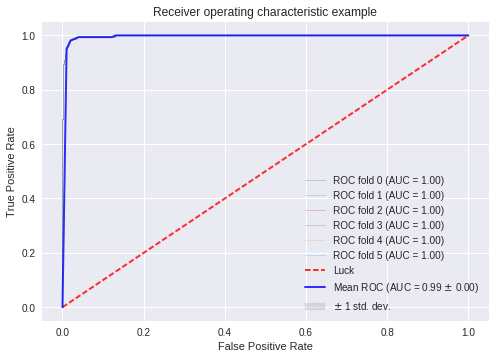

In [498]:

import numpy as np
from scipy import interp
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold



# #############################################################################
# Classification and ROC analysis

# Run classifier with cross-validation and plot ROC curves
cv = StratifiedKFold(n_splits=6)
classifier = pickle.load(open("anker.sav", 'rb'))

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

i = 0
for train, test in cv.split(X, y):
    probas_ = classifier.fit(X_train, y_train).predict_proba(X_test)
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=1, alpha=0.3,
             label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))

    i += 1
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
         label='Luck', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',
         label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
         lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                 label=r'$\pm$ 1 std. dev.')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [1012]:
value.head()

,tic,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Debtor Firms,Companies,Ticker,Industry Division,Industry Group,Cause,Date Filed,Disposition,§363 Sale,Duration,Inc. State,District Filed,City Filed,Forum Shopping,Filing Party,Plan Type,Employees,Business Survival,Refiled,Headquarters City,Region,City,Date Disposed,Asset Size,Employee Size,Annual Sales,Assets (millions),Chapter at Filing,Debtor's Attorney
31,0160A,0,2008-01-31,29.140,1.109,0.579000,1.646000,0.179000,0.063,23.748,189.224,0.016,0.336,0.336,0.000,22.603,-0.171,52.915,0.621,2.008020e+07,0.0,2.136,397.184,397.184,0.199,0.000,68.794,56.858000,0.682,0.414,0.596,208.295,0.134,33.313,786110.0,446.869,0.695,1.774,0.822,0.451,0.000,0.185,0.000,0.000,0.000,0.0,1.984093e+07,6.000000,0.0,0.000,0.000,0.000,190.796,31.151,0.0,0.0,0.369,0.395764,2.67,2.79,1.000,0.0,7.772,0.338,0.000,-164.346,17.579,2007.0,2007.0,1.0,1.0,0.519,80.331,80.331,0.104041,0.094439,190.145808,307.685,479.155,3.899,-14.874,119.523,0.473,0.000,0.0,0.000,0.0,60.531,129.325,70.282,131.186,57.703,188.889,0.000,1.097,0.0,3152.0,80.331,3.378,0.091,107.

In [1020]:
connect.head()

,CAPEI,CAPEI_prtc,GProf,GProf_prtc,PEG_1yrforward,PEG_1yrforward_prtc,PEG_ltgforward,PEG_ltgforward_prtc,PEG_trailing,PEG_trailing_prtc,Target,accrual,accrual_prtc,aco,aco_prtc,act,act_prtc,adv_sale,adv_sale_prtc,aftret_eq,aftret_eq_prtc,aftret_equity,aftret_equity_prtc,aftret_invcapx,aftret_invcapx_prtc,ao,ao_prtc,aoloch,aoloch_prtc,ap,ap_prtc,apalch,apalch_prtc,apdedate,apdedate_prtc,aqc,aqc_prtc,at_turn,at_turn_prtc,at_x,at_x_prtc,at_y,at_y_prtc,bm,bm_prtc,capital_ratio,capital_ratio_prtc,capx,capx_prtc,cash_conversion,cash_conversion_prtc,cash_debt,cash_debt_prtc,cash_lt,cash_lt_prtc,cash_ratio,cash_ratio_prtc,ceq,ceq_prtc,cfm,cfm_prtc,che,che_prtc,cik,cik_prtc,cogs,cogs_prtc,curr_debt,curr_debt_prtc,curr_ratio,curr_ratio_prtc,de_ratio,de_ratio_prtc,debt_assets,debt_assets_prtc,debt_at,debt_at_prtc,debt_capital,debt_capital_prtc,debt_ebitda,debt_ebitda_prtc,debt_invcap,debt_invcap_prtc,dlc,dlc_prtc,dlcch,dlcch_prtc,dldte,dldte_prtc,dlrsn,dlrsn_prtc,dltis,dltis_prtc,dltr,dltr_prtc,dltt,dltt_be,dltt_be_prtc,dltt_prtc,dpact,dpact_prtc,dpc,dpc_prtc,dpr,dpr_prtc,dv,dv_prtc,efftax,efftax_prtc,emol,emol_prtc,epsfx,epsfx_prtc,epspx,epspx_prtc,equity_invcap,equity_invcap_prtc,esub,esub_prtc,evm,evm_prtc,fcf_ocf,fcf_ocf_prtc,fiao,fiao_prtc,fincf,fincf_prtc,fopo,fopo_prtc,fyear_x,fyear_x_prtc,fyear_y,fyear_y_prtc,fyr_x,fyr_x_prtc,fyr_y,fyr_y_prtc,gpm,gpm_prtc,ib,ib_prtc,ibc,ibc_prtc,int_debt,int_debt_prtc,int_totdebt,int_totdebt_prtc,intan,intan_prtc,intcov,intcov_prtc,intcov_ratio,intcov_ratio_prtc,inv_turn,inv_turn_prtc,invch,invch_prtc,invt,invt_act,invt_act_prtc,invt_prtc,ivaco,ivaco_prtc,ivaeq,ivaeq_prtc,ivao,ivao_prtc,ivch,ivch_prtc,ivncf,ivncf_prtc,ivstch,ivstch_prtc,lco,lco_prtc,lct,lct_prtc,lo,lo_prtc,lt,lt_debt,lt_debt_prtc,lt_ppent,lt_ppent_prtc,lt_prtc,mib,mib_prtc,naics,naics_prtc,niadj,niadj_prtc,nopi,nopi_prtc,npm,npm_prtc,oancf,oancf_prtc,ocf_lct,ocf_lct_prtc,oiadp,oiadp_prtc,oibdp,oibdp_prtc,opmad,opmad_prtc,opmbd,opmbd_prtc,optprcey,optprcey_prtc,pay_turn,pay_turn_prtc,pcf,pcf_prtc,pe_exi,pe_exi_prtc,pe_inc,pe_inc_prtc,pe_op_basic,pe_op_basic_prtc,pe_op_dil,pe_op_dil_prtc,pi,pi_prtc,ppent,ppent_prtc,pretret_earnat,pretret_earnat_prtc,pretret_noa,pretret_noa_prtc,profit_lct,profit_lct_prtc,prstkc,prstkc_prtc,ps,ps_prtc,pstk,pstk_prtc,ptb,ptb_prtc,ptpm,ptpm_prtc,quick_ratio,quick_ratio_prtc,rd_sale,rd_sale_prtc,recch,recch_prtc,rect,rect_act,rect_act_prtc,rect_prtc,rect_turn,rect_turn_prtc,roa,roa_prtc,roce,roce_prtc,roe,roe_prtc,sale,sale_equity,sale_equity_prtc,sale_invcap,sale_invcap_prtc,sale_nwc,sale_nwc_prtc,sale_prtc,seq,seq_prtc,short_debt,short_debt_prtc,sic,sic_prtc,siv,siv_prtc,spi,spi_prtc,sppe,sppe_prtc,sppiv,sppiv_prtc,sstk,sstk_prtc,staff_sale,staff_sale_prtc,stkco,stkco_prtc,totdebt_invcap,totdebt_invcap_prtc,txach,txach_prtc,txbcof,txbcof_prtc,txdc,txdc_prtc,txditc,txditc_prtc,txp,txp_prtc,txt,txt_prtc,xidoc,xidoc_prtc,xint,xint_prtc,xintopt,xintopt_prtc,xsga,xsga_prtc
0,21.933,NaN,0.763,NaN,NaN,NaN,NaN,NaN,0.059,NaN,1,-0.126,NaN,0.126,NaN,12.392,NaN,0.011,NaN,0.435,NaN,0.435,NaN,0.543,NaN,0.322,NaN,NaN,NaN,1.174,NaN,NaN,NaN,NaN,NaN,0.000,NaN,1.551,NaN,16.270,NaN,NaN,NaN,0.207,NaN,0.035,NaN,1.719,NaN,118.954,NaN,0.852,NaN,1.232,NaN,1.445,NaN,13.081,NaN,0.209,NaN,3.929,NaN,NaN,NaN,10.756,NaN,0.853,NaN,4.558,NaN,0.244,NaN,0.196,NaN,0.031,NaN,0.114,NaN,0.057,NaN,0.035,NaN,0.039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.039,NaN,0.470,0.036,NaN,NaN,0.503,NaN,0.241,NaN,0.000,NaN,0.000,NaN,0.486,NaN,NaN,NaN,1.21,NaN,1.21,NaN,0.965,NaN,0.000,NaN,7.101,NaN,0.367,NaN,NaN,NaN,NaN,NaN,0.000,NaN,1976.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,0.536,NaN,4.595,NaN,4.595,NaN,0.104,NaN,0.097,NaN,0.000,NaN,91.098,NaN,171.137,NaN,3.719,NaN,NaN,NaN,3.281,0.265,NaN,NaN,NaN,NaN,0.000,NaN,0.000,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.586,NaN,2.719,NaN,0.000,NaN,3.189,0.147,NaN,0.897,NaN,NaN,0.0,NaN,NaN,NaN,4.595,NaN,0.268,NaN,0.198,NaN,NaN,NaN,0.999,NaN,8.728,NaN,8.969,NaN,0.377,NaN,0.387,NaN,NaN,NaN,6.868,NaN,15.678,NaN,9.194,NaN,9.194,NaN,NaN,Na

In [1025]:
connect_4.head()

,CAPEI_prtc,CAPEI_prtc_prtc,GProf_prtc,GProf_prtc_prtc,PEG_1yrforward_prtc,PEG_1yrforward_prtc_prtc,PEG_ltgforward_prtc,PEG_ltgforward_prtc_prtc,PEG_trailing_prtc,PEG_trailing_prtc_prtc,accrual_prtc,accrual_prtc_prtc,aco_prtc,aco_prtc_prtc,act_prtc,act_prtc_prtc,adv_sale_prtc,adv_sale_prtc_prtc,aftret_eq_prtc,aftret_eq_prtc_prtc,aftret_equity_prtc,aftret_equity_prtc_prtc,aftret_invcapx_prtc,aftret_invcapx_prtc_prtc,ao_prtc,ao_prtc_prtc,aoloch_prtc,aoloch_prtc_prtc,ap_prtc,ap_prtc_prtc,apalch_prtc,apalch_prtc_prtc,apdedate_prtc,apdedate_prtc_prtc,aqc_prtc,aqc_prtc_prtc,at_turn_prtc,at_turn_prtc_prtc,at_x_prtc,at_x_prtc_prtc,at_y_prtc,at_y_prtc_prtc,bm_prtc,bm_prtc_prtc,capital_ratio_prtc,capital_ratio_prtc_prtc,capx_prtc,capx_prtc_prtc,cash_conversion_prtc,cash_conversion_prtc_prtc,cash_debt_prtc,cash_debt_prtc_prtc,cash_lt_prtc,cash_lt_prtc_prtc,cash_ratio_prtc,cash_ratio_prtc_prtc,ceq_prtc,ceq_prtc_prtc,cfm_prtc,cfm_prtc_prtc,che_prtc,che_prtc_prtc,cik_prtc,cik_prtc_prtc,cogs_prtc,cogs_prtc_prtc,curr_debt_prtc,curr_debt_prtc_prtc,curr_ratio_prtc,curr_ratio_prtc_prtc,de_ratio_prtc,de_ratio_prtc_prtc,debt_assets_prtc,debt_assets_prtc_prtc,debt_at_prtc,debt_at_prtc_prtc,debt_capital_prtc,debt_capital_prtc_prtc,debt_ebitda_prtc,debt_ebitda_prtc_prtc,debt_invcap_prtc,debt_invcap_prtc_prtc,dlc_prtc,dlc_prtc_prtc,dlcch_prtc,dlcch_prtc_prtc,dldte_prtc,dldte_prtc_prtc,dlrsn_prtc,dlrsn_prtc_prtc,dltis_prtc,dltis_prtc_prtc,dltr_prtc,dltr_prtc_prtc,dltt_prtc,dltt_be_prtc,dltt_be_prtc_prtc,dltt_prtc_prtc,dpact_prtc,dpact_prtc_prtc,dpc_prtc,dpc_prtc_prtc,dpr_prtc,dpr_prtc_prtc,dv_prtc,dv_prtc_prtc,efftax_prtc,efftax_prtc_prtc,emol_prtc,emol_prtc_prtc,epsfx_prtc,epsfx_prtc_prtc,epspx_prtc,epspx_prtc_prtc,equity_invcap_prtc,equity_invcap_prtc_prtc,esub_prtc,esub_prtc_prtc,evm_prtc,evm_prtc_prtc,fcf_ocf_prtc,fcf_ocf_prtc_prtc,fiao_prtc,fiao_prtc_prtc,fincf_prtc,fincf_prtc_prtc,fopo_prtc,fopo_prtc_prtc,fyear_x_prtc,fyear_x_prtc_prtc,fyear_y_prtc,fyear_y_prtc_prtc,fyr_x_prtc,fyr_x_prtc_prtc,fyr_y_prtc,fyr_y_prtc_prtc,gpm_prtc,gpm_prtc_prtc,ib_prtc,ib_prtc_prtc,ibc_prtc,ibc_prtc_prtc,int_debt_prtc,int_debt_prtc_prtc,int_totdebt_prtc,int_totdebt_prtc_prtc,intan_prtc,intan_prtc_prtc,intcov_prtc,intcov_prtc_prtc,intcov_ratio_prtc,intcov_ratio_prtc_prtc,inv_turn_prtc,inv_turn_prtc_prtc,invch_prtc,invch_prtc_prtc,invt_prtc,invt_act_prtc,invt_act_prtc_prtc,invt_prtc_prtc,ivaco_prtc,ivaco_prtc_prtc,ivaeq_prtc,ivaeq_prtc_prtc,ivao_prtc,ivao_prtc_prtc,ivch_prtc,ivch_prtc_prtc,ivncf_prtc,ivncf_prtc_prtc,ivstch_prtc,ivstch_prtc_prtc,lco_prtc,lco_prtc_prtc,lct_prtc,lct_prtc_prtc,lo_prtc,lo_prtc_prtc,lt_prtc,lt_debt_prtc,lt_debt_prtc_prtc,lt_ppent_prtc,lt_ppent_prtc_prtc,lt_prtc_prtc,mib_prtc,mib_prtc_prtc,naics_prtc,naics_prtc_prtc,niadj_prtc,niadj_prtc_prtc,nopi_prtc,nopi_prtc_prtc,npm_prtc,npm_prtc_prtc,oancf_prtc,oancf_prtc_prtc,ocf_lct_prtc,ocf_lct_prtc_prtc,oiadp_prtc,oiadp_prtc_prtc,oibdp_prtc,oibdp_prtc_prtc,opmad_prtc,opmad_prtc_prtc,opmbd_prtc,opmbd_prtc_prtc,optprcey_prtc,optprcey_prtc_prtc,pay_turn_prtc,pay_turn_prtc_prtc,pcf_prtc,pcf_prtc_prtc,pe_exi_prtc,pe_exi_prtc_prtc,pe_inc_prtc,pe_inc_prtc_prtc,pe_op_basic_prtc,pe_op_basic_prtc_prtc,pe_op_dil_prtc,pe_op_dil_prtc_prtc,pi_prtc,pi_prtc_prtc,ppent_prtc,ppent_prtc_prtc,pretret_earnat_prtc,pretret_earnat_prtc_prtc,pretret_noa_prtc,pretret_noa_prtc_prtc,profit_lct_prtc,profit_lct_prtc_prtc,prstkc_prtc,prstkc_prtc_prtc,ps_prtc,ps_prtc_prtc,pstk_prtc,pstk_prtc_prtc,ptb_prtc,ptb_prtc_prtc,ptpm_prtc,ptpm_prtc_prtc,quick_ratio_prtc,quick_ratio_prtc_prtc,rd_sale_prtc,rd_sale_prtc_prtc,recch_prtc,recch_prtc_prtc,rect_prtc,rect_act_prtc,rect_act_prtc_prtc,rect_prtc_prtc,rect_turn_prtc,rect_turn_prtc_prtc,roa_prtc,roa_prtc_prtc,roce_prtc,roce_prtc_prtc,roe_prtc,roe_prtc_prtc,sale_prtc,sale_equity_prtc,sale_equity_prtc_prtc,sale_invcap_prtc,sale_invcap_prtc_prtc,sale_nwc_prtc,sale_nwc_prtc_prtc,sale_prtc_prtc,seq_prtc,seq_prtc_prtc,short_debt_prtc,short_debt_prtc_prtc,sic_prtc,sic_prtc_prtc,siv_prtc,siv_pr

In [1032]:
spike_cols = 

In [1036]:
final.head()

,Target,public_date,Target,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc
0,0,2009-01-31 00:00:00,1,11.740,0.190,0.195000,0.872000,1.529526,-0.013,0.465,27.796,0.008,0.064,0.064,0.087,0.310,-0.036936,0.941,0.372896,2.003984e+07,2.711,0.420,42.062,140.645692,0.641,0.000,3.705,476.190,0.522,5.220,8.118,39.118,0.249,15.368,354655.0,6.033,0.643,14.684,0.075,0.070,0.000,0.023,0.000,0.000,0.000,0.037000,1.985053e+07,1.0,0.000,0.058,0.000,0.000,3.698,1.521,0.365,0.721,0.376000,0.395779,0.45,0.45,1.000,0.0,20.425,-1.411000,-0.063263,-0.139492,0.000,1984.0,1981.971676,6.0,12.000000,0.570,1.978,1.978,0.862,0.526,2.597,80.120,61.840,0.875,-0.245978,6.593,0.237,0.000,0.0,1.647,0.736,-0.552861,0.0,0.835,1.893,0.000,2.944,0.000,0.303,0.000,333132.0,1.978,1.647,0.141,0.372896,0.812,1.546,3.067,0.110,0.219,16.954931,7.956,25.318,18.889,18.889,15.159244,8.369632,3.168,9.712,0.051,0.054,1.620,0.000,2.775,0.0,0.969,0.226,11.201,0.130,-0.364252,5.370,0.193,3.642,0.092,0.050,0.063,14.025,0.359,0.359,0.541,39.118,0.183577,3533.0,0.000,0.000,0.005876,-0.001567,15.400,0.0,2.900733,0.000,0.000,0.0,0.450,1.051,0.117

In [1]:
# Two approach it to either map with region or with distribution. I will go region.

features = {}
classification = {}
accuracy = {}
auc_n = {}

for key, value in bill.items():
    
    
    #Multiply by ratio, divide by year, divide by hoe many tickers in year

    mergy_2 = value
    mergy_2['public_date'] = mergy_2['public_date'].apply(lambda x: parse(str(x)))
    
    blok = {}


    blok[0] = mergy_2[mergy_2['public_date']<"1986-01-01"].shape[0]*25/4
    blok[1] = (mergy_2[mergy_2['public_date']<"1996-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"1986-01-01"].shape[0])*25/4
    blok[2] = (mergy_2[mergy_2['public_date']<"2006-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"1996-01-01"].shape[0])*20/4
    blok[3] = (mergy_2[mergy_2['public_date']<"2016-01-01"].shape[0]-mergy_2[mergy_2['public_date']<"2006-01-01"].shape[0])*20/4

    # Creating Artificial DataFrame

    import random
    random.seed(42)
    conn = pd.DataFrame()
    r = -1

    for fixer, fixed, ratio in zip(["fixer_1976.csv","fixer_1986.csv","fixer_1996.csv","fixer_2006.csv"],
                                   ["fixed_1976.csv","fixed_1986.csv","fixed_1996.csv","fixed_2006.csv"], 
                                  ["ratio_1976.csv","ratio_1986.csv","ratio_1996.csv","ratio_2006.csv"]):

        r = r + 1

        fsmall = pd.read_csv(fixer)

        fbig = pd.read_csv(fixed)

        fcon = pd.merge(fsmall, fbig, on=["tic","datadate"], how="left")

        frat = pd.read_csv(ratio)
        
        frat.drop_duplicates(["gvkey","qdate"],keep="last")

        #fcon['datadate'] = fcon['datadate'].apply(lambda x: parse(str(x)))
        #frat['qdate'] = frat['qdate'].apply(lambda x: parse(str(x)))

        rat_fin = pd.merge(frat, fcon, left_on=["gvkey","qdate"], right_on=["gvkey_x","datadate"])

        rat_fin = rat_fin.drop_duplicates(["gvkey","adate"],keep="last")
    
    
        len(rat_fin["gvkey_x"].unique())

        rat_fin_1 = rat_fin[~rat_fin["gvkey_x"].isnull()]

        first = rat_fin_1

        first = first[~first["tic"].isin(list(mergy["tic"]))]

        first = first.groupby(["tic"]).tail(4)

        dropsy = first["tic"].value_counts() >3

        blom = np.where(dropsy==True)

        dropsy = dropsy[:blom[0][-1]]

        first = first[first["tic"].isin(list(dropsy.index))]

        first = first.reset_index(drop=True)
        first.shape

        name= list(first["tic"].unique())

        num_to_select = int(blok[r])       # set the number to select here.
        list_of = random.sample(name, num_to_select)

        first = first[first["tic"].isin(list_of)]
        print(first.shape)

        conn = conn.append(first)

        
        
    print(conn.shape)

    conn = conn.reset_index(drop=True)

    conn_1 = pd.merge(conn,bank_dp, left_on=["tic"], right_on=["Ticker"], how="left")

    conn_1["Target"] = 1.0

    connect = pd.concat((conn_1, mergy_2), axis=0)

    connect.shape

    connect = connect.drop(bank_dp.columns,axis=1)

    connect = connect.reset_index(drop=True)
    print(connect.shape)

    saved_1 = connect[["adate","Target","conm_x","consol","conm_y","costat","curcd","cusip_x","cusip_y","gvkey","gvkey_x","gvkey_y","datadate","indfmt","datafmt","tic","state","public_date","qdate","divyield"]]

    connect = connect.drop(["adate","popsrc","conm_x","consol","conm_y","costat","curcd","cusip_x","cusip_y","gvkey","gvkey_x","gvkey_y","tic","datadate","indfmt","datafmt","state","public_date","qdate","divyield"],axis=1)


    connect["Target"] = connect["Target"].astype(float)

    connect = connect.select_dtypes(include=[np.float])
    
    final = connect

    final = final.reset_index(drop=True)
    
    
    final = final.drop(final.filter(like='prtc').columns,axis=1)

    # df is my data frame with the missings. I keep only floats
    df_numeric_1 = final.select_dtypes(include=[np.float]).copy().as_matrix()

    # I now run fancyimpute KNN, 
    # it returns a np.array which I store as a pandas dataframe
    df_filled_1 = pd.DataFrame(KNN(3).complete(df_numeric_1)).copy()

    df_filled_1.columns = final.select_dtypes(include=[np.float]).columns
    df_filled_1.index = final.select_dtypes(include=[np.float]).index
    #connect = df_filled_1

    connect_4 = df_filled_1.pct_change().copy()

    cols = []

    for i in df_filled_1.columns:
        cols.append(i+'_prtc')

    connect_4 = connect_4.replace("-inf",np.nan)
    connect_4 = connect_4.replace("inf",np.nan)
    connect_4.columns = cols

    # df is my data frame with the missings. I keep only floats

    df_numeric_2 = connect_4.select_dtypes(include=[np.float]).as_matrix().copy()
    df_filled = pd.DataFrame(KNN(3).complete(df_numeric_2))
    df_filled.columns = connect_4.select_dtypes(include=[np.float]).columns
    df_filled.index = connect_4.select_dtypes(include=[np.float]).index
    connect_5 = df_filled  
    
    connect_4 = connect_4.reset_index(drop=True)
    connect_5 = connect_5.reset_index(drop=True)

    connect_6 = pd.concat((connect_4, connect_5),axis=1).copy()

    connect_6 = pd.concat((saved_1[["tic","public_date"]],connect_3),axis=1)

    connect_6 = connect_6.groupby('tic').apply(lambda group: group.iloc[1:, 1:]).reset_index()

    connect_6 = connect_6.drop(["level_1"],axis=1)

    #full_3 = pd.merge(connect_6,bank_dp,left_on="tic",right_on="Ticker",how="left")

    connect_6 = connect_6.drop(['tic'],axis=1)
    
    # 'datadate' 'gvkey' 'qdate' 'adate' 'gvkey_x' 'gvkey_y'
    
    connect_6 = connect_6.fillna(0)

    final= connect_6

    y = final["Target"]
    X = final.drop(["Target","sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["public_date","dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","emol","emol_prtc"],axis=1)
    

    print(y.value_counts())

    import xgboost as xgb
    from xgboost.sklearn import XGBClassifier
    

    
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
    
    
    X_train =  X_train.loc[:, (X_train != 0.0).any(axis=0)]
    
    X_test =  X_test.loc[:, (X_test != 0.0).any(axis=0)]

    clf = XGBClassifier(
                          max_depth=12,
                          objective= 'binary:logistic', 
                          silent=0, 
                          seed=29,
                          nthread= 1,
                          n_estimators= 200,
                          min_child_weight= 0,
                          learning_rate= 0.1,
                          colsample_bytree= 0.2,
                          subsample= 0.8
    )
    
    clf.fit(X_train, y_train)

    y_predict = clf.predict(X_test)
    y_predict_prob = clf.predict_proba(X_test)
    #print metrics.accuracy_score(y_test, y_predict)
    acc = accuracy_score(y_test, y_predict)
    print(acc)
    auc = roc_auc_score(y_test, y_predict)
    print(auc)

    gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X.columns.values})
    #bm, nopiq, intanq, niq,adjex, piq, oibdpq
    gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)
    print(classification_report(y_test, y_predict))
    

    # Connect These 

    rat = pd.read_excel("ratio_tracker.xlsx")
    act = pd.read_excel("acc_tracker.xlsx")

    act = act[["Variable Name","Variable Description"]]
    rat = rat[["Variable Name","Financial Ratio"]]
    rat["Variable Description"] = rat["Financial Ratio"]
    rat.drop("Financial Ratio",axis=1, inplace=True)

    ract = pd.concat((act,rat),axis=0).reset_index(drop=True)

    ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
    ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]

    ract_pct = pd.DataFrame()
    ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
    ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "Percentage Change in "+x)

    blackt = pd.concat((ract,ract_pct),axis=0)


    gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")
    
    features[key] = gb
    classification[key] = classification_report(y_test, y_predict)
    accuracy[key] = acc
    auc_n[key] = auc
    

NameError: name 'bill' is not defined

In [ ]:
1+1

In [121]:
for i in bill.keys():
    print("")
    print(i)
    print(classification[i])
    print(accuracy[i])
    print(auc_n[i])
    print("***************************************************")
    print(features[i][:10])
    print("")
    print("___________________________________________________")


mw
             precision    recall  f1-score   support

          0       0.99      1.00      0.99       511
          1       1.00      0.68      0.81        19

avg / total       0.99      0.99      0.99       530

0.988679245283
0.842105263158
***************************************************
          feature     score   Variable Name  \
0           CAPEI  0.031044           CAPEI   
1           GProf  0.019403           GProf   
2  PEG_ltgforward  0.016197  PEG_ltgforward   
3  PEG_1yrforward  0.015016  PEG_1yrforward   
4    PEG_trailing  0.015016    PEG_trailing   
5              ap  0.012485              ap   
6            at_x  0.012317             NaN   
7              ao  0.010967              ao   
8          aoloch  0.010461          aoloch   
9   aftret_equity  0.010461   aftret_equity   

                                Variable Description  
0             Shillers Cyclically Adjusted P/E Ratio  
1                          Gross Profit/Total Assets  
2        Forward

## Starting Bankruptcy Prediction

In [8]:
saved = saved.reset_index(drop=True)
saved.shape

(41409, 21)

In [13]:
done = saved[saved["Target"]==0].reset_index(drop=True)

done.shape

# Loading some dataframes


connect_4 = connect_3[connect_3["Target"]==1].reset_index(drop=True)

connect_4.shape

inter_pred = pd.concat((done[["public_date"]],connect_4),axis=1)

pred = pd.merge(inter_pred,bank_dp, left_on=["tic"], right_on=["Ticker"], how="left")

pred.shape

one_sample = True 

if one_sample:
    pred = pred.drop_duplicates(["tic"],keep="last")

len(pred["tic"].unique())

pred["Duration_Target"] = pred["Duration"].apply(lambda x: 1 if x>365 else 0 )
pred["Chapter_Target"] = pred["Chapter at Filing"].apply(lambda x: 1 if x=="Chapter 7" else 0)
pred["363_Target"] = pred["§363 Sale"].apply(lambda x: 1 if (x=="363 sale") or (x=="Chapter 7 at filing") else 0)
pred["Tort_Target"] = pred["Cause"].apply(lambda x: 0 if x=="Not tort" else 1)
pred["Survival"] = pred["Business Survival"].apply(lambda x: 1 if x=="Company emerged" else 0)
pred["Party"] = pred["Filing Party"].apply(lambda x: 1 if x=="creditors" else 0)

from sklearn import preprocessing
le = preprocessing.LabelEncoder()

pred["Region"] = pred["Region"].fillna("Northeast")

#pred["Reg"] = le.fit_transform(pred["Region"])

date_file = pred

pred = pred.drop(bank_dp.columns, axis=1)

pred = pred.reset_index(drop=True)

pred["Target"].value_counts()



pred = pred.ix[:,2:]

bank_dp["Filing Party"].value_counts()

debtors      835
creditors     38
Name: Filing Party, dtype: int64

## Year Grouping

In [14]:
pred.head()

,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Duration_Target,Chapter_Target,363_Target,Tort_Target,Survival,Party
0,1.0,1978-12-31,12.716,0.454,-0.042934,0.828609,0.279461,0.033,4.922988,125.973539,0.029,0.028,0.028,0.060,1.315781,-2.244319,12.152291,5.353037,2.007964e+07,0.000,1.597,188.873608,271.319223,1.284,0.264,5.841869,136.642000,0.039,0.040,0.071,111.309085,0.033,6.042631,1.014022e+06,224.239533,0.568,2.390000,0.953,0.488,0.196,0.418,2.240,0.264,6.791543,-1.310166,19790131.0,1.0,1.733377,2.185235,33.480988,0.346,47.301876,5.354005,0.0,5.257402,0.499,0.269311,1.688987,1.758631,0.735,0.23128,7.068,-0.493,-0.545420,11.771823,-0.701529,1978.0,1978.0,12.0,12.0,0.268,7.522143,7.522143,0.116,0.097,3.284209,2.489,3.432,3.751,-1.360906,64.491767,0.516000,-0.027740,4.638391,1.5833,0.677648,-7.299763,0.000000,15.036043,38.970081,1.176651,77.411204,0.376,1.759,0.153318,999990.000000,7.391709,0.41671,0.009,-4.016384,0.169,17.417806,22.480489,0.013,0.054,17.191152,21.866,9.221,30.738000,27.985000,370.202553,-305.961917,14.672103,52.078387,0.02400,0.032000,0.412,0.170321,0.27

In [16]:
date_file['Date Filed']= pd.to_datetime(date_file['Date Filed'])

In [17]:
date_file["year"] = date_file["Date Filed"].dt.year

date_file["year"] = date_file["year"].fillna(value=1)

date_file["year"]= date_file["year"].astype('float64')

In [18]:
dropsy = mergy_2["tic"].value_counts() >2

blom = np.where(dropsy==True)

dropsy = dropsy[:blom[0][-1]]


date_file = date_file[date_file["tic"].isin(list(dropsy.index))].reset_index(drop=True)

In [19]:
date_file = date_file.ix[:,1:]

In [20]:
date_file["inds"] = date_file["Industry Division"].apply(lambda x: x[3:])

In [21]:

date_file["inds"].unique()

array(['Manufacturing', 'Transportation  Communications  Electric  Gas',
       'Mining', 'Retail Trade', 'Finance  Insurance  And Real Estate',
       'Wholesale Trade', 'Services', 'Construction',
       'Agricultural Production Crops'], dtype=object)

In [23]:
date_file["Ticker"].to_csv("tii.csv")

In [25]:
date_file.tail(30)

,tic,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Debtor Firms,Companies,Ticker,Industry Division,Industry Group,Cause,Date Filed,Disposition,§363 Sale,Duration,Inc. State,District Filed,City Filed,Forum Shopping,Filing Party,Plan Type,Employees,Business Survival,Refiled,Headquarters City,Region,City,Date Disposed,Asset Size,Employee Size,Annual Sales,Assets (millions),Chapter at Filing,Debtor's Attorney,Duration_Target,Chapter_Target,363_Target,Tort_Target,Survival,Party,year,inds
587,SUNEQ,1.0,2014-12-31,-9.342,0.051,-0.180000,-2.885000,-0.003000,0.023,608.200000,2788.000000,0.000,-6.347,-6.347,-0.212,828.600,77.500000,1229.700,-36.100000,20141231.0,719.000,0.221,11499.800,11499.800,0.075,0.965,1740.600000,23.984000,-0.111,0.129,0.446000,232.900000,-0.531,1230.000,945436.0,1972.200,0.290000,1.114000,48.819,0.931,0.592,0.974,-100.940,0.882,1079.700,-124.194211,1.987923e+07,2.314251,3951.100000,1253.400000,6119.700,12.665,1360.500000,357.400000,0.040349,0.000000,0.477164,0.308527,-4.40,-4.40,0.032,8.000000,-204.180,-0.121355,1088.700000,3801.700000,346.400000,2014.0,201

In [52]:
# The First One is By year
aggsy = date_file.groupby("year").agg(["sum","mean"]).reset_index()

In [562]:
aggsy

year Target            CAPEI                 GProf            \
              sum mean         sum       mean        sum      mean   
0   1980.0    1.0  1.0   15.963000  15.963000   0.189000  0.189000   
1   1981.0    3.0  1.0   57.844000  19.281333   0.444000  0.148000   
2   1982.0    7.0  1.0  122.565000  17.509286   1.914000  0.273429   
3   1983.0    3.0  1.0   15.783000   5.261000   0.185000  0.061667   
4   1984.0    5.0  1.0  -12.552000  -2.510400   0.913000  0.182600   
5   1985.0    4.0  1.0   -3.083000  -0.770750   0.973000  0.243250   
6   1986.0    6.0  1.0   41.808052   6.968009   0.850000  0.141667   
7   1987.0    5.0  1.0   -3.671000  -0.734200   1.036000  0.207200   
8   1988.0    6.0  1.0   26.702000   4.450333   1.511064  0.251844   
9   1989.0    8.0  1.0 -168.992000 -21.124000   0.165282  0.020660   
10  1990.0   20.0  1.0  162.549000   8.127450   5.094353  0.254718   
11  1991.0   19.0  1.0  106.648000   5.613053   3.742000  0.196947   
12  1992.0   16.0  1.0  158.707000   9.919187   5.526000  0.345375   
13  1993.0   13.0  1.0 -100.525000  -7.732692   4.371000  0.336231   
14  1994.0    5.0  1.0    4.763000   0.952600   1.968000  0.393600   
15  1995.0    9.0  1.0  -31.896000  -3.544000   1.783000  0.198111   
16  1996.0   10.0  1.0  147.190000  14.719000   3.089000  0.308900   
17  1997.0    9.0  1.0 -687.030000 -76.336667   2.116000  0.235111   
18  1998.0   16.0  1.0 -286.723000 -17.920187   5.007000  0.312938   
19  1999.0   26.0  1.0  176.540000   6.790000   5.841000  0.224654   
20  2000.0   45.0  1.0 -425.049000  -9.445533  11.195000  0.248778   
21  2001.0   56.0  1.0  239.604000   4.278643  10.924987  0.195089   
22  2002.0   35.0  1.0 -508.835616 -14.538160   5.389000  0.153971   
23  2003.0   35.0  1.0  686.314000  19.608971   6.245000  0.178429   
24  2004.0   14.0  1.0  -37.619000  -2.687071   2.720000  0.194286   
25  2005.0   15.0  1.0  205.527000  13.701800   4.449000  0.296600   
26  2006.0    7.0  1.0   13.158000   1.879714   0.891000  0.127286   
27  2007.0   10.0  1.0  154.046000  15.404600   3.647000  0.364700   
28  2008.0   26.0  1.0  212.091000   8.157346   5.107000  0.196423   
29  2009.0   56.0  1.0  556.874000   9.944179  11.481000  0.205018   
30  2010.0   23.0  1.0  178.670000   7.768261   2.430000  0.105652   
31  2011.0   10.0  1.0  -23.540000  -2.354000   1.641000  0.164100   
32  2012.0   17.0  1.0  -17.051000  -1.003000   2.096000  0.123294   
33  2013.0   14.0  1.0   20.338000   1.452714   2.703000  0.193071   
34  2014.0   10.0  1.0   47.829000   4.782900   2.406000  0.240600   
35  2015.0   16.0  1.0  -20.237000  -1.264813   4.102000  0.256375   
36  2016.0   23.0  1.0   36.185000   1.573261   1.687000  0.073348   
37  2017.0   14.0  1.0  101.000000   7.214286   4.480000  0.320000   

   PEG_1yrforward           PEG_ltgforward           PEG_trailing            \
              sum      mean            sum      mean          sum      mean   
0        0.600000  0.600000       2.428231  2.428231     0.496000  0.496000   
1       -1.887905 -0.629302       2.278037  0.759346     7.455253  2.485084   
2       -2.731099 -0.390157       3.814429  0.544918     5.454265  0.779181   
3       -0.558529 -0.186176       0.056813  0.018938    -0.455420 -0.151807   
4       -0.287099 -0.057420       1.478379  0.295676     3.240068  0.648014   
5       -6.671000 -1.667750       0.070452  0.017613     2.363120  0.590780   
6       -1.749768 -0.291628      -0.001418 -0.000236     3.667172  0.611195   
7       -0.616091 -0.123218       7.056902  1.411380     3.180658  0.636132   
8       -2.575353 -0.429225      -1.969140 -0.328190     3.794553  0.632426   
9        1.537407  0.192176      11.050693  1.381337     6.192292  0.774037   
10      -0.315679 -0.015784       9.819877  0.490994    11.808776  0.590439   
11      -7.266090 -0.382426      13.186838  0.694044    12.734385  0.670231   
12      -8.642969 -0.540186       6.695627  0.418477    12.409043  0.775565   
13       9.154743  0

In [ ]:
# The Next one is by industry

In [53]:
print_df = pd.DataFrame()

print_df["Year"] = aggsy["year"]
print_df["Bankruptcies"] = aggsy["Target"]["sum"]
print_df["Survived"] = aggsy["Survival"]["sum"]
print_df["Long Legal Process"] = aggsy["Duration_Target"]["sum"]
print_df["Average Duration"] = aggsy["Duration"]["mean"]
print_df["363 Asset Sale"] = aggsy["363_Target"]["sum"]
print_df["Total Assets (Millions)"] = aggsy["Assets (millions)"]["sum"]
print_df["Tortious Bankruptcy"] = aggsy["Tort_Target"]["sum"]



In [54]:
print_df.to_csv("year_group.csv")

In [55]:
print_df = pd.DataFrame()

date_file["reg"] = date_file["Region"]

aggsy = date_file.groupby("reg").agg(["sum","mean"]).reset_index()

print_df["Region"] = aggsy["reg"]
print_df["Bankruptcies"] = aggsy["Target"]["sum"]
print_df["Survived (%)"] = aggsy["Survival"]["sum"]/print_df["Bankruptcies"]
print_df["Long Legal Process (%)"] = aggsy["Duration_Target"]["sum"]/print_df["Bankruptcies"]
print_df["363 Asset Sale (%)"] = aggsy["363_Target"]["sum"]/print_df["Bankruptcies"]
print_df["Total Assets (Billions)"] = aggsy["Assets (millions)"]["sum"]
print_df["Tortious Bankruptcy (%)"] = aggsy["Tort_Target"]["sum"]/print_df["Bankruptcies"]



print_df.to_csv("reg_group.csv")

In [56]:
# TThis is called cross tab awesome. 
reg_ind = pd.crosstab(columns=date_file["reg"], 
                           index=date_file["inds"])

for col in reg_ind.columns:
    reg_ind[col] = reg_ind[col]/reg_ind[col].sum()
reg_ind = reg_ind.round(decimals=2)

(<matplotlib.figure.Figure at 0x7f2103227438>,
 OrderedDict([(('Southeast', 'Manufacturing'),
               (0.0, 0.0, 0.20020974354085233, 0.27056277056277056)),
              (('Southeast', 'Transportation  Communications  Electric  Gas'),
               (0.0,
                0.27380952380952384,
                0.20020974354085233,
                0.21645021645021645)),
              (('Southeast', 'Mining'),
               (0.0,
                0.49350649350649356,
                0.20020974354085233,
                0.069573283858998122)),
              (('Southeast', 'Retail Trade'),
               (0.0,
                0.56632653061224492,
                0.20020974354085233,
                0.13914656771799636)),
              (('Southeast', 'Finance  Insurance  And Real Estate'),
               (0.0,
                0.70871985157699446,
                0.20020974354085233,
                0.13141620284477423)),
              (('Southeast', 'Wholesale Trade'),
               (

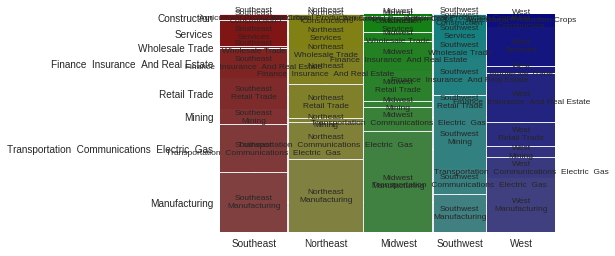

In [1032]:
from statsmodels.graphics.mosaicplot import mosaic

mosaic(date_file, ['reg', 'inds'])

In [1031]:
reg_ind

reg,Midwest,Northeast,Southeast,Southwest,West
inds,,,,,
Agricultural Production Crops,0.01,0.00,0.00,0.00,0.02
Construction,0.00,0.02,0.02,0.04,0.04
Finance Insurance And Real Estate,0.13,0.14,0.13,0.17,0.23
Manufacturing,0.47,0.34,0.28,0.17,0.25
Mining,0.02,0.01,0.07,0.28,0.05
Retail Trade,0.14,0.16,0.14,0.06,0.11
Services,0.07,0.13,0.12,0.07,0.18
Transportation Communications Electric Gas,0.11,0.17,0.22,0.12,0.09
Wholesale Trade,0.04,0.03,0.01,0.08,0.03


In [26]:
date_file.tail(30)

,tic,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Debtor Firms,Companies,Ticker,Industry Division,Industry Group,Cause,Date Filed,Disposition,§363 Sale,Duration,Inc. State,District Filed,City Filed,Forum Shopping,Filing Party,Plan Type,Employees,Business Survival,Refiled,Headquarters City,Region,City,Date Disposed,Asset Size,Employee Size,Annual Sales,Assets (millions),Chapter at Filing,Debtor's Attorney,Duration_Target,Chapter_Target,363_Target,Tort_Target,Survival,Party,year,inds
587,SUNEQ,1.0,2014-12-31,-9.342,0.051,-0.180000,-2.885000,-0.003000,0.023,608.200000,2788.000000,0.000,-6.347,-6.347,-0.212,828.600,77.500000,1229.700,-36.100000,20141231.0,719.000,0.221,11499.800,11499.800,0.075,0.965,1740.600000,23.984000,-0.111,0.129,0.446000,232.900000,-0.531,1230.000,945436.0,1972.200,0.290000,1.114000,48.819,0.931,0.592,0.974,-100.940,0.882,1079.700,-124.194211,1.987923e+07,2.314251,3951.100000,1253.400000,6119.700,12.665,1360.500000,357.400000,0.040349,0.000000,0.477164,0.308527,-4.40,-4.40,0.032,8.000000,-204.180,-0.121355,1088.700000,3801.700000,346.400000,2014.0,201

In [57]:
print_df = pd.DataFrame()

aggsy = date_file.groupby("inds").agg(["sum","mean"]).reset_index()

print_df["Industry"] = aggsy["inds"]
print_df["Bankruptcies"] = aggsy["Target"]["sum"]
print_df["Survived"] = aggsy["Survival"]["sum"]/print_df["Bankruptcies"]
print_df["Long Legal Process"] = aggsy["Duration_Target"]["sum"]/print_df["Bankruptcies"]
print_df["Average Duration"] = aggsy["Duration"]["mean"]
print_df["363 Asset Sale"] = aggsy["363_Target"]["sum"]/print_df["Bankruptcies"]
print_df["Total Assets (Millions)"] = aggsy["Assets (millions)"]["sum"]
print_df["Tortious Bankruptcy"] = aggsy["Tort_Target"]["sum"]/print_df["Bankruptcies"]


print_df.to_csv("inds_group.csv")

In [58]:
print_df

,Industry,Bankruptcies,Survived,Long Legal Process,Average Duration,363 Asset Sale,Total Assets (Millions),Tortious Bankruptcy
0,Agricultural Production Crops,3.0,0.666667,0.333333,233.666667,0.666667,2944.0,0.000000
1,Construction,16.0,0.875000,0.562500,632.187500,0.062500,16781.0,0.062500
2,Finance Insurance And Real Estate,98.0,0.244898,0.540816,617.451220,0.285714,1980325.0,0.051020
3,Manufacturing,191.0,0.722513,0.575916,617.037634,0.287958,524179.0,0.109948
4,Mining,47.0,0.659574,0.297872,299.382979,0.170213,74850.0,0.021277
5,Retail Trade,77.0,0.571429,0.675325,652.635135,0.298701,108163.0,0.025974
6,Services,72.0,0.638889,0.416667,410.681159,0.180556,122215.0,0.083333
7,Transportation Communications Electric Gas,91.0,0.703297,0.560440,564.166667,0.164835,376039.0,0.021978
8,Wholesale Trade,22.0,0.636364,0.500000,550.272727,0.136364,25147.0,0.090909


##  Alternative Predictions

In [10]:
params = {}


params["Duration_Target"] = {}
params["Survival"] = {}
params["Chapter_Target"] = {}
params["363_Target"] = {}
params["Tort_Target"] = {}
params["Party"] = {}

params["Duration_Target"]['nthread'] = 1
params["Duration_Target"]['objective'] = 'binary:logistic'
params["Duration_Target"]['learning_rate'] = 0.1
params["Duration_Target"]['max_depth'] = 2
params["Duration_Target"]['min_child_weight'] = 0
params["Duration_Target"]['silent'] = 0
params["Duration_Target"]['subsample'] = 0.8
params["Duration_Target"]['colsample_bytree'] = 0.3
params["Duration_Target"]['n_estimators'] = 70
params["Duration_Target"]['seed'] = 1337

params["Survival"]['nthread'] = 1
params["Survival"]['objective'] = 'binary:logistic'
params["Survival"]['learning_rate'] = 0.1
params["Survival"]['max_depth'] = 1
params["Survival"]['min_child_weight'] = 1
params["Survival"]['silent'] = 0
params["Survival"]['subsample'] = 0.8
params["Survival"]['colsample_bytree'] = 0.3
params["Survival"]['n_estimators'] = 70
params["Survival"]['seed'] = 1337

params["Party"]['nthread'] = 1
params["Party"]['objective'] = 'binary:logistic'
params["Party"]['scale_pos_weight'] = 10
params["Party"]['learning_rate'] = 0.1
params["Party"]['max_depth'] = 1
params["Party"]['scale_pos_weight'] = 10
params["Party"]['min_child_weight'] = 1
params["Party"]['silent'] = 0
params["Party"]['subsample'] = 0.8
params["Party"]['colsample_bytree'] = 0.9
params["Party"]['n_estimators'] = 3
params["Party"]['seed'] = 1337



params["Chapter_Target"]['nthread'] = 1
params["Chapter_Target"]['objective'] = 'binary:logistic'
params["Chapter_Target"]['scale_pos_weight'] = 10
params["Chapter_Target"]['learning_rate'] = 0.1
params["Chapter_Target"]['max_depth'] = 2
params["Chapter_Target"]['min_child_weight'] = 1
params["Chapter_Target"]['silent'] = 1
params["Chapter_Target"]['subsample'] = 0.8
params["Chapter_Target"]['colsample_bytree'] = 0.9
params["Chapter_Target"]['n_estimators'] = 13  # was 3
params["Chapter_Target"]['seed'] = 1337


params["363_Target"]['nthread'] = 1
params["363_Target"]['objective'] = 'binary:logistic'
params["363_Target"]['scale_pos_weight'] = 6
params["363_Target"]['learning_rate'] = 0.05
params["363_Target"]['max_depth'] = 3
params["363_Target"]['min_child_weight'] = 1
params["363_Target"]['silent'] = 1
params["363_Target"]['subsample'] = 0.8
params["363_Target"]['colsample_bytree'] = 0.5
params["363_Target"]['n_estimators'] = 120
params["363_Target"]['seed'] = 1337


params["Tort_Target"]['nthread'] = 1
params["Tort_Target"]['objective'] = 'binary:logistic'
params["Tort_Target"]['scale_pos_weight'] = 10
params["Tort_Target"]['learning_rate'] = 0.1
params["Tort_Target"]['max_depth'] = 1
params["Tort_Target"]['min_child_weight'] = 1
params["Tort_Target"]['silent'] = 1
params["Tort_Target"]['subsample'] = 0.8
params["Tort_Target"]['colsample_bytree'] = 0.5
params["Tort_Target"]['n_estimators'] = 70
params["Tort_Target"]['seed'] = 1337


In [11]:
# Characteristic Prediction

from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import *
from sklearn.metrics import accuracy_score, log_loss
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from xgboost.sklearn import XGBClassifier
from pdpbox import pdp



cv = StratifiedKFold(n_splits=6)

features_p = {}
classification_p = {}
accuracy_p = {}
auc_n_p = {}
pred = pred.fillna(0)

plos = pd.DataFrame()


#kf = KFold(n_splits=10,random_state=1000) 
kf = cv = StratifiedKFold(n_splits=10,random_state=1000 )


aDict = {}
dit= -2
dit = dit +1


woep = pd.DataFrame()

# "Duration","Survival","Party","Chapter_Target","363_Target","Tort_Target"]

In [12]:
pred.head()

,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Duration_Target,Chapter_Target,363_Target,Tort_Target,Survival,Party
0,1.0,1978-12-31,12.716,0.454,-0.042934,0.828609,0.279461,0.033,4.922988,125.973539,0.029,0.028,0.028,0.060,1.315781,-2.244319,12.152291,5.353037,2.007964e+07,0.000,1.597,188.873608,271.319223,1.284,0.264,5.841869,136.642000,0.039,0.040,0.071,111.309085,0.033,6.042631,1.014022e+06,224.239533,0.568,2.390000,0.953,0.488,0.196,0.418,2.240,0.264,6.791543,-1.310166,19790131.0,1.0,1.733377,2.185235,33.480988,0.346,47.301876,5.354005,0.0,5.257402,0.499,0.269311,1.688987,1.758631,0.735,0.23128,7.068,-0.493,-0.545420,11.771823,-0.701529,1978.0,1978.0,12.0,12.0,0.268,7.522143,7.522143,0.116,0.097,3.284209,2.489,3.432,3.751,-1.360906,64.491767,0.516000,-0.027740,4.638391,1.5833,0.677648,-7.299763,0.000000,15.036043,38.970081,1.176651,77.411204,0.376,1.759,0.153318,999990.000000,7.391709,0.41671,0.009,-4.016384,0.169,17.417806,22.480489,0.013,0.054,17.191152,21.866,9.221,30.738000,27.985000,370.202553,-305.961917,14.672103,52.078387,0.02400,0.032000,0.412,0.170321,0.27

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=10, seed=1337, silent=1, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=10, seed=1337, silent=1, subsample=0.8)

xintopt
epspx_prtc
ivncf_prtc
xint
ptpm_prtc
cash_debt
dltt_prtc
invch_prtc
lt_debt
nopi
adv_sale_prtc
XGBClassifier
0.825396825397


'\n\n        if i=="Reg":\n            print("")\n        else:\n\n            auc = roc_auc_score(y_test, y_predict_prob[:,1])\n            print(auc)\n\n        print(classification_report(y_test, y_predict))\n\n\n        #print metrics.accuracy_score(y_test, y_predict)\n\n        acc = accuracy_score(y_test, y_predict)\n        print(acc)\n        #auc = roc_auc_score(y_test, y_predict_prob[:,1])\n        print(auc)\n\n        #gb = pd.DataFrame({\'score\':clf.feature_importances_, \'feature\':X.columns.values})\n\n        #bm, nopiq, intanq, niq,adjex, piq, oibdpq\n        #gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)\n        \n        print(classification_report(y_test, y_predict))\n    \n\n    \n\n        print(classification_report(y_test, y_predict))\n\n        # Connect These \n        '

'\n        import xgbfir\n\n        #xgb_rmodel = pickle.load(open("ganker.sav", \'rb\'))\n\n        # saving to file with proper feature names\n        xgbfir.saveXgbFI(clf, feature_names=X.columns, OutputXlsxFile =  \'inters_PCA\' +i+\'.xlsx\')\n        '

'\n        features[reg] = gb\n        classification[reg] = classification_report(y_test, y_predict)\n        accuracy[reg] = acc\n        auc_n[reg] = auc\n        '

'\n\n        confusion_mat = confusion_matrix(y_test,y_predict)\n\n        TN = confusion_mat[0][0]\n        FP = confusion_mat[0][1]\n        TP = confusion_mat[1][1]\n        FN = confusion_mat[1][0]\n\n        TPR = TP/(TP+FN)\n        # Specificity or true negative rate\n        TNR = TN/(TN+FP) \n        # Precision or positive predictive value\n        PPV = TP/(TP+FP)\n        # Negative predictive value\n        NPV = TN/(TN+FN)\n        # Fall out or false positive rate\n        FPR = FP/(FP+TN)\n        # False negative rate\n        FNR = FN/(TP+FN)\n        # False discovery rate\n        FDR = FP/(TP+FP)\n\n        ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. \n        print(ll)\n        br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. \n        print(br) # very similar to false discovery rate. So your fine. \n        acc = accuracy_score(y_test, y_predict)\n        print(acc)\n        auc = roc_auc_score(y_t

KeyError: 'adv_sale_prtc'

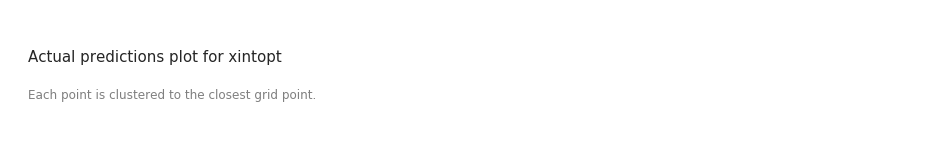

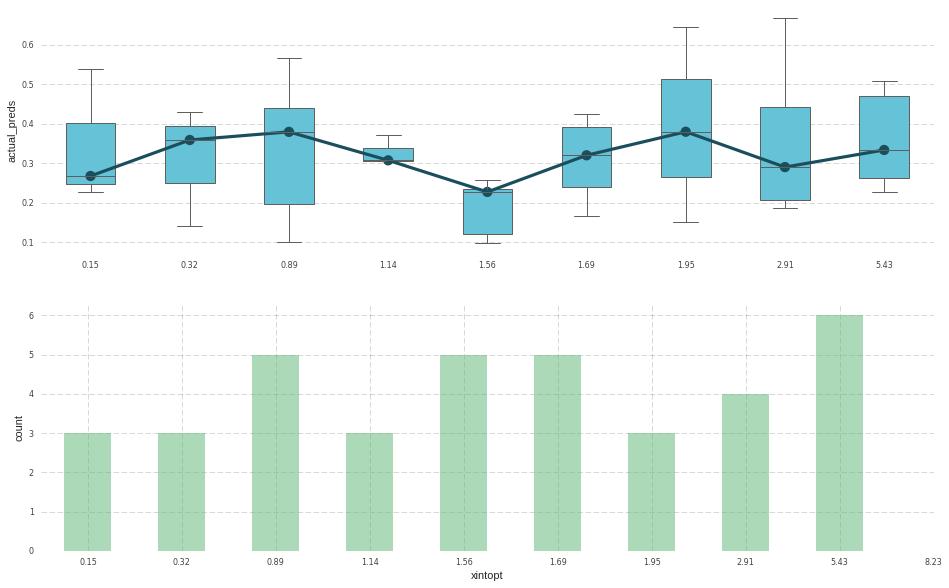

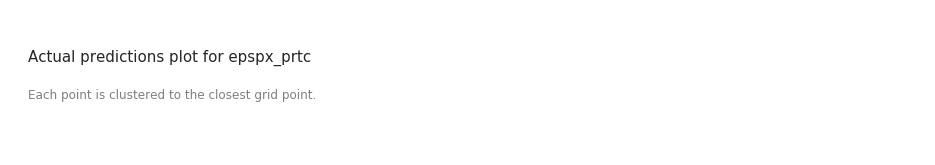

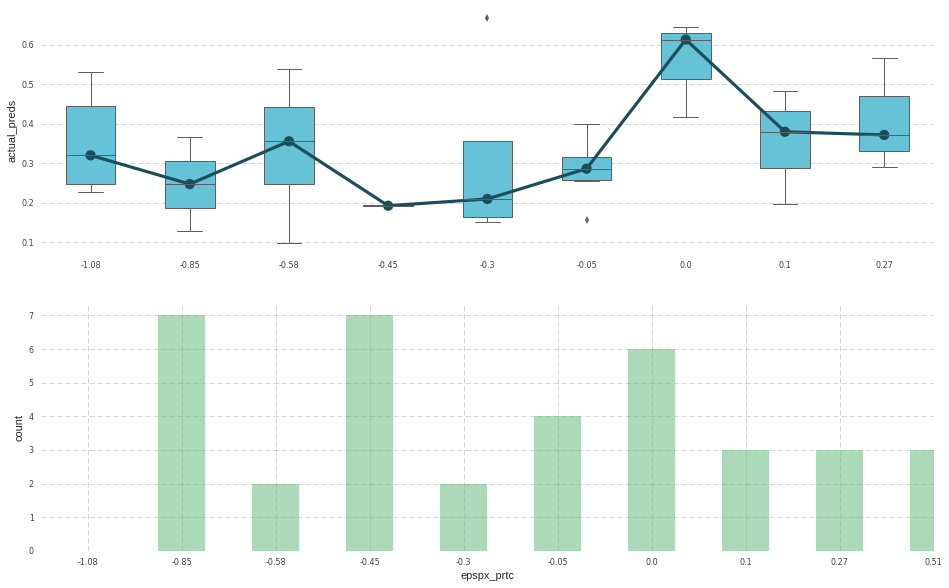

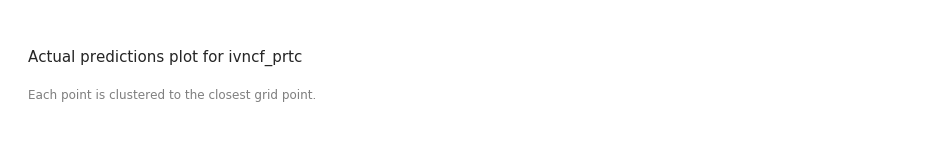

...

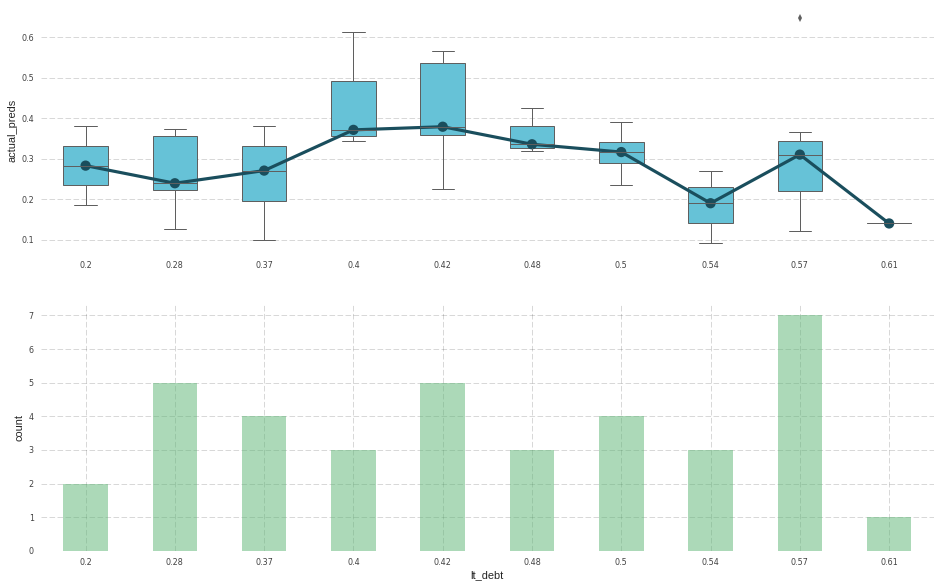

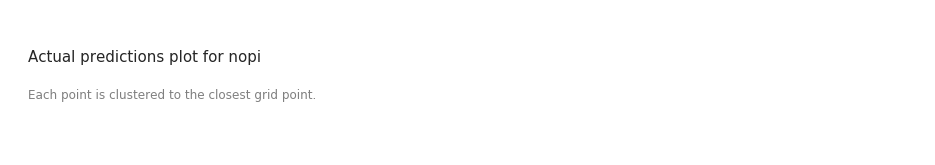

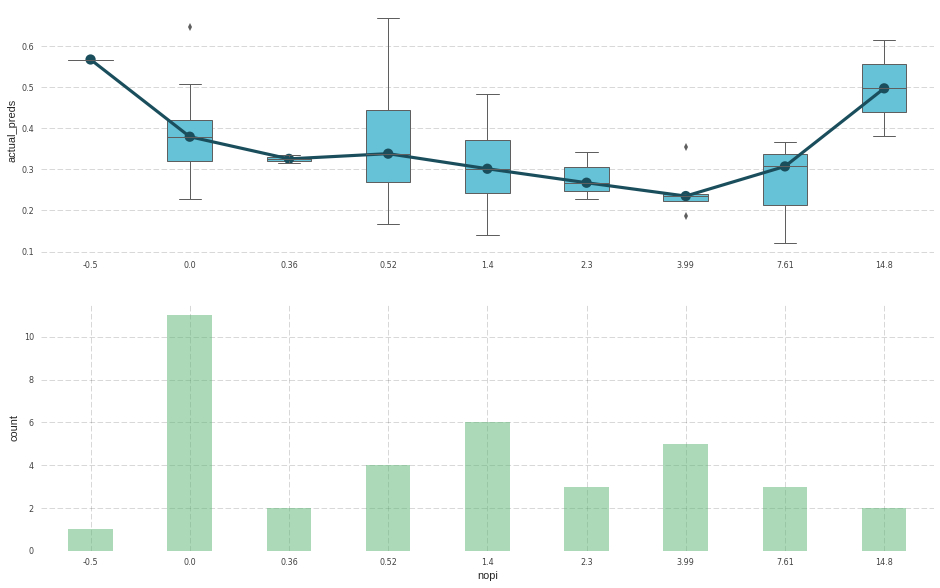

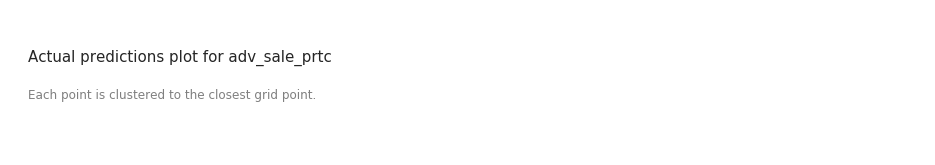

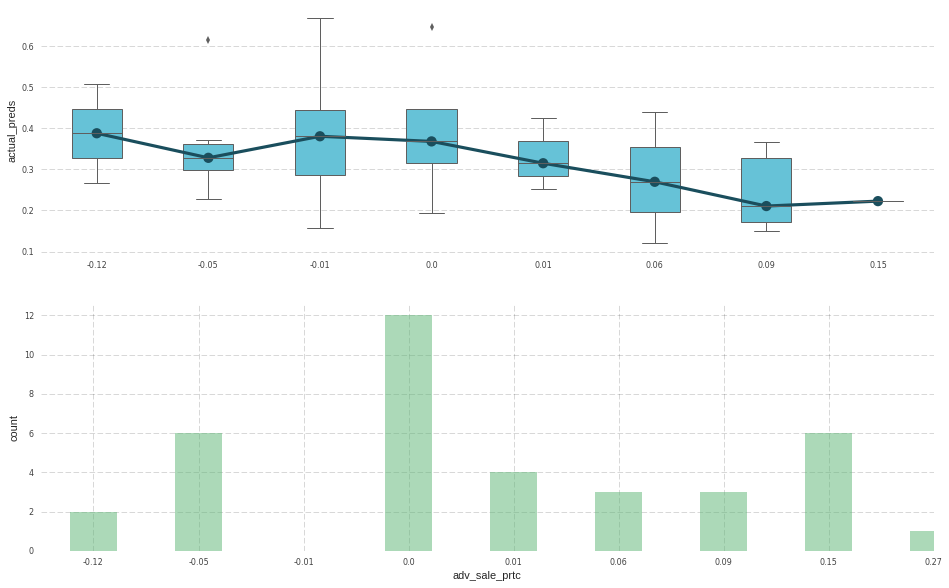

In [119]:
for i in ["Tort_Target"]:


    y = pred[i]

    X = pred.drop(["Target","public_date","Party","Survival","Duration_Target","Chapter_Target","363_Target","Tort_Target"],axis=1)

    #X = pred.drop(["Survival","public_date"],axis=1)
    X = X.drop(["sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik"],axis=1)


    #X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
    
    
    plos = pd.DataFrame()
    
    #for train_index, test_index in tscv.split(X):
    for train_index, test_index in kf.split(X, y):

        dit = dit +1
        
        
        X_train, X_test = X.ix[train_index,:], X.ix[test_index,:]
        Y_train, Y_test = y[train_index], y[test_index]

        y_train = list(Y_train.values)
        y_test = list(Y_test.values)


        #clf = LogisticRegression()

        clf = XGBClassifier()

        clf.set_params(**params[i])

        clf.fit(X_train, y_train)

        name = clf.__class__.__name__
        
        
        #names = ["che","npm","lct","at_turn","rect_turn","pay_turn","curr_debt","dpc","accrual","mib"]
        names = ["xintopt","epspx_prtc","ivncf_prtc","xint","ptpm_prtc","cash_debt","dltt_prtc","invch_prtc",
                 "lt_debt","nopi","adv_sale_prtc"]

        for i in names:

            pdp_ibc = pdp.pdp_isolate(clf, X_test, i,percentile_range=(20, 80))
            print(i)
            pdp.actual_plot(pdp_ibc, i)
            
        

        print("="*30)
        print(name)

        y_predict = clf.predict(X_test)
        y_predict_prob = clf.predict_proba(X_test)
        acc = accuracy_score(y_test, y_predict)
        print(acc)
        """

        if i=="Reg":
            print("")
        else:

            auc = roc_auc_score(y_test, y_predict_prob[:,1])
            print(auc)

        print(classification_report(y_test, y_predict))


        #print metrics.accuracy_score(y_test, y_predict)

        acc = accuracy_score(y_test, y_predict)
        print(acc)
        #auc = roc_auc_score(y_test, y_predict_prob[:,1])
        print(auc)

        #gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X.columns.values})

        #bm, nopiq, intanq, niq,adjex, piq, oibdpq
        #gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)
        
        print(classification_report(y_test, y_predict))
    

    

        print(classification_report(y_test, y_predict))

        # Connect These 
        """
        
        gb = eli5.explain_weights_df(clf, importance_type="gain")

        rat = pd.read_excel("ratio_tracker.xlsx")
        act = pd.read_excel("acc_tracker.xlsx")

        act = act[["Variable Name","Variable Description","Category"]]
        rat = rat[["Variable Name","Financial Ratio","Category"]]
        rat["Variable Description"] = rat["Financial Ratio"]
        rat.drop("Financial Ratio",axis=1, inplace=True)

        act["Type"] = "Fixed Value"
        rat["Type"] = "Ratio"

        ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
        ract["Period"] = "Fixed Period"

        #ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
        #ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
        #ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

        ract_pct = pd.DataFrame()
        ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
        ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
        ract_pct["Category"] = ract["Category"]
        ract_pct["Type"] = ract["Type"]
        ract_pct["Period"] = "% Change"
        
        """
        import xgbfir

        #xgb_rmodel = pickle.load(open("ganker.sav", 'rb'))

        # saving to file with proper feature names
        xgbfir.saveXgbFI(clf, feature_names=X.columns, OutputXlsxFile =  'inters_PCA' +i+'.xlsx')
        """

        blackt = pd.concat((ract,ract_pct),axis=0)


        gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")
        
        """
        features[reg] = gb
        classification[reg] = classification_report(y_test, y_predict)
        accuracy[reg] = acc
        auc_n[reg] = auc
        """
        """

        confusion_mat = confusion_matrix(y_test,y_predict)

        TN = confusion_mat[0][0]
        FP = confusion_mat[0][1]
        TP = confusion_mat[1][1]
        FN = confusion_mat[1][0]

        TPR = TP/(TP+FN)
        # Specificity or true negative rate
        TNR = TN/(TN+FP) 
        # Precision or positive predictive value
        PPV = TP/(TP+FP)
        # Negative predictive value
        NPV = TN/(TN+FN)
        # Fall out or false positive rate
        FPR = FP/(FP+TN)
        # False negative rate
        FNR = FN/(TP+FN)
        # False discovery rate
        FDR = FP/(TP+FP)

        ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
        print(ll)
        br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. 
        print(br) # very similar to false discovery rate. So your fine. 
        acc = accuracy_score(y_test, y_predict)
        print(acc)
        auc = roc_auc_score(y_test, y_predict_prob[:,1])
        print(auc)
        prc = average_precision_score(y_test, y_predict_prob[:,1]) 
        print(prc) # This is a useless measure

        print("Bankrupt")
        print(PPV)
        print(FPR)
        print(FDR)

        print("Healthy")
        print(NPV)
        print(FNR)


        #9604 - Three
        #9172 - One
        #Accuracy AUC and Errors an Confusion matrix with Percentages. 


        # Second Type

        data = np.array([np.arange(1)]*1).T

        df_exec = pd.DataFrame(data)

        df_exec["Type"] = i
        df_exec["Average Log Likelihood"] = ll
        df_exec["Brier Score Loss"] = br
        df_exec["Accuracy Score"] = acc
        df_exec["ROC AUC Sore"] = auc
        df_exec["Average Precision Score"] = prc
        df_exec["Precision - Bankrupt Firms"] = PPV
        df_exec["False Positive Rate (p-value)"] = FPR
        df_exec["Precision - Healthy Firms"] = NPV
        df_exec["False Negative Rate (recall error)"] = FNR
        df_exec["False Discovery Rate "] = FDR
        df_exec["All Observations"] = TN + TP + FN + FP

        df_exec["Bankruptcy Sample"] = TP + FN
        df_exec["Healthy Sample"] = TN + FP

        df_exec["Recalled Bankruptcy"] = TP + FP
        df_exec["Correct (True Positives)"] = TP
        df_exec["Incorrect (False Positives)"] = FP

        df_exec["Recalled Healthy"] = TN + FN
        df_exec["Correct (True Negatives)"] = TP
        df_exec["Incorrect (False Negatives)"] = FP

        plos = plos.append(df_exec)
        classification_p[i] = classification_report(y_test, y_predict)
        accuracy_p[i] = acc
        auc_n_p[i] = auc
        """

        features_p[i] = gb

    #woep = woep.append(plos)

    # 57 DT , 2 DT good , 3 No One 4DT      
    # "Duration_Target","Survival","Party","Chapter_Target"

In [192]:
woep.to_csv("alternative_metrics.csv")

In [16]:
f = {}
f["Duration_Target"] = ["che",
"npm",
"invt"]
f["Survival"] = ["lct",
"at_turn",
"ivaeq"]
f["Chapter_Target"] = ["rect_turn",
"pay_turn",
"lct"]
f["363_Target"] = ["curr_debt",
"dpc",
"lt_debt"]
f["Tort_Target"] = ["accrual",
"mib", "PEG_1yrforward_prtc"]



In [17]:
from pdpbox import pdp

{'363_Target': ['curr_debt', 'dpc', 'lt_debt'],
 'Chapter_Target': ['rect_turn', 'pay_turn', 'lct'],
 'Duration_Target': ['che', 'npm', 'invt'],
 'Survival': ['lct', 'at_turn', 'ivaeq'],
 'Tort_Target': ['accrual', 'mib', 'PEG_1yrforward_prtc']}

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.3,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2,
       min_child_weight=0, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=1337, silent=0, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.3,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2,
       min_child_weight=0, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=1337, silent=0, subsample=0.8)

Duration_Target
che
npm
invt


XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.3,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=1337, silent=0, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.3,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=1337, silent=0, subsample=0.8)

Survival
lct
at_turn
ivaeq


XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.9,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2,
       min_child_weight=1, missing=None, n_estimators=13, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=10, seed=1337, silent=1, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.9,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2,
       min_child_weight=1, missing=None, n_estimators=13, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=10, seed=1337, silent=1, subsample=0.8)

Chapter_Target
rect_turn
pay_turn
lct


XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
       gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=120, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=6, seed=1337, silent=1, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
       gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=120, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=6, seed=1337, silent=1, subsample=0.8)

363_Target
curr_debt
dpc
lt_debt


XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=10, seed=1337, silent=1, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=1,
       min_child_weight=1, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=10, seed=1337, silent=1, subsample=0.8)

Tort_Target
accrual
mib
PEG_1yrforward_prtc


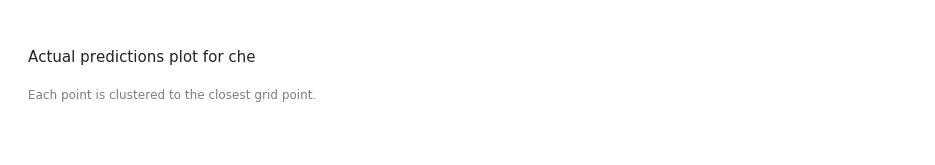

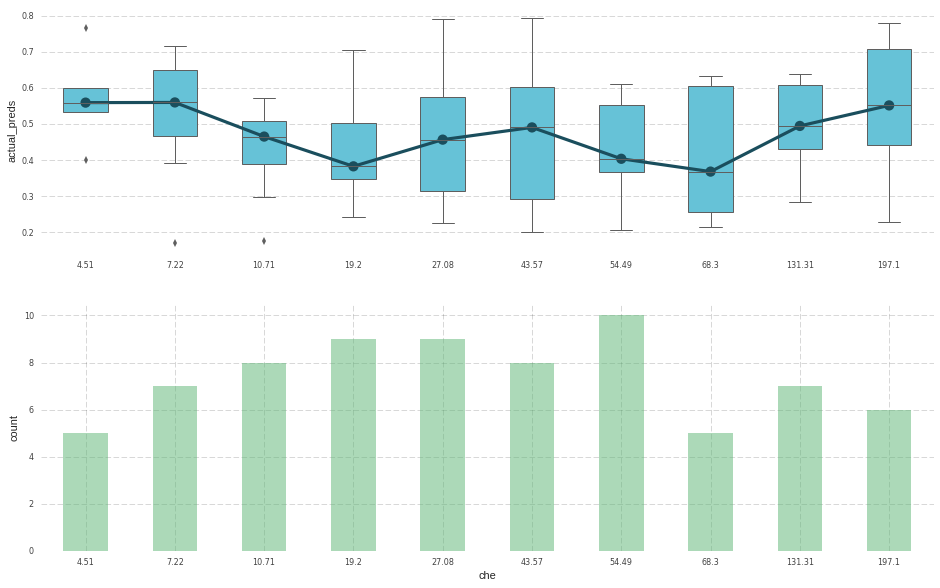

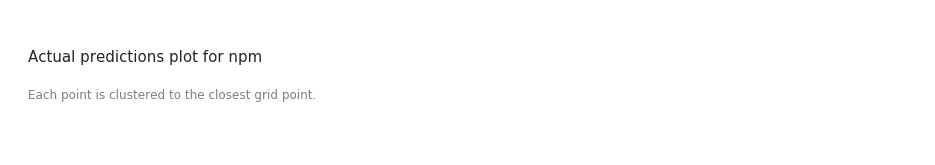

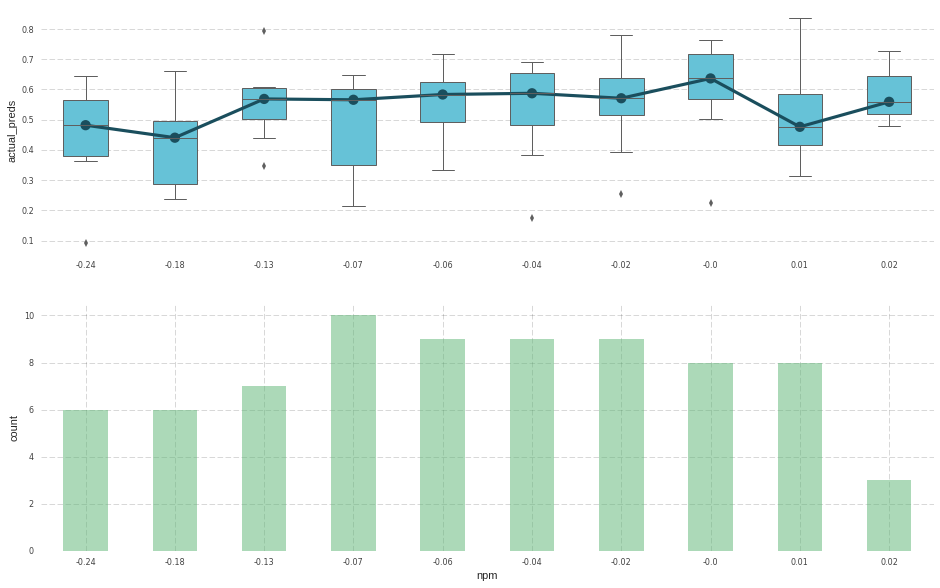

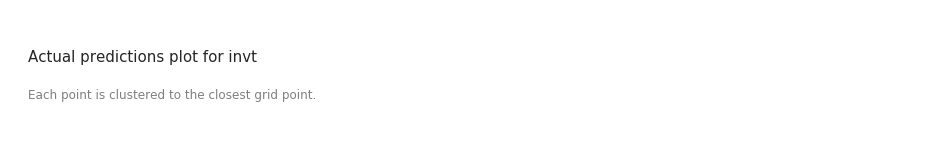

...

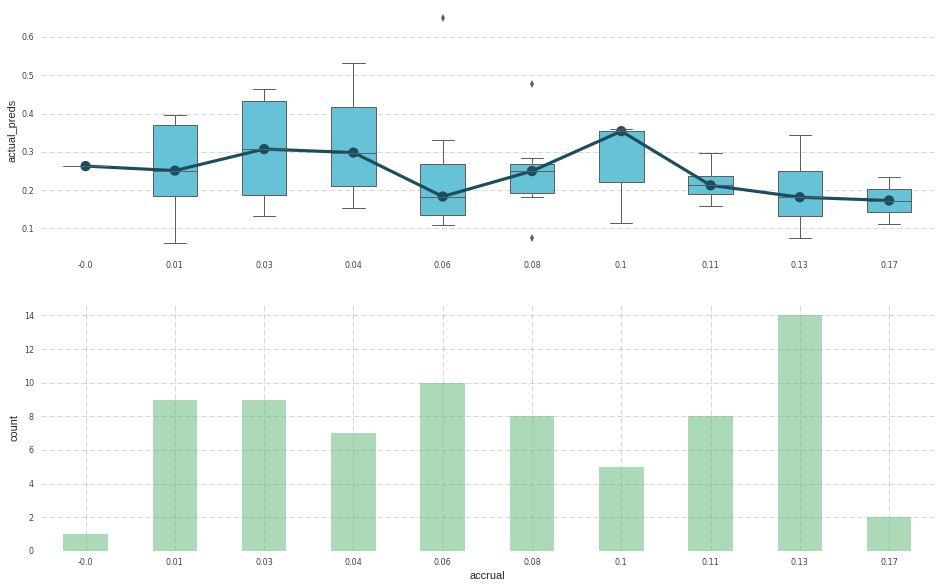

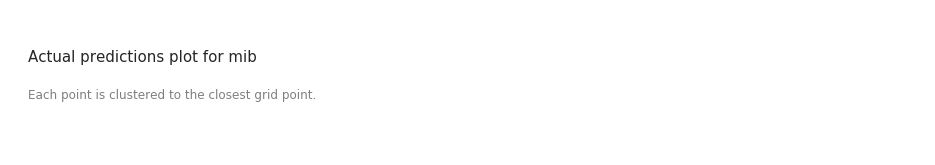

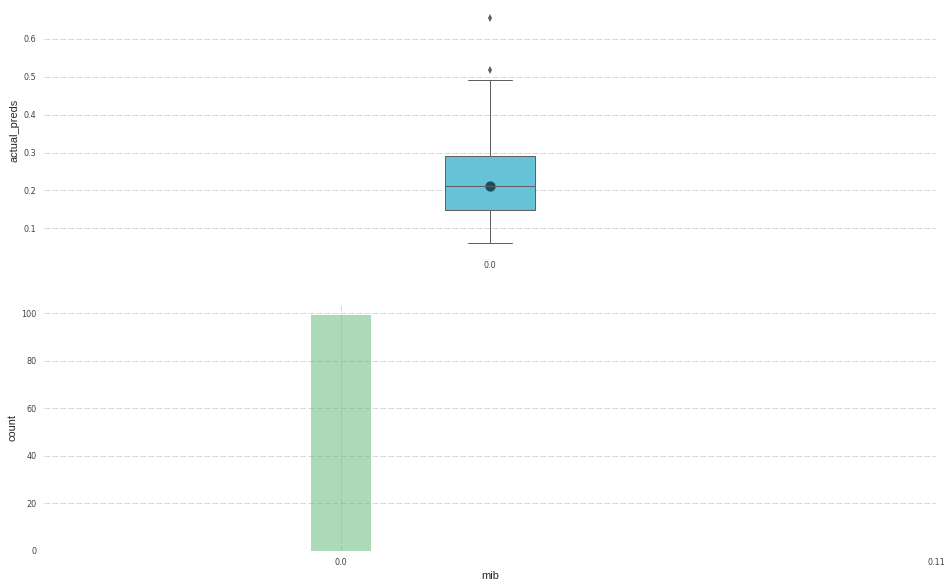

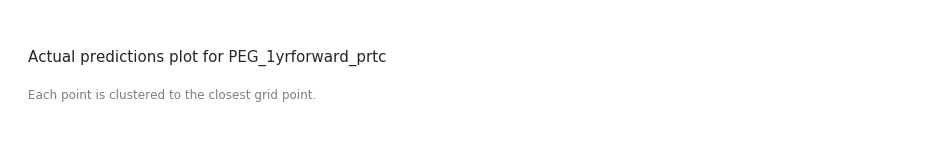

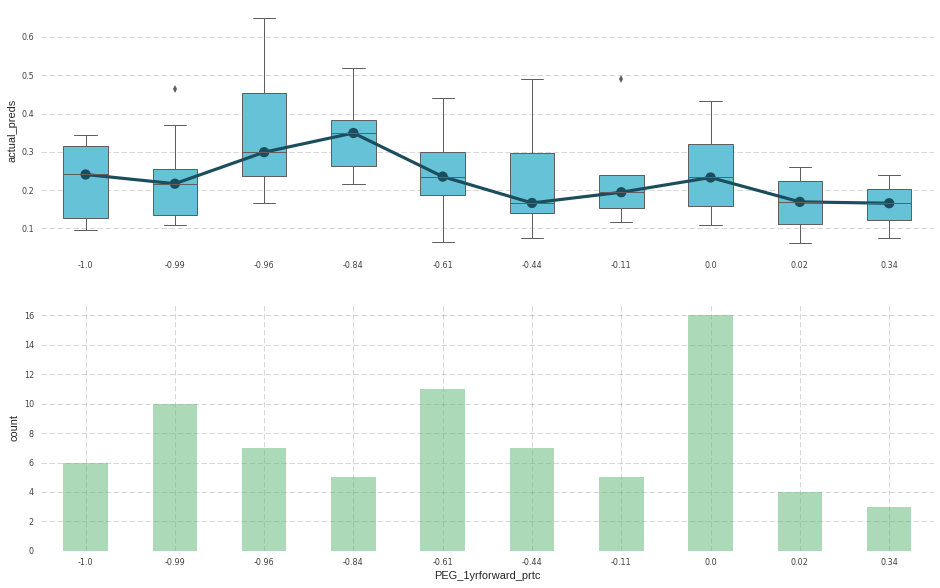

In [20]:
# Characteristic Prediction
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import *
from sklearn.metrics import accuracy_score, log_loss
from xgboost.sklearn import XGBClassifier
from pdpbox import pdp
%matplotlib inline

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


features_p = {}
classification_p = {}
accuracy_p = {}
auc_n_p = {}
pred = pred.fillna(0)

plos = pd.DataFrame()

f

for i in ["Duration_Target","Survival","Chapter_Target","363_Target","Tort_Target"]:
    
    
    y = pred[i]

    X = pred.drop(["Target","public_date","Party","Survival","Duration_Target","Chapter_Target","363_Target","Tort_Target"],axis=1)
    
    #X = pred.drop(["Survival","public_date"],axis=1)
    X = X.drop(["sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik"],axis=1)
    
                                                                                                      
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)

    y_train = list(y_train.values)
    y_test = list(y_test.values)
    

    #clf = LogisticRegression()

    clf = XGBClassifier()

    clf.set_params(**params[i])

    clf.fit(X_train, y_train)

    name = clf.__class__.__name__

    print("="*30)
    print(i)
    for s in f[i]:
    
        pdp_ibc = pdp.pdp_isolate(clf, X_test, s,percentile_range=(20, 80))
        print(s)
        pdp.actual_plot(pdp_ibc, s)



In [85]:
pred.head()

,Target,public_date,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Duration_Target,Chapter_Target,363_Target,Tort_Target,Survival,Party
0,1.0,1978-12-31,12.716,0.454,-0.042934,0.828609,0.279461,0.033,4.922988,125.973539,0.029,0.028,0.028,0.060,1.315781,-2.244319,12.152291,5.353037,2.007964e+07,0.000,1.597,188.873608,271.319223,1.284,0.264,5.841869,136.642000,0.039,0.040,0.071,111.309085,0.033,6.042631,1.014022e+06,224.239533,0.568,2.390000,0.953,0.488,0.196,0.418,2.240,0.264,6.791543,-1.310166,19790131.0,1.0,1.733377,2.185235,33.480988,0.346,47.301876,5.354005,0.0,5.257402,0.499,0.269311,1.688987,1.758631,0.735,0.23128,7.068,-0.493,-0.545420,11.771823,-0.701529,1978.0,1978.0,12.0,12.0,0.268,7.522143,7.522143,0.116,0.097,3.284209,2.489,3.432,3.751,-1.360906,64.491767,0.516000,-0.027740,4.638391,1.5833,0.677648,-7.299763,0.000000,15.036043,38.970081,1.176651,77.411204,0.376,1.759,0.153318,999990.000000,7.391709,0.41671,0.009,-4.016384,0.169,17.417806,22.480489,0.013,0.054,17.191152,21.866,9.221,30.738000,27.985000,370.202553,-305.961917,14.672103,52.078387,0.02400,0.032000,0.412,0.170321,0.27

In [97]:
pred["363_Target"].value_counts()

0    471
1    149
Name: 363_Target, dtype: int64

In [92]:
ds.head()

,Target,CAPEI,GProf,PEG_1yrforward,PEG_ltgforward,PEG_trailing,accrual,aco,act,adv_sale,aftret_eq,aftret_equity,aftret_invcapx,ao,aoloch,ap,apalch,apdedate,aqc,at_turn,at_x,at_y,bm,capital_ratio,capx,cash_conversion,cash_debt,cash_lt,cash_ratio,ceq,cfm,che,cik,cogs,curr_debt,curr_ratio,de_ratio,debt_assets,debt_at,debt_capital,debt_ebitda,debt_invcap,dlc,dlcch,dldte,dlrsn,dltis,dltr,dltt,dltt_be,dpact,dpc,dpr,dv,efftax,emol,epsfx,epspx,equity_invcap,esub,evm,fcf_ocf,fiao,fincf,fopo,fyear_x,fyear_y,fyr_x,fyr_y,gpm,ib,ibc,int_debt,int_totdebt,intan,intcov,intcov_ratio,inv_turn,invch,invt,invt_act,ivaco,ivaeq,ivao,ivch,ivncf,ivstch,lco,lct,lo,lt,lt_debt,lt_ppent,mib,naics,niadj,nopi,npm,oancf,ocf_lct,oiadp,oibdp,opmad,opmbd,optprcey,pay_turn,pcf,pe_exi,pe_inc,pe_op_basic,pe_op_dil,pi,ppent,pretret_earnat,pretret_noa,profit_lct,prstkc,ps,pstk,ptb,ptpm,quick_ratio,rd_sale,recch,rect,rect_act,rect_turn,roa,roce,roe,sale,sale_equity,sale_invcap,sale_nwc,seq,short_debt,sic,siv,spi,sppe,sppiv,sstk,staff_sale,stkco,totdebt_invcap,txach,txbcof,txdc,txditc,txp,txt,xidoc,xint,xintopt,xsga,CAPEI_prtc,GProf_prtc,PEG_1yrforward_prtc,PEG_ltgforward_prtc,PEG_trailing_prtc,accrual_prtc,aco_prtc,act_prtc,adv_sale_prtc,aftret_eq_prtc,aftret_equity_prtc,aftret_invcapx_prtc,ao_prtc,aoloch_prtc,ap_prtc,apalch_prtc,apdedate_prtc,aqc_prtc,at_turn_prtc,at_x_prtc,at_y_prtc,bm_prtc,capital_ratio_prtc,capx_prtc,cash_conversion_prtc,cash_debt_prtc,cash_lt_prtc,cash_ratio_prtc,ceq_prtc,cfm_prtc,che_prtc,cik_prtc,cogs_prtc,curr_debt_prtc,curr_ratio_prtc,de_ratio_prtc,debt_assets_prtc,debt_at_prtc,debt_capital_prtc,debt_ebitda_prtc,debt_invcap_prtc,dlc_prtc,dlcch_prtc,dldte_prtc,dlrsn_prtc,dltis_prtc,dltr_prtc,dltt_prtc,dltt_be_prtc,dpact_prtc,dpc_prtc,dpr_prtc,dv_prtc,efftax_prtc,emol_prtc,epsfx_prtc,epspx_prtc,equity_invcap_prtc,esub_prtc,evm_prtc,fcf_ocf_prtc,fiao_prtc,fincf_prtc,fopo_prtc,fyear_x_prtc,fyear_y_prtc,fyr_x_prtc,fyr_y_prtc,gpm_prtc,ib_prtc,ibc_prtc,int_debt_prtc,int_totdebt_prtc,intan_prtc,intcov_prtc,intcov_ratio_prtc,inv_turn_prtc,invch_prtc,invt_prtc,invt_act_prtc,ivaco_prtc,ivaeq_prtc,ivao_prtc,ivch_prtc,ivncf_prtc,ivstch_prtc,lco_prtc,lct_prtc,lo_prtc,lt_prtc,lt_debt_prtc,lt_ppent_prtc,mib_prtc,naics_prtc,niadj_prtc,nopi_prtc,npm_prtc,oancf_prtc,ocf_lct_prtc,oiadp_prtc,oibdp_prtc,opmad_prtc,opmbd_prtc,optprcey_prtc,pay_turn_prtc,pcf_prtc,pe_exi_prtc,pe_inc_prtc,pe_op_basic_prtc,pe_op_dil_prtc,pi_prtc,ppent_prtc,pretret_earnat_prtc,pretret_noa_prtc,profit_lct_prtc,prstkc_prtc,ps_prtc,pstk_prtc,ptb_prtc,ptpm_prtc,quick_ratio_prtc,rd_sale_prtc,recch_prtc,rect_prtc,rect_act_prtc,rect_turn_prtc,roa_prtc,roce_prtc,roe_prtc,sale_prtc,sale_equity_prtc,sale_invcap_prtc,sale_nwc_prtc,seq_prtc,short_debt_prtc,sic_prtc,siv_prtc,spi_prtc,sppe_prtc,sppiv_prtc,sstk_prtc,staff_sale_prtc,stkco_prtc,totdebt_invcap_prtc,txach_prtc,txbcof_prtc,txdc_prtc,txditc_prtc,txp_prtc,txt_prtc,xidoc_prtc,xint_prtc,xintopt_prtc,xsga_prtc,Duration_Target,Chapter_Target,363_Target,Survival,Party
Tort_Target,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.0,1.431980,0.211446,-0.123992,0.565858,0.649413,0.090512,54.833728,533.622170,0.014315,-0.404067,-0.822013,-0.065833,167.153318,30.100963,989.73992,-38.547339,2.009148e+07,23.680215,0.95875,3960.473186,3970.166536,1.904364,0.484797,122.292329,913.210662,0.029667,0.116753,0.476995,-23.525282,-0.985790,567.779563,736442.570092,1275.492171,0.422650,1.744016,3.435446,0.825742,0.470586,0.835217,-31.119387,0.727548,1146.960831,-2.322535,2.002349e+07,4.515836,685.153422,515.028425,1069.761771,3.634138,508.727304,113.826331,1.567318,13.140072,0.084652,0.282739,-5.465910,-5.544003,0.239775,-9.734747,-36.533699,-29.657025,-28.068174,134.014774,170.221307,2000.555516,

In [89]:
dar = ["che","npm","lct","at_turn","rect_turn","pay_turn","curr_debt","dpc","accrual","mib"]
vlad = pd.DataFrame()

for i in ["Duration_Target","Survival","Chapter_Target","363_Target","Tort_Target"]:
    

    ds = pred.groupby([i]).mean()
    vlad = vlad.append(ds)


In [91]:
vlad.to_csv("at_sum.csv")

In [ ]:
prd.head()

In [90]:
vlad

,363_Target,CAPEI,CAPEI_prtc,Chapter_Target,Duration_Target,GProf,GProf_prtc,PEG_1yrforward,PEG_1yrforward_prtc,PEG_ltgforward,PEG_ltgforward_prtc,PEG_trailing,PEG_trailing_prtc,Party,Survival,Target,Tort_Target,accrual,accrual_prtc,aco,aco_prtc,act,act_prtc,adv_sale,adv_sale_prtc,aftret_eq,aftret_eq_prtc,aftret_equity,aftret_equity_prtc,aftret_invcapx,aftret_invcapx_prtc,ao,ao_prtc,aoloch,aoloch_prtc,ap,ap_prtc,apalch,apalch_prtc,apdedate,apdedate_prtc,aqc,aqc_prtc,at_turn,at_turn_prtc,at_x,at_x_prtc,at_y,at_y_prtc,bm,bm_prtc,capital_ratio,capital_ratio_prtc,capx,capx_prtc,cash_conversion,cash_conversion_prtc,cash_debt,cash_debt_prtc,cash_lt,cash_lt_prtc,cash_ratio,cash_ratio_prtc,ceq,ceq_prtc,cfm,cfm_prtc,che,che_prtc,cik,cik_prtc,cogs,cogs_prtc,curr_debt,curr_debt_prtc,curr_ratio,curr_ratio_prtc,de_ratio,de_ratio_prtc,debt_assets,debt_assets_prtc,debt_at,debt_at_prtc,debt_capital,debt_capital_prtc,debt_ebitda,debt_ebitda_prtc,debt_invcap,debt_invcap_prtc,dlc,dlc_prtc,dlcch,dlcch_prtc,dldte,dldte_prtc,dlrsn,dlrsn_prtc,dltis,dltis_prtc,dltr,dltr_prtc,dltt,dltt_be,dltt_be_prtc,dltt_prtc,dpact,dpact_prtc,dpc,dpc_prtc,dpr,dpr_prtc,dv,dv_prtc,efftax,efftax_prtc,emol,emol_prtc,epsfx,epsfx_prtc,epspx,epspx_prtc,equity_invcap,equity_invcap_prtc,esub,esub_prtc,evm,evm_prtc,fcf_ocf,fcf_ocf_prtc,fiao,fiao_prtc,fincf,fincf_prtc,fopo,fopo_prtc,fyear_x,fyear_x_prtc,fyear_y,fyear_y_prtc,fyr_x,fyr_x_prtc,fyr_y,fyr_y_prtc,gpm,gpm_prtc,ib,ib_prtc,ibc,ibc_prtc,int_debt,int_debt_prtc,int_totdebt,int_totdebt_prtc,intan,intan_prtc,intcov,intcov_prtc,intcov_ratio,intcov_ratio_prtc,inv_turn,inv_turn_prtc,invch,invch_prtc,invt,invt_act,invt_act_prtc,invt_prtc,ivaco,ivaco_prtc,ivaeq,ivaeq_prtc,ivao,ivao_prtc,ivch,ivch_prtc,ivncf,ivncf_prtc,ivstch,ivstch_prtc,lco,lco_prtc,lct,lct_prtc,lo,lo_prtc,lt,lt_debt,lt_debt_prtc,lt_ppent,lt_ppent_prtc,lt_prtc,mib,mib_prtc,naics,naics_prtc,niadj,niadj_prtc,nopi,nopi_prtc,npm,npm_prtc,oancf,oancf_prtc,ocf_lct,ocf_lct_prtc,oiadp,oiadp_prtc,oibdp,oibdp_prtc,opmad,opmad_prtc,opmbd,opmbd_prtc,optprcey,optprcey_prtc,pay_turn,pay_turn_prtc,pcf,pcf_prtc,pe_exi,pe_exi_prtc,pe_inc,pe_inc_prtc,pe_op_basic,pe_op_basic_prtc,pe_op_dil,pe_op_dil_prtc,pi,pi_prtc,ppent,ppent_prtc,pretret_earnat,pretret_earnat_prtc,pretret_noa,pretret_noa_prtc,profit_lct,profit_lct_prtc,prstkc,prstkc_prtc,ps,ps_prtc,pstk,pstk_prtc,ptb,ptb_prtc,ptpm,ptpm_prtc,quick_ratio,quick_ratio_prtc,rd_sale,rd_sale_prtc,recch,recch_prtc,rect,rect_act,rect_act_prtc,rect_prtc,rect_turn,rect_turn_prtc,roa,roa_prtc,roce,roce_prtc,roe,roe_prtc,sale,sale_equity,sale_equity_prtc,sale_invcap,sale_invcap_prtc,sale_nwc,sale_nwc_prtc,sale_prtc,seq,seq_prtc,short_debt,short_debt_prtc,sic,sic_prtc,siv,siv_prtc,spi,spi_prtc,sppe,sppe_prtc,sppiv,sppiv_prtc,sstk,sstk_prtc,staff_sale,staff_sale_prtc,stkco,stkco_prtc,totdebt_invcap,totdebt_invcap_prtc,txach,txach_prtc,txbcof,txbcof_prtc,txdc,txdc_prtc,txditc,txditc_prtc,txp,txp_prtc,txt,txt_prtc,xidoc,xidoc_prtc,xint,xint_prtc,xintopt,xintopt_prtc,xsga,xsga_prtc
0,0.211806,2.839477,-0.530902,0.055556,NaN,0.212739,-0.539512,-0.112129,0.673057,0.475556,-0.816128,0.392623,1.550522,0.034722,0.635417,1.0,0.038194,0.120161,1.629913,32.952645,0.287405,400.304983,-0.026562,0.014220,0.191811,-0.360002,-4.330519,-1.230426,-5.732061,-0.077645,-1.404281,89.292365,-0.497422,-12.328219,-22.174591,341.312770,0.867507,0.674969,103.231185,2.009546e+07,0.000204,16.330285,2.366741,0.894030,0.072944,1798.085597,-0.066957,1815.199882,-0.056849,2.107332,1.437696,0.616415,1.214216,93.249689,-0.015362,1343.387717,2.071955,0.046478,-0.099255,0.134118,0.290464,0.526039,0.171957,73.397504,-1.101792,-0.237757,0.081020,163.697697,0.872768,838609.699105,0.005286,825.382328,0.339029,0.419385,0.131420,1.687603,-0.087101,2.901300,-0.209980,0.829174,0.135080,0.491971,0.401431,0.805336,0.195349,-47.842293,-8.174544,0.731353,1.088721,350.123793,1709.948336,-23.954739,3.548876,2.002814e+07,1.452795e-04,4.408042,1.336346e-02,432.576856,6.227764,376.279815,2.942682

In [59]:
# Characteristic Prediction

from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import *
from sklearn.metrics import accuracy_score, log_loss
import eli5


features_p = {}
classification_p = {}
accuracy_p = {}
auc_n_p = {}
pred = pred.fillna(0)

plos = pd.DataFrame()

f

for i in ["Duration_Target","Survival","Chapter_Target","363_Target","Tort_Target"]:
    
    
    y = pred[i]

    X = pred.drop(["Target","public_date","Party","Survival","Duration_Target","Chapter_Target","363_Target","Tort_Target"],axis=1)
    
    #X = pred.drop(["Survival","public_date"],axis=1)
    X = X.drop(["sic_prtc","naics_prtc","fyear_x_prtc","fyear_y_prtc","dlrsn","fyear_x","dldte","fyear_y","apdedate","at_y","fyr_x","fyr_y"],axis=1)
    X = X.drop(["dlrsn_prtc","dldte_prtc","cik_prtc","apdedate_prtc","at_y_prtc","fyr_x_prtc","fyr_y_prtc","cik"],axis=1)
    
                                                                                                      
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)

    y_train = list(y_train.values)
    y_test = list(y_test.values)
    

    #clf = LogisticRegression()

    clf = XGBClassifier()

    clf.set_params(**params[i])

    clf.fit(X_train, y_train)

    name = clf.__class__.__name__

    print("="*30)
    print(name)

    y_predict = clf.predict(X_test)
    y_predict_prob = clf.predict_proba(X_test)
    acc = accuracy_score(y_test, y_predict)
    print(acc)
    
    if i=="Reg":
        print("")
    else:
        
        auc = roc_auc_score(y_test, y_predict_prob[:,1])
        print(auc)

    print(classification_report(y_test, y_predict))
    

    #print metrics.accuracy_score(y_test, y_predict)

    acc = accuracy_score(y_test, y_predict)
    print(acc)
    #auc = roc_auc_score(y_test, y_predict_prob[:,1])
    print(auc)

    gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X.columns.values})

    #bm, nopiq, intanq, niq,adjex, piq, oibdpq
    gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)

    print(classification_report(y_test, y_predict))

    # Connect These 

    rat = pd.read_excel("ratio_tracker.xlsx")
    act = pd.read_excel("acc_tracker.xlsx")

    act = act[["Variable Name","Variable Description","Category"]]
    rat = rat[["Variable Name","Financial Ratio","Category"]]
    rat["Variable Description"] = rat["Financial Ratio"]
    rat.drop("Financial Ratio",axis=1, inplace=True)

    act["Type"] = "Fixed Value"
    rat["Type"] = "Ratio"

    ract = pd.concat((act,rat),axis=0).reset_index(drop=True)
    ract["Period"] = "Fixed Period"

    #ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
    #ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]
    #ract.loc[ract.shape[0]+1] = ["xintopt","Implied Option Expense"]

    ract_pct = pd.DataFrame()
    ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
    ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "% Change in "+x)
    ract_pct["Category"] = ract["Category"]
    ract_pct["Type"] = ract["Type"]
    ract_pct["Period"] = "% Change"

    blackt = pd.concat((ract,ract_pct),axis=0)


    gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")
    
    """
    features[reg] = gb
    classification[reg] = classification_report(y_test, y_predict)
    accuracy[reg] = acc
    auc_n[reg] = auc
    
    """

    confusion_mat = confusion_matrix(y_test,y_predict)

    TN = confusion_mat[0][0]
    FP = confusion_mat[0][1]
    TP = confusion_mat[1][1]
    FN = confusion_mat[1][0]

    TPR = TP/(TP+FN)
    # Specificity or true negative rate
    TNR = TN/(TN+FP) 
    # Precision or positive predictive value
    PPV = TP/(TP+FP)
    # Negative predictive value
    NPV = TN/(TN+FN)
    # Fall out or false positive rate
    FPR = FP/(FP+TN)
    # False negative rate
    FNR = FN/(TP+FN)
    # False discovery rate
    FDR = FP/(TP+FP)

    ll = log_loss(y_test, y_predict_prob) # Its low but means nothing to me. 
    print(ll)
    br = brier_score_loss(y_test, y_predict_prob[:,1]) # Its low but means nothing to me. 
    print(br) # very similar to false discovery rate. So your fine. 
    acc = accuracy_score(y_test, y_predict)
    print(acc)
    auc = roc_auc_score(y_test, y_predict_prob[:,1])
    print(auc)
    prc = average_precision_score(y_test, y_predict_prob[:,1]) 
    print(prc) # This is a useless measure

    print("Bankrupt")
    print(PPV)
    print(FPR)
    print(FDR)

    print("Healthy")
    print(NPV)
    print(FNR)


    #9604 - Three
    #9172 - One
    #Accuracy AUC and Errors an Confusion matrix with Percentages. 


    # Second Type

    data = np.array([np.arange(1)]*1).T

    df_exec = pd.DataFrame(data)

    df_exec["Type"] = i
    df_exec["Average Log Likelihood"] = ll
    df_exec["Brier Score Loss"] = br
    df_exec["Accuracy Score"] = acc
    df_exec["ROC AUC Sore"] = auc
    df_exec["Average Precision Score"] = prc
    df_exec["Precision - Bankrupt Firms"] = PPV
    df_exec["False Positive Rate (p-value)"] = FPR
    df_exec["Precision - Healthy Firms"] = NPV
    df_exec["False Negative Rate (recall error)"] = FNR
    df_exec["False Discovery Rate "] = FDR
    df_exec["All Observations"] = TN + TP + FN + FP

    df_exec["Bankruptcy Sample"] = TP + FN
    df_exec["Healthy Sample"] = TN + FP

    df_exec["Recalled Bankruptcy"] = TP + FP
    df_exec["Correct (True Positives)"] = TP
    df_exec["Incorrect (False Positives)"] = FP

    df_exec["Recalled Healthy"] = TN + FN
    df_exec["Correct (True Negatives)"] = TP
    df_exec["Incorrect (False Negatives)"] = FP

    
    plos = plos.append(df_exec)

    features_p[i] = gb
    classification_p[i] = classification_report(y_test, y_predict)
    accuracy_p[i] = acc
    auc_n_p[i] = auc
    

# 57 DT , 2 DT good , 3 No One 4DT      
# "Duration_Target","Survival","Party","Chapter_Target"

    

{'363_Target': ['curr_debt', 'dpc', 'lt_debt'],
 'Chapter_Target': ['rect_turn', 'pay_turn', 'lct'],
 'Duration_Target': ['che', 'npm', 'invt'],
 'Survival': ['lct', 'at_turn', 'ivaeq'],
 'Tort_Target': ['accrual', 'mib', 'PEG_1yrforward_prtc']}

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.3,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2,
       min_child_weight=0, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=1337, silent=0, subsample=0.8)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.3,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=2,
       min_child_weight=0, missing=None, n_estimators=70, nthread=1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=1337, silent=0, subsample=0.8)

XGBClassifier
0.564516129032


NameError: name 'roc_auc_score' is not defined

In [39]:
for i in ["Duration_Target","Survival","Chapter_Target","363_Target","Tort_Target"]:
    features_p[i].to_csv('Featu_' + i +"_.csv")
    features_p[i]["Category"] = features_p[i]["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
    cat = features_p[i].groupby(["Category"]).sum().reset_index()
    cat = cat.sort_values("weight", ascending=False)
    cat.to_csv('Cat_' + i +"_.csv")
    

KeyError: 'Duration_Target'

In [66]:
# Here you get the information for the map. 

fes = pd.DataFrame()
fes["Category"] = ['Asset', 'Solvency', 'Profitability',
       'Expense', 'Efficiency', 'Equity', 'Income', 'Liquidity', 'Other',
       'Cash Flow']

for i in ["Duration_Target","Survival","Chapter_Target","363_Target","Tort_Target"]:
    gb = features_p[i]
    gb["Category"] = gb["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Asset" if x=="Liability" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Profitability" if x=="Valuation" else x)
    cat = gb.groupby(["Category"]).sum().reset_index()
    cat = cat.sort_values("weight", ascending=False)
    cat[i] = cat["weight"]
    cat = cat.drop("weight",axis=1)
    fes = pd.merge(fes, cat, on="Category", how="left")


res = fes.set_index(fes["Category"], drop=True).drop("Category",axis=1).T

for col in res.columns:
    res[col] = res[col]/res[col].max()


koes =res.T
koes = koes.iloc[::-1]

koes.columns = ['Duration', 'Survival', 'Chapter', 'Asset Sale','Tort']

import plotly.plotly as py
import plotly.graph_objs as go

trace = go.Heatmap(z=koes.values,
                   x=koes.columns,
                   y=koes.index)
data=[trace]
py.iplot(data, filename='labelled-heatmap')

In [67]:
des

Category,Asset,Solvency,Income,Profitability,Equity,Expense,Efficiency,Other,Liquidity,Cash Flow
Duration_Target,0.381218,0.126976,0.027494,0.199824,0.079900,0.038933,0.042533,0.015748,0.031757,0.014641
Survival,0.320462,0.139906,0.133335,0.099190,0.041865,0.072213,0.121599,0.000000,0.043589,0.000000
Chapter_Target,0.122349,0.232883,0.028854,0.042166,0.055689,0.000000,0.518059,0.000000,0.000000,0.000000
363_Target,0.314598,0.176691,0.086666,0.201573,0.053102,0.046869,0.046617,0.017758,0.025452,0.009059
Tort_Target,0.152320,0.261936,0.035878,0.156675,0.051542,0.046595,0.118849,0.060387,0.015294,0.048527


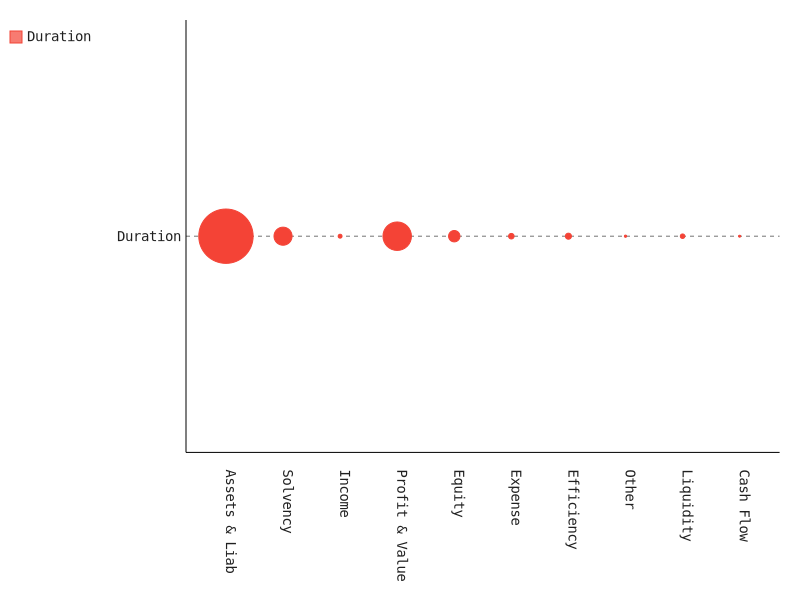

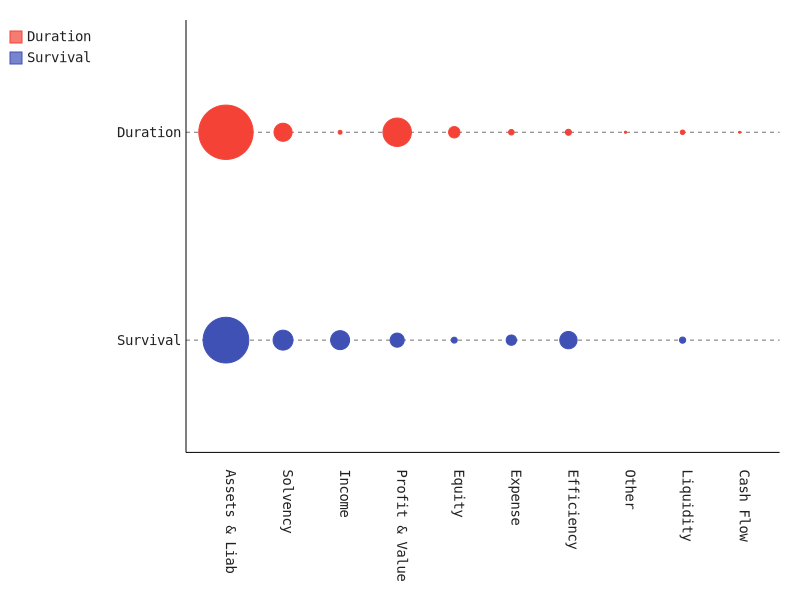

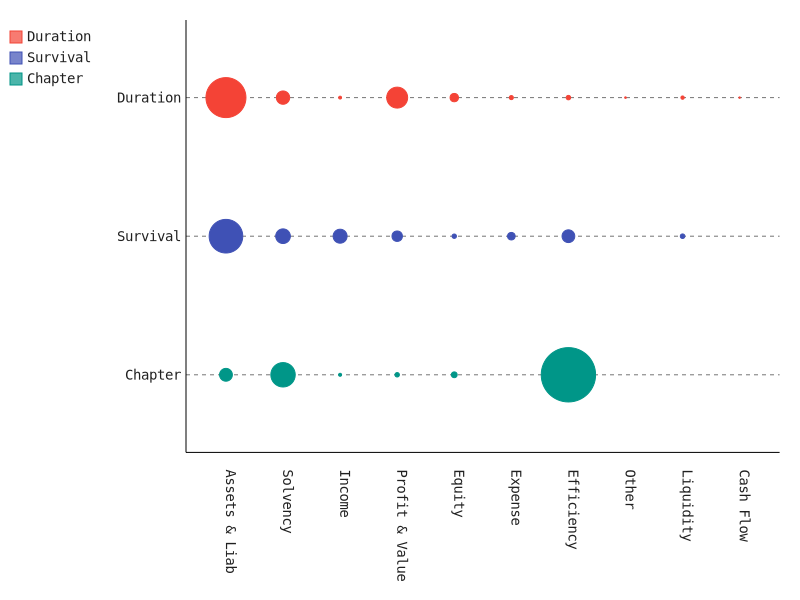

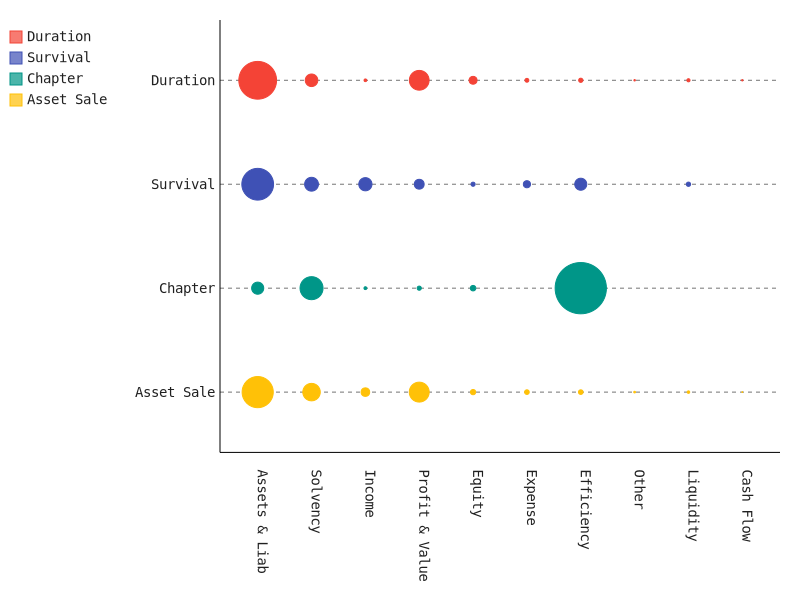

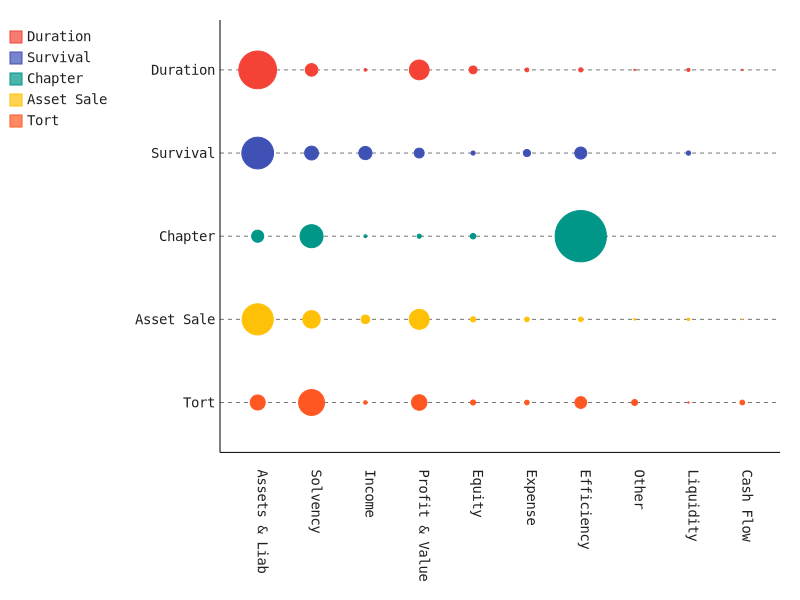

b'<?xml version=\'1.0\' encoding=\'utf-8\'?>\n<svg xmlns:xlink="http://www.w3.org/1999/xlink" xmlns="http://www.w3.org/2000/svg" id="chart-23a9b39e-1655-44eb-ad01-5ff782c9425e" class="pygal-chart" viewBox="0 0 800 600"><!--Generated with pygal 2.1.1 (lxml) \xc2\xa9Kozea 2011-2015 on 2017-10-21--><!--http://pygal.org--><!--http://github.com/Kozea/pygal--><defs><style type="text/css">#chart-23a9b39e-1655-44eb-ad01-5ff782c9425e{-webkit-user-select:none;-webkit-font-smoothing:antialiased;font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace}#chart-23a9b39e-1655-44eb-ad01-5ff782c9425e .title{font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace;font-size:16px}#chart-23a9b39e-1655-44eb-ad01-5ff782c9425e .legends .legend text{font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace;font-size:14px}#chart-23a9b39e-1655-44eb-ad01-5ff782c9425e .axis text{font-family:Consolas,"Liberation Mono",Menlo,Courier,monospace;font-size:14px}#chart-23a9b39e-1655-44eb-ad01-5ff782c9425

file:///tmp/tmpwl4chtak.html


In [65]:
top = pd.DataFrame()
top["Category"] = ["Asset","Solvency","Income",
                   "Profitability","Equity","Expense","Efficiency","Other","Liquidity","Cash Flow"]





for i in ["Duration_Target","Survival","Chapter_Target","363_Target","Tort_Target"]:
    gb = features_p[i]
    gb["Category"] = gb["Category"].apply(lambda x: "Liability" if x=="Debt" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Asset" if x=="Liability" else x)
    gb["Category"] = gb["Category"].apply(lambda x: "Profitability" if x=="Valuation" else x)
    cat = gb.groupby(["Category"]).sum().reset_index()
    cat = cat.sort_values("weight", ascending=False)
    cat[i] = cat["weight"]
    cat = cat.drop("weight",axis=1)
    top = pd.merge(top, cat, on="Category", how="left")
    
des = top.set_index(top["Category"], drop=True).drop("Category",axis=1).T

kes = des.copy()


kes =kes.T


import pygal
%matplotlib inline
from IPython.display import SVG, HTML
from pygal.style import Style

custom_style = Style(
  background='transparent',
  plot_background='transparent',
    label_font_size=14)

html_pygal = """
<!DOCTYPE html>
<html>
  <head>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/svg.jquery.js"></script>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/pygal-tooltips.js"></script>
    <!-- ... -->
  </head>
  <body>
    <figure>
      {pygal_render}
    </figure>
  </body>
</html>
"""
kes.columns = ['Duration', 'Survival', 'Chapter', 'Asset Sale','Tort']

dot_chart = pygal.Dot(x_label_rotation=90, style=custom_style)
#dot_chart.title = 'V8 benchmark results'
dot_chart.x_labels = ["Assets & Liab","Solvency","Income",
                   "Profit & Value","Equity","Expense","Efficiency","Other","Liquidity","Cash Flow"]
dot_chart.add('Duration', kes["Duration"].values)
dot_chart.add('Survival', kes["Survival"].values)
dot_chart.add('Chapter', kes["Chapter"].values)
dot_chart.add('Asset Sale', kes["Asset Sale"].values)
dot_chart.add('Tort', kes["Tort"].values)


dot_chart.render()

dot_chart.render_to_file('chart.svg')
dot_chart.render_in_browser()
HTML(html_pygal.format(pygal_render=dot_chart.render()))

In [497]:
# Characteristic Prediction

from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import *


features_p = {}
classification_p = {}
accuracy_p = {}
auc_n_p = {}
pred = pred.fillna(0)

#"Duration_Target","Chapter_Target","363_Target","Tort_Target"

i = "Party"


y = pred[i]

X = pred.drop(["Party","Target","Survival","public_date","Duration_Target","Chapter_Target","363_Target","Tort_Target"],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.5)

y_train = list(y_train.values)
y_test = list(y_test.values)

xgb_model = xgb.XGBClassifier()

#brute force scan for all parameters, here are the tricks
#usually max_depth is 6,7,8
#learning rate is around 0.05, but small changes may make big diff
#tuning min_child_weight subsample colsample_bytree can have 
#much fun of fighting against overfit 
#n_estimators is how many round of boosting
#finally, ensemble xgboost with multiple seeds may reduce variance

parameters = {'nthread':[1], #when use hyperthread, xgboost may become slower
              'objective':['binary:logistic'],
              'learning_rate': [0.05,0.1], #so called `eta` value
              'max_depth': [1,2,3],
              'scale_pos_weight':[6,10,20],
              'min_child_weight': [0,1],
              'silent': [0,1],
              'subsample': [0.7,0.8],
              'colsample_bytree': [0.5,0.95],
              'n_estimators': [4,70], #number of trees, change it to 1000 for better results
              'seed': [1337]}


clf = GridSearchCV(xgb_model, parameters, n_jobs=5, 
               cv=StratifiedKFold(y_train, n_folds=5, shuffle=True), 
               scoring='roc_auc',
               verbose=2, refit=True)


clf.fit(X_train, y_train)


best_parameters, score, _ = max(clf.grid_scores_, key=lambda x: x[1])
print('Raw AUC score:', score)
for param_name in sorted(best_parameters.keys()):
    print("%s: %r" % (param_name, best_parameters[param_name]))

test_probs = clf.predict_proba(X_test)[:,1]



y_predict = clf.predict(X_test)
y_predict_prob = clf.predict_proba(X_test)
#print metrics.accuracy_score(y_test, y_predict)
acc = accuracy_score(y_test, y_predict)
print(acc)

auc = roc_auc_score(y_test, y_predict)
print(auc)



Fitting 5 folds for each of 576 candidates, totalling 2880 fits
[CV] nthread=1, min_child_weight=0, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=4 
[CV] nthread=1, min_child_weight=0, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=4 
[CV] nthread=1, min_child_weight=0, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=4 
[CV] nthread=1, min_child_weight=0, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=4 
[CV]  nthread=1, min_child_weight=0, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n

[Parallel(n_jobs=5)]: Done 102 tasks      | elapsed:    1.3s


[CV]  nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=20, seed=1337, subsample=0.7, n_estimators=4 -   0.0s
[CV] nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=1, scale_pos_weight=20, seed=1337, subsample=0.7, n_estimators=4 
[CV] nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=1, scale_pos_weight=20, seed=1337, subsample=0.8, n_estimators=4 
[CV]  nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=1, scale_pos_weight=20, seed=1337, subsample=0.7, n_estimators=4 -   0.0s
[CV]  nthread=1, min_child_weight=0, colsample_bytree=0.5, learning_rate=0.05, max_depth=1, objective=binary:logistic, silent=1, scale_pos_weight=20, seed=1337, subsample=0.8, n_estimators=70 -   0.1s
[CV] nthread=1, m

[Parallel(n_jobs=5)]: Done 1110 tasks      | elapsed:   15.8s


[CV]  nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.1, max_depth=2, objective=binary:logistic, silent=1, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 -   0.1s
[CV] nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.1, max_depth=2, objective=binary:logistic, silent=1, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 
[CV]  nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.1, max_depth=2, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 -   0.1s
[CV] nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.1, max_depth=2, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 
[CV]  nthread=1, min_child_weight=1, colsample_bytree=0.5, learning_rate=0.1, max_depth=2, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.8, n_estimators=70 -   0.1s
[CV] nthread=1, min_chi

[Parallel(n_jobs=5)]: Done 2205 tasks      | elapsed:   38.8s


[CV]  nthread=1, min_child_weight=0, colsample_bytree=0.95, learning_rate=0.1, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.8, n_estimators=70 -   0.1s
[CV]  nthread=1, min_child_weight=0, colsample_bytree=0.95, learning_rate=0.1, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 -   0.1s
[CV] nthread=1, min_child_weight=0, colsample_bytree=0.95, learning_rate=0.1, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.8, n_estimators=70 
[CV] nthread=1, min_child_weight=0, colsample_bytree=0.95, learning_rate=0.1, max_depth=1, objective=binary:logistic, silent=0, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 
[CV]  nthread=1, min_child_weight=0, colsample_bytree=0.95, learning_rate=0.1, max_depth=1, objective=binary:logistic, silent=1, scale_pos_weight=6, seed=1337, subsample=0.7, n_estimators=70 -   0.1s
[CV] nthread=1, mi

[Parallel(n_jobs=5)]: Done 2871 out of 2880 | elapsed:   54.8s remaining:    0.2s
[Parallel(n_jobs=5)]: Done 2880 out of 2880 | elapsed:   54.9s finished


Raw AUC score: 0.6344632768361581
colsample_bytree: 0.5
learning_rate: 0.05
max_depth: 1
min_child_weight: 0
n_estimators: 4
nthread: 1
objective: 'binary:logistic'
scale_pos_weight: 6
seed: 1337
silent: 0
subsample: 0.7
0.948387096774
0.496621621622


In [653]:
    gb = pd.DataFrame({'score':clf.feature_importances_, 'feature':X.columns.values})
    #bm, nopiq, intanq, niq,adjex, piq, oibdpq
    gb = gb.sort_values("score",ascending=False).head(1000).reset_index(drop=True)
    print(classification_report(y_test, y_predict))
    

    # Connect These 

    rat = pd.read_excel("ratio_tracker.xlsx")
    act = pd.read_csv("acc_tracker.csv")

    act = act[["Variable Name","Variable Description"]]
    rat = rat[["Variable Name","Financial Ratio"]]
    rat["Variable Description"] = rat["Financial Ratio"]
    rat.drop("Financial Ratio",axis=1, inplace=True)

    ract = pd.concat((act,rat),axis=0).reset_index(drop=True)

    ract.loc[ract.shape[0]+1] = ["optprcey","Options Outstanding End of Year - Price"]
    ract.loc[ract.shape[0]+1] = ["stkco","Stock Compensation Expense"]

    ract_pct = pd.DataFrame()
    ract_pct["Variable Name"] = ract["Variable Name"].apply(lambda x: x+"_prtc" )
    ract_pct["Variable Description"] = ract["Variable Description"].apply(lambda x: "Percentage Change in "+x)

    blackt = pd.concat((ract,ract_pct),axis=0)


    gb = pd.merge(gb, blackt, left_on="feature", right_on="Variable Name", how="left")
    

    features_p[i] = gb
    classification_p[i] = classification_report(y_test, y_predict)
    accuracy_p[i] = acc
    auc_n_p[i] = auc

AttributeError: 'GridSearchCV' object has no attribute 'feature_importances_'

In [ ]:
for i in ["Duration_Target","Chapter_Target","363_Target","Tort_Target"]:
    print("")
    print(i)
    print(classification[i])
    print(accuracy[i])
    print(auc_n[i])
    print("***************************************************")
    print(features[i][:10])
    print("")
    print("___________________________________________________")